<a id="4"></a>
<h1 style="background-color:#16DCC9;font-family:monospace;font-size:250%;text-align:center">Business Understanding</h1>

**Define the Problem:**

A PetStore is facing a challenge with customer retention, specifically with the risk of customers churning within a 90-day period. The key issue is identifying which customers are likely to stop making purchases in the near future so that targeted retention strategies can be developed and implemented.

**Purpose:**

This involves building a comprehensive predictive model that combines customer segmentation and churn prediction. By applying RFM analysis and clustering techniques, we can categorize customers into distinct groups based on their purchasing behavior and engagement levels. This segmentation, coupled with historical data and behavioral characteristics, will allow us to predict which customers are at high risk of churning within the next 90 days. The ultimate goal is to improve customer retention rates by implementing targeted marketing strategies, such as personalized recommendations and tailored promotions, thus reducing churn-related costs and enhancing overall business performance through strategic interventions.



<h1 style="background-color:#16DCC9;font-family:Calibri;font-size:200%;text-align:center">Proposed Solution</h1>

**Modeling Design:**
Customer Segmentation and Churn Classification

Not all users are the same.Segmentation before churn classification allows us to tailor the model to distinct customer groups, leading to more accurate predictions and targeted retention strategies. By understanding the unique behaviors and risks within each segment, we can develop personalized interventions and optimize resource allocation, ultimately improving the effectiveness of our churn management efforts.

**Objective:**

To segment customers using a hybrid approach combining RFM analysis and K-means clustering, followed by churn classification modeling to identify key customer segments at risk of churn.

**Step 1: Identify the problem and the Target.**

**Step 2:  Exploratory Data Analysis**

**2.1. General data summarization, wrangling, and processing.**

**2.2.RFM Analysis**

**2.2.1 Calculate RFM Scores:**

Recency: Calculate the number of days since the last transaction for each customer. Lower values represent more recent activity. Frequency: Count the total number of transactions made by each customer. Higher values represent more frequent purchases. Monetary: Calculate the total sales made by each customer. Higher values represent higher spending.

**2.2.2 Assign RFM Scores:**

Each of the three attributes (Recency, Frequency, Monetary) is segmented into 5 categories based on their respective percentiles across the entire customer base: Score 5: Top 20% of values Score 4: 60-80% range Score 3: 40-60% range Score 2: 20-40% range Score 1: Bottom 20% of values RFM_Score: This is the sum of the Recency, Frequency, and Monetary scores, creating a composite score for each customer.

**2.2.3 Output:**

The final dataset will include the following columns: recency, frequency, monetary, recency_score, frequency_score, monetary_score, and RFM_Score.

**2.3. K-means Clustering**

**2.3.1 Integrate RFM Score:**

Add the RFM_Score as a new feature to the original customer dataset.

**2.3.2 Perform K-means Clustering:**

Apply K-means clustering to the enhanced dataset that includes both original features and the new RFM_Score. Use the Elbow Method to determine the optimal number of clusters (K): Plot the sum of squared distances from each point to its assigned cluster centroid (within-cluster sum of squares) against the number of clusters. The "elbow" point in the plot will suggest the optimal number of clusters.

**2.3.3 Assign K-means Clusters:**

Based on the optimal K found, assign each customer to a cluster. Design a new set of K-means-based loyalty levels based on the clustering results. For instance, label clusters from high-value to low-value segments.

**2.3.4 Compare RFM Segmentation and K-means Clustering:**

Use metrics such as silhouette score, Davies-Bouldin index, or other relevant metrics to compare the effectiveness of the RFM-based segmentation versus K-means clustering. Visualize the segmentation results using scatter plots, heatmaps, or cluster plots to show how customers are distributed across different segments in both models.

**Step 3: Discussion and feedback.**

**Step 4: Churn Classification Modeling**

**4.1 Select Key Customer Segments:**

Identify and select the most relevant segments from the K-means clustering results for churn prediction (e.g., segments with high churn rates or those of strategic interest).

**4.2 Feature Engineering:**

**Prepare the data for modeling:**

Target Variable: Define churn as a binary outcome (e.g., based on the 90_day_churn column). Feature Set: Include the K-means cluster assignments, RFM scores, and other relevant customer features (e.g., demographics, transaction history).

**Feature selection:**

Chose appropriate encoding methods to handle categorical features, and use statistical method and algorithm-based method like RFECV (Recursive Feature Elimination with cross validation) to select features.

**4.3 Evaluate model performance using metrics like, precision, recall, F1 score, and ROC-AUC.**

**4.4 Train and valuate Classification Models:**

Build and evaluate churn prediction models using algorithms such as Logistic Regression, Random Forest, Gradient Boosting, or other suitable classifiers.

**4.5 Model Interpretation and Insights:**

Analyze the feature importance or coefficients to understand the drivers of churn within each segment. Visualize the results using classification reports, confusion matrices, and ROC curves.

**4.6 Final Recommendations:**

Based on the churn modeling results, recommend specific actions for each segment (e.g., retention strategies for high-risk segments, loyalty programs for high-value segments).

**Outcome:

**The final output will include:**

RFM-based Customer Segmentation: Initial categorization of customers based on traditional RFM analysis. K-means Clustering Segmentation: Advanced segmentation that potentially uncovers new patterns beyond the RFM model. Churn Classification Modeling: Targeted models to predict churn for key customer segments, providing actionable insights for customer retention strategies.


In [1855]:
from graphviz import Digraph

dot = Digraph(comment='Churn Analysis Workflow')

# Nodes
dot.node('A', 'Problem Understanding')
dot.node('B', 'Data Understanding')
dot.node('C', 'Data Cleaning and Preprocessing')
dot.node('D', 'Exploratory Data Analysis (EDA)')
dot.node('E', 'Feature Selection')
dot.node('F', 'Modeling')
dot.node('G', 'Hyperparameter Tuning')
dot.node('H', 'Model Interpretation')
dot.node('I', 'Deployment and Monitoring')
dot.node('J', 'Insights and Recommendations')

# Edges
dot.edges(['AB', 'BC', 'CD', 'DE', 'EF', 'FG', 'GH', 'HI', 'IJ'])

# Render the graph
dot.render('churn_analysis_workflow.gv', view=True)


'churn_analysis_workflow.gv.pdf'

'churn_analysis_workflow.gv.pdf'

In [1856]:
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode,iplot
init_notebook_mode(connected=True)

fig = go.Figure(go.Sankey(
    node=dict(
        pad=25,
        thickness=25,
        line=dict(color="black", width=0.5),
        label=["Problem Understanding", "Data Understanding", "Data Cleaning", "EDA", "Feature Selection", "Modeling", "Hyperparameter Tuning", "Interpretation", "Deployment", "Insights"],
        color="blue"
    ),
    link=dict(
        source=[0, 1, 2, 3, 4, 5, 6, 7, 8], # indices correspond to labels in the node list
        target=[1, 2, 3, 4, 5, 6, 7, 8, 9],
        value=[1, 1, 1, 1, 1, 1, 1, 1, 1]
    )
))

fig.update_layout(title_text="Churn Analysis Workflow", font_size=13)
fig.show()


<a id="4"></a>
<h1 style="background-color:#16DCC9;font-family:Calibri;font-size:200%;text-align:center">Data Quality</h1>

<a id='Load_Libraries'></a>
<h2 style="color:blue">Load Libraries</h2>

In [1959]:
# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

# libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as mno
%matplotlib inline
plt.style.use('ggplot')

# to visualize all the columns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [1960]:
# load the data
file_path = 'Data Scientist Work Sample Exercise (Data).xlsx'
df = pd.read_excel(file_path)

df.columns = df.iloc[0]
df = df[1:]
df = df.reset_index(drop=True)

<a id='Read_Dataset'></a>
<h2 style="color:blue">Data At a Glance</h2>

In [1961]:
df.head()

,total_sales,total_margin,total_units,total_txns,upt,spt,median_time_between_visit,days_from_last_visit,days_from_first_visit,std_time_between_visit,has_loyalty,profile_complete,species_group,visit_frequency,estimated_household_income_in_dollars,population_density,home_property_type,estimated_home_market_value_in_dollars,home_owner_or_renter,loyalty_discounts,cpn_discount,price_match_discounts,promo_discount,employee_discount,90_day_churn,90_day_sales
0,356.74,174.832,59,11,5.3636,32.4309,69,2,829,73.4,1,0,MultiSpecies,8,50000 to 74999,Rural areas - HHs/sq mile 30 - 109,Apartment,"350,000 - 399,999",Home Owner,28.81,0,0,28.81,0,0,354.97
1,964.08,423.641,383,51,7.5098,18.9035,4,3,2190,26.3,1,0,Dog+Cat,47,Greater than 124999,"City and Surrounds - HHs/sq mile 935 - 1,327",Single,"150,000 - 174,999",Home Owner,24.55,11.05,0,37.64,0,0,285.47
2,311.67,202.542,21,7,3,44.5243,8,128,452,110.81,1,1,Dog,7,Greater than 124999,"City and Surrounds - HHs/sq mile 3,159 - 4,430",Apartment,"125,000 - 149,999",Renter,7.12,0,0,7.12,0,1,0
3,50.45,25.973,5,1,5,50.45,251,251,251,0,1,1,Dog,1,40000 to 49999,Smaller Suburbs or Towns - HHs/sq mile 301 - 591,Single,"225,000 - 249,999",Home Owner,4.5,0,0,4.5,0,1,0
4,255.74,105.05,12,6,2,42.6233,63,234,2122,4.04,1,0,Dog,6,75000 to 99999,Smaller Suburbs or Towns - HHs/sq mile 301 - 591,Condo,"125,000 - 149,999",Home Owner,5,20,0,35.76,0,1,0


In [1962]:
#check if there is null value in Target column.
df['90_day_churn'].isnull().sum()

0

In [1963]:
# shape of the dataset
df.shape

(7403, 26)

In [1964]:
# Info of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7403 entries, 0 to 7402
Data columns (total 26 columns):
 #   Column                                  Non-Null Count  Dtype 
---  ------                                  --------------  ----- 
 0   total_sales                             7403 non-null   object
 1   total_margin                            7403 non-null   object
 2   total_units                             7403 non-null   object
 3   total_txns                              7403 non-null   object
 4   upt                                     7403 non-null   object
 5   spt                                     7403 non-null   object
 6   median_time_between_visit               7403 non-null   object
 7   days_from_last_visit                    7403 non-null   object
 8   days_from_first_visit                   7403 non-null   object
 9   std_time_between_visit                  7403 non-null   object
 10  has_loyalty                             7403 non-null   object
 11  prof

In [1965]:
# Columns to exclude from conversion
exclude_cols = ['species_group', 'population_density', 'home_property_type', 'home_owner_or_renter', 'estimated_household_income_in_dollars','estimated_home_market_value_in_dollars']

# Convert all other columns to numeric types
for col in df.columns:
    if col not in exclude_cols:
        df[col] = pd.to_numeric(df[col], errors='coerce')

In [1966]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7403 entries, 0 to 7402
Data columns (total 26 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   total_sales                             7403 non-null   float64
 1   total_margin                            7403 non-null   float64
 2   total_units                             7403 non-null   int64  
 3   total_txns                              7403 non-null   int64  
 4   upt                                     7403 non-null   float64
 5   spt                                     7403 non-null   float64
 6   median_time_between_visit               7403 non-null   int64  
 7   days_from_last_visit                    7403 non-null   int64  
 8   days_from_first_visit                   7403 non-null   int64  
 9   std_time_between_visit                  7403 non-null   float64
 10  has_loyalty                             7403 non-null   int6

In [1967]:
df.describe()

,total_sales,total_margin,total_units,total_txns,upt,spt,median_time_between_visit,days_from_last_visit,days_from_first_visit,std_time_between_visit,has_loyalty,profile_complete,visit_frequency,loyalty_discounts,cpn_discount,price_match_discounts,promo_discount,employee_discount,90_day_churn,90_day_sales
count,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,7403.0,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000
mean,497.763231,239.016348,76.161421,10.751182,4.925949,48.119303,61.349183,89.164933,1349.975280,37.829543,1.0,0.611779,10.043091,30.180151,4.590583,4.248986,42.796822,1.221148,0.416453,84.350098
std,624.788678,286.522855,275.371698,11.920692,8.273318,31.476528,78.391526,98.886326,754.519115,43.891152,0.0,0.487378,11.072684,50.923795,21.881650,23.632387,85.181646,20.591730,0.493004,142.585765
min,0.420000,-266.346000,1.000000,1.000000,1.000000,0.420000,1.000000,0.000000,12.000000,0.000000,1.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,124.995000,63.943500,8.000000,3.000000,2.000000,29.261000,16.000000,14.000000,626.000000,7.690000,1.0,0.000000,3.000000,2.500000,0.000000,0.000000,3.720000,0.000000,0.000000,0.000000
50%,292.880000,146.016000,21.000000,7.000000,3.000000,42.715000,32.000000,46.000000,1492.000000,25.570000,1.0,1.000000,6.000000,12.510000,0.000000,0.000000,17.000000,0.000000,0.000000,29.390000
75%,631.665000,306.105500,50.000000,14.000000,4.615400,59.278600,69.000000,134.000000,2113.000000,52.220000,1.0,1.000000,13.000000,36.000000,0.000000,0.000000,48.420000,0.000000,1.000000,112.260000
max,10198.090000,3133.204000,9665.000000,139.000000,171.225800,633.466700,513.000000,389.000000,2192.000000,360.620000,1.0,1.000000,129.000000,964.820000,694.710000,875.370000,1891.930000,655.810000,1.000000,2244.340000


<a id='Data_Quality'></a>
<h2 style="color:blue">Feature Description</h2>

In [1968]:
# List names of all columns
df.columns

Index(['total_sales', 'total_margin', 'total_units', 'total_txns', 'upt',
       'spt', 'median_time_between_visit', 'days_from_last_visit',
       'days_from_first_visit', 'std_time_between_visit', 'has_loyalty',
       'profile_complete', 'species_group', 'visit_frequency',
       'estimated_household_income_in_dollars', 'population_density',
       'home_property_type', 'estimated_home_market_value_in_dollars',
       'home_owner_or_renter', 'loyalty_discounts', 'cpn_discount',
       'price_match_discounts', 'promo_discount', 'employee_discount',
       '90_day_churn', '90_day_sales'],
      dtype='object', name=0)

So we have 26 features.

In [1969]:
# Count nemeric and categorical features

cat_col = [col for col in df.columns if df[col].dtype == 'object']
num_col = [col for col in df.columns if col not in cat_col]

In [1970]:
print('cat_col : {} \n\
num_col : {}'.format(len(cat_col), len(num_col)))

cat_col : 6 
num_col : 20


In [1971]:
cat_col

['species_group',
 'estimated_household_income_in_dollars',
 'population_density',
 'home_property_type',
 'estimated_home_market_value_in_dollars',
 'home_owner_or_renter']

In [1972]:
num_col

['total_sales',
 'total_margin',
 'total_units',
 'total_txns',
 'upt',
 'spt',
 'median_time_between_visit',
 'days_from_last_visit',
 'days_from_first_visit',
 'std_time_between_visit',
 'has_loyalty',
 'profile_complete',
 'visit_frequency',
 'loyalty_discounts',
 'cpn_discount',
 'price_match_discounts',
 'promo_discount',
 'employee_discount',
 '90_day_churn',
 '90_day_sales']

### Quick check on categorical columns

In [1973]:
#### top 5 rows of categorical columns
df[cat_col].head()

,species_group,estimated_household_income_in_dollars,population_density,home_property_type,estimated_home_market_value_in_dollars,home_owner_or_renter
0,MultiSpecies,50000 to 74999,Rural areas - HHs/sq mile 30 - 109,Apartment,"350,000 - 399,999",Home Owner
1,Dog+Cat,Greater than 124999,"City and Surrounds - HHs/sq mile 935 - 1,327",Single,"150,000 - 174,999",Home Owner
2,Dog,Greater than 124999,"City and Surrounds - HHs/sq mile 3,159 - 4,430",Apartment,"125,000 - 149,999",Renter
3,Dog,40000 to 49999,Smaller Suburbs or Towns - HHs/sq mile 301 - 591,Single,"225,000 - 249,999",Home Owner
4,Dog,75000 to 99999,Smaller Suburbs or Towns - HHs/sq mile 301 - 591,Condo,"125,000 - 149,999",Home Owner


In [1974]:
# a quick look at categorical columns: unique values, most frequent values
df.describe(include=['object'])

,species_group,estimated_household_income_in_dollars,population_density,home_property_type,estimated_home_market_value_in_dollars,home_owner_or_renter
count,7403,7403,7403,7403,7033,7403
unique,6,9,12,3,19,2
top,Dog,50000 to 74999,Smaller Suburbs or Towns - HHs/sq mile 301 - 591,Single,"150,000 - 174,999",Home Owner
freq,3665,1590,944,5918,626,5209


<h4>Constant Value Features</h4>

In [1975]:
# check which columns have constant value. Those columns are not useful for modeling
idx = np.where(df[cat_col].nunique()<2)
drop_constant = df[cat_col].columns[idx].tolist()
print('There are {} constant columns:'.format(len(drop_constant)))
print(drop_constant)

#drop_constant in cat_col
cat_col = [x for x in cat_col if x not in drop_constant]
print("="*60)
print('There are {} categorical columns:'.format(len(cat_col)))

There are 0 constant columns:
[]
There are 6 categorical columns:


There are 6 categorical features. Zero of them contain just one value.

#### A glance at categoricals' distribution.

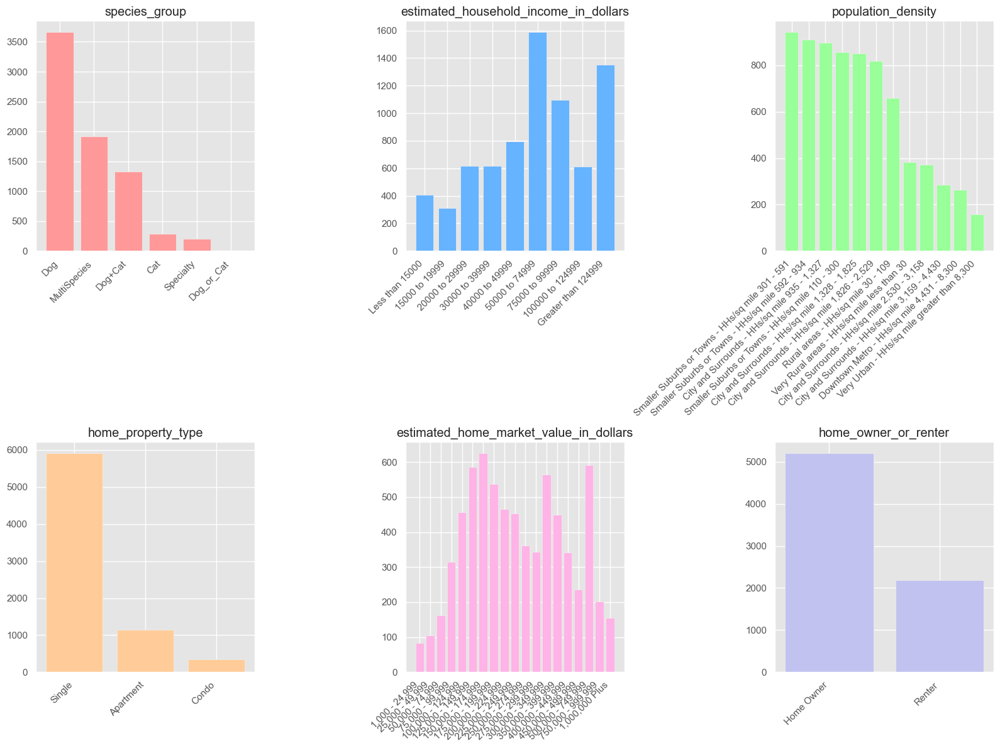

In [1976]:
# Create a 2x3 subplot grid
fig, axs = plt.subplots(2, 3, figsize=(16, 12))

# Define a list of colors to use for the bars
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99','#ffb3e6','#c2c2f0']

# Assuming you have a dictionary that maps each ordinal feature to its order
ordinal_mapping = {
    'estimated_home_market_value_in_dollars': [
        '1,000 - 24,999', '25,000 - 49,999', '50,000 - 74,999', '75,000 - 99,999', '100,000 - 124,999', 
        '125,000 - 149,999', '150,000 - 174,999', '175,000 - 199,999', '200,000 - 224,999', 
        '225,000 - 249,999', '250,000 - 274,999', '275,000 - 299,999', '300,000 - 349,999', 
        '350,000 - 399,999', '400,000 - 449,999', '450,000 - 499,999', '500,000 - 749,999', 
        '750,000 - 999,999', '1,000,000 Plus'
    ],
    'estimated_household_income_in_dollars': [
        'Less than 15000', '15000 to 19999', '20000 to 29999', '30000 to 39999', '40000 to 49999', 
        '50000 to 74999', '75000 to 99999', '100000 to 124999', 'Greater than 124999'
    ],
    # Add other ordinal features and their order here
}

# Loop through each feature and plot a bar chart of unique values
for i, col in enumerate(cat_col):
    row = i // 3  # determine which row to plot the current feature
    col_idx = i % 3  # determine the column index of the current feature
    
    # Check if the column is ordinal and get the correct order
    if col in ordinal_mapping:
        ordered_vals = ordinal_mapping[col]
        value_counts = df[col].value_counts().reindex(ordered_vals)
    else:
        value_counts = df[col].value_counts(sort=True)
    
    unique_vals = len(value_counts)
    
    axs[row, col_idx].bar(range(unique_vals), value_counts.values, color=colors[i])
    axs[row, col_idx].set_xticks(range(unique_vals))
    axs[row, col_idx].set_xticklabels(value_counts.index, rotation=45, ha='right')
    axs[row, col_idx].set_title(col)

# Remove any empty subplots
for j in range(i + 1, 6):
    fig.delaxes(axs[j // 3, j % 3])

plt.tight_layout()
# Save the figure to a file
fig.savefig('categorical_features.png', dpi=300)

plt.show()

**Findings:**

**1.species_group Category:**

    The majority of the individuals are in the 'Dog' category, followed by those with 'MultiSpecies'. This suggests that products or services targeting dog owners or multi-pet households could have a significant impact on sales.The 'Cat', 'Specialty', and 'Dog_or_Cat' categories have the fewest individuals. These groups may represent niche markets but could still offer valuable opportunities, depending on their spending behavior.

**2.estimated_household_income_in_dollars Category:**

    The income ranges '50000 to 74999', '75000 to 99999', and 'Greater than 124999' have the most individuals. These segments likely have strong purchasing power, making them key targets for higher-end products or services.Further analysis should correlate these income segments with total sales and profit margins to confirm their impact on the business.

**3.'population_density':**

    While it's true that there is a higher frequency of individuals in 'Smaller Suburbs or Towns - High rate 90.1 - 180', 'Small Cities & Suburbs - Moderate rate 45.1 - 90', and 'Smaller Suburbs or Towns - Moderate rate 45.1 - 90', this does not automatically imply that these areas are the most lucrative markets.
    To determine if these areas are truly crucial markets, analyze the correlation between these population density categories and total_sales and total_margin. This will help assess whether individuals in these categories are contributing significantly to revenue and profit.

**4.'estimated_home_market_value_in_dollars':**
    
    The distribution here seems to be more spread out, but there is a noticeable concentration in the middle-value ranges, particularly around '200,000 to 249,999' and '250,000 to 299,999'.These home value ranges might indicate a middle-class market, where consumers could be open to moderate luxury or premium products.

### Quick check on numerical columns

In [1977]:
# top 5 rows of numerical columns
df[num_col].head()

,total_sales,total_margin,total_units,total_txns,upt,spt,median_time_between_visit,days_from_last_visit,days_from_first_visit,std_time_between_visit,has_loyalty,profile_complete,visit_frequency,loyalty_discounts,cpn_discount,price_match_discounts,promo_discount,employee_discount,90_day_churn,90_day_sales
0,356.74,174.832,59,11,5.3636,32.4309,69,2,829,73.40,1,0,8,28.81,0.00,0.0,28.81,0.0,0,354.97
1,964.08,423.641,383,51,7.5098,18.9035,4,3,2190,26.30,1,0,47,24.55,11.05,0.0,37.64,0.0,0,285.47
2,311.67,202.542,21,7,3.0000,44.5243,8,128,452,110.81,1,1,7,7.12,0.00,0.0,7.12,0.0,1,0.00
3,50.45,25.973,5,1,5.0000,50.4500,251,251,251,0.00,1,1,1,4.50,0.00,0.0,4.50,0.0,1,0.00
4,255.74,105.050,12,6,2.0000,42.6233,63,234,2122,4.04,1,0,6,5.00,20.00,0.0,35.76,0.0,1,0.00


In [1978]:
# a quick look at numeric columns: distribution of numeric columns
df[num_col].describe()

,total_sales,total_margin,total_units,total_txns,upt,spt,median_time_between_visit,days_from_last_visit,days_from_first_visit,std_time_between_visit,has_loyalty,profile_complete,visit_frequency,loyalty_discounts,cpn_discount,price_match_discounts,promo_discount,employee_discount,90_day_churn,90_day_sales
count,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,7403.0,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000
mean,497.763231,239.016348,76.161421,10.751182,4.925949,48.119303,61.349183,89.164933,1349.975280,37.829543,1.0,0.611779,10.043091,30.180151,4.590583,4.248986,42.796822,1.221148,0.416453,84.350098
std,624.788678,286.522855,275.371698,11.920692,8.273318,31.476528,78.391526,98.886326,754.519115,43.891152,0.0,0.487378,11.072684,50.923795,21.881650,23.632387,85.181646,20.591730,0.493004,142.585765
min,0.420000,-266.346000,1.000000,1.000000,1.000000,0.420000,1.000000,0.000000,12.000000,0.000000,1.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,124.995000,63.943500,8.000000,3.000000,2.000000,29.261000,16.000000,14.000000,626.000000,7.690000,1.0,0.000000,3.000000,2.500000,0.000000,0.000000,3.720000,0.000000,0.000000,0.000000
50%,292.880000,146.016000,21.000000,7.000000,3.000000,42.715000,32.000000,46.000000,1492.000000,25.570000,1.0,1.000000,6.000000,12.510000,0.000000,0.000000,17.000000,0.000000,0.000000,29.390000
75%,631.665000,306.105500,50.000000,14.000000,4.615400,59.278600,69.000000,134.000000,2113.000000,52.220000,1.0,1.000000,13.000000,36.000000,0.000000,0.000000,48.420000,0.000000,1.000000,112.260000
max,10198.090000,3133.204000,9665.000000,139.000000,171.225800,633.466700,513.000000,389.000000,2192.000000,360.620000,1.0,1.000000,129.000000,964.820000,694.710000,875.370000,1891.930000,655.810000,1.000000,2244.340000


In [1979]:
# Count the number of each species group
species_counts = df['species_group'].value_counts()
most_common_species = species_counts.idxmax()
least_common_species = species_counts.idxmin()

print(f"Most common species group: {most_common_species}")
print(f"Least common species group: {least_common_species}")


Most common species group: Dog
Least common species group: Dog_or_Cat


#### A glance at numericals' distribution.

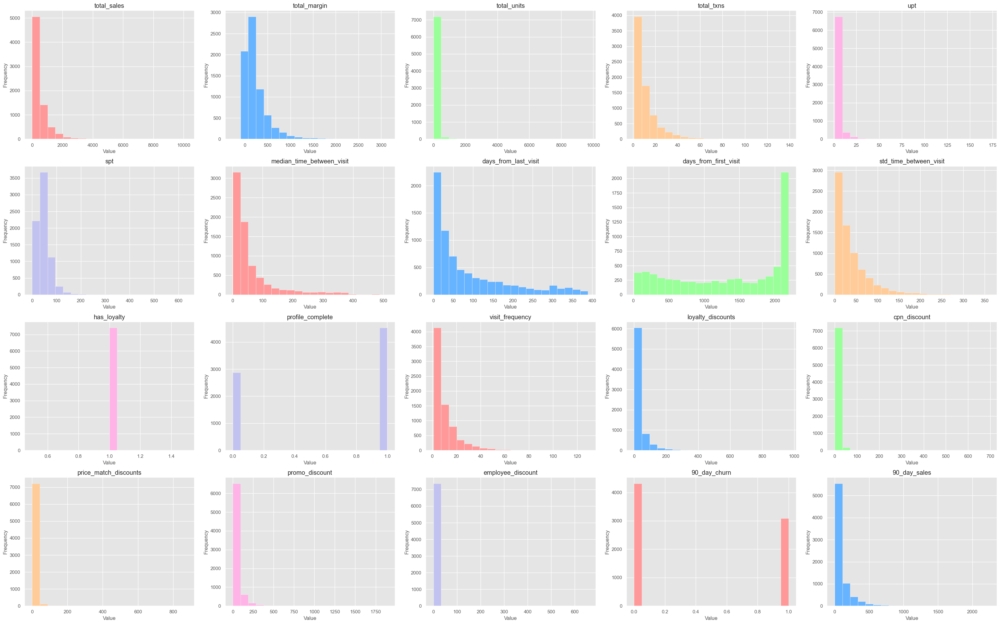

In [1980]:
# Create a 5x4 subplot grid to accommodate 20 features
fig, axs = plt.subplots(4, 5, figsize=(32, 20))  # Adjusted figsize for better visibility

# Define a list of colors to use for the histograms, repeated if necessary
colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#ffb3e6',
          '#c2c2f0', '#ff9999', '#66b3ff', '#99ff99', '#ffcc99',
          '#ffb3e6', '#c2c2f0', '#ff9999', '#66b3ff', '#99ff99',
          '#ffcc99', '#ffb3e6', '#c2c2f0', '#ff9999', '#66b3ff']

# Loop through each numerical feature and plot a histogram
for i, col in enumerate(num_col):
    row = i // 5  # determine which row to plot the current feature
    col_idx = i % 5  # determine the column index of the current feature
    
    # Plot histogram for the numerical column
    axs[row, col_idx].hist(df[col].dropna(), bins=20, color=colors[i])  # Drop NA values for valid plotting
    axs[row, col_idx].set_title(col)
    axs[row, col_idx].set_xlabel('Value')
    axs[row, col_idx].set_ylabel('Frequency')

plt.tight_layout()
# Save the figure to a file
fig.savefig('numeric_features_distribution.png', dpi=300)
plt.show()

**Findings：**

**1.Total Sales and Total Margin:**
    
    The distributions of total_sales and total_margin are right-skewed, indicating that the majority of customers contribute relatively low total sales and profit, while only a few customers generate high sales and profits. This distribution suggests that the company's revenue might depend on a small number of high-spending customers. The company could consider further analyzing the characteristics of these high-value customers and optimizing market strategies to increase the value of other customers.

**2.Total Units and Total Transactions:** 
    
    These two features also show a right-skewed distribution, where most customers have low purchase volumes and transaction counts, while a few customers have higher purchase frequencies and transaction counts. This might imply that loyal or frequent buyers are crucial to the overall business.

**3.UPT (Units per Transaction):** 
    
    The distribution of upt is relatively concentrated, with most values on the lower side, indicating that customers generally purchase fewer units per transaction. This might suggest that customers tend to buy fewer products at a time rather than stock up in large quantities.

**4.Has Loyalty:**
    
    All customers have loyalty plans, which suggests that this data comes from a pool of members or loyalty program participants. In the future, collecting data from non-loyalty program customers could be beneficial for comparative analysis of churn, sales, and margins.

**5.Visit Frequency:** 
    
    The distribution of visit_frequency is also right-skewed, showing that most customers have low visit frequencies, but a few customers visit frequently, possibly indicating they are loyal customers.

**6.Loyalty Discounts and Coupon Discounts:**
    
    The distributions of these discount features show that most customers enjoy relatively small discounts, while a few customers receive larger discounts. This might indicate that the company’s strategy involves offering more discounts and incentives to high-value customers. The next step should involve analyzing the distribution of discounts in relation to churn to determine if discounts significantly impact churn rates.

## skewness analysis

**Rule of thumb :**
- If the skewness is between -0.5 & 0.5, the data are nearly symmetrical.
- If the skewness is between -1 & -0.5 (negative skewed) or between 0.5 & 1(positive skewed), the data are slightly skewed.
- If the skewness is lower than -1 (negative skewed) or greater than 1 (positive skewed), the data are extremely skewed.

In [1981]:
# Check skewness of numrical columns
skewness = df[num_col].skew().to_frame().T
skewness

,total_sales,total_margin,total_units,total_txns,upt,spt,median_time_between_visit,days_from_last_visit,days_from_first_visit,std_time_between_visit,has_loyalty,profile_complete,visit_frequency,loyalty_discounts,cpn_discount,price_match_discounts,promo_discount,employee_discount,90_day_churn,90_day_sales
0,3.673088,3.243024,13.35394,2.915403,8.442523,4.645309,2.493839,1.324807,-0.364539,2.318736,0.0,-0.458819,2.862456,4.898712,17.43791,15.687759,7.513402,21.247149,0.339023,3.768755


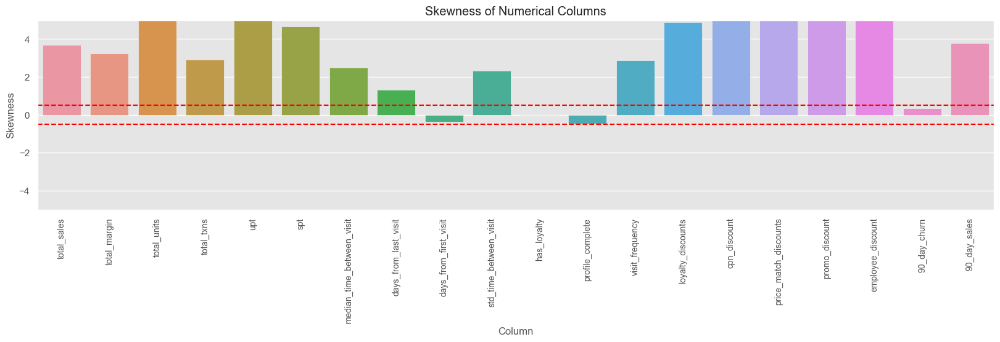

In [1982]:
# plot the skewness of numerical columns
# add dashed line at 0.5 and -0.5
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(20,4))
plt.ylim(-5, 5)

ax = sns.barplot(data=skewness)
# add dashed lines at the threshold values for moderate skewness
ax.axhline(y=0.5, color='red', linestyle='--')
ax.axhline(y=-0.5, color='red', linestyle='--')
plt.xticks(rotation=90, fontsize=10)

# add labels and title to the plot
ax.set_xlabel('Column')
ax.set_ylabel('Skewness')
ax.set_title('Skewness of Numerical Columns')
plt.show()

<p style="color:black; font-weight:bold; font-size:20px;">The chart shows that, except for the three variables 'days_from_first_visit', 'has_loyalty', 'profile_complete', '90_day_churn', all the other variables are skewed.</p>
    
<p style="color:black; font-weight:bold; font-size:20px;">The analysis of data skewness can be integrated with the distribution of missing values for a comprehensive analysis, providing a basis for determining the strategy for filling in missing values.</p>

In [1983]:
# determine normally distributed and skewed columns
num_col_norm = [col for col in skewness.columns if (-0.5 < skewness[col].values < 0.5)]
num_col_skew = [col for col in skewness.columns if col not in num_col_norm]

In [1984]:
# print column names for each group
print("There are {} normally distributed columns:".format(len(num_col_norm)))
print(num_col_norm)
print('='*100)
print("There are {} skewed columns:".format(len(num_col_skew)))
print(num_col_skew)

There are 4 normally distributed columns:
['days_from_first_visit', 'has_loyalty', 'profile_complete', '90_day_churn']
There are 16 skewed columns:
['total_sales', 'total_margin', 'total_units', 'total_txns', 'upt', 'spt', 'median_time_between_visit', 'days_from_last_visit', 'std_time_between_visit', 'visit_frequency', 'loyalty_discounts', 'cpn_discount', 'price_match_discounts', 'promo_discount', 'employee_discount', '90_day_sales']


**We have 20 numerical columns. 4 out of 20 columns are close to normal distributed, with the rest of 16 columns are skewed.**

<a id='Data_Quality'></a>
<h2 style="color:blue">Missing Values</h2>

<a id='Data_Quality'></a>
<h3 style="color:blue">A glance of Missing Values</h2>

In [1985]:
# To check the missing values in the dataset.
pd.DataFrame({'missing':df.isnull().sum(),
              'missing percentage': df.isnull().sum() / len(df)*100
              }
).sort_values(by=['missing'],ascending = False)

,missing,missing percentage
0,,
estimated_home_market_value_in_dollars,370,4.997974
total_sales,0,0.000000
total_margin,0,0.000000
90_day_churn,0,0.000000
employee_discount,0,0.000000
promo_discount,0,0.000000
price_match_discounts,0,0.000000
cpn_discount,0,0.000000
loyalty_discounts,0,0.000000


**Now let's look at the distribution of missing values in dataset**

<AxesSubplot: >

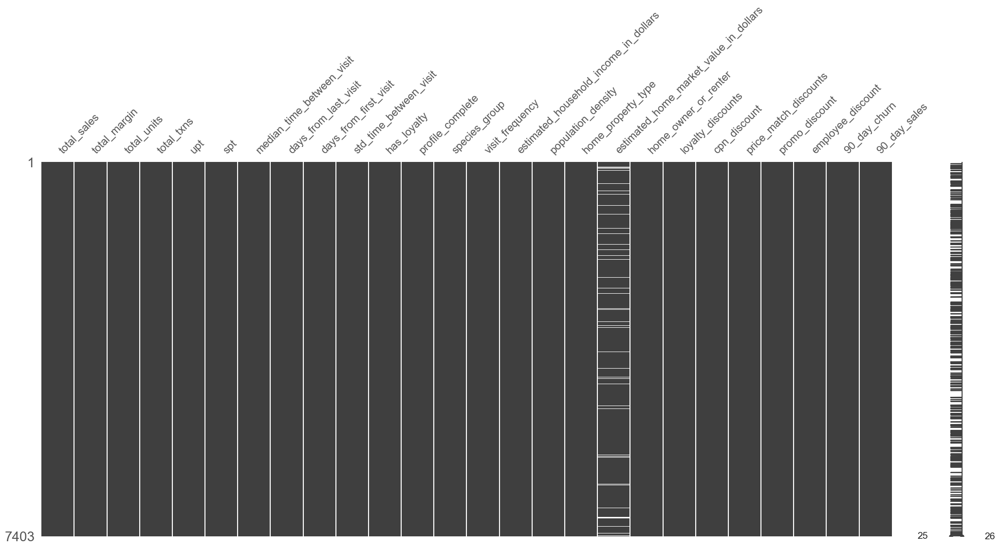

In [1986]:
mno.matrix(df)

Total 1 features have missing values.


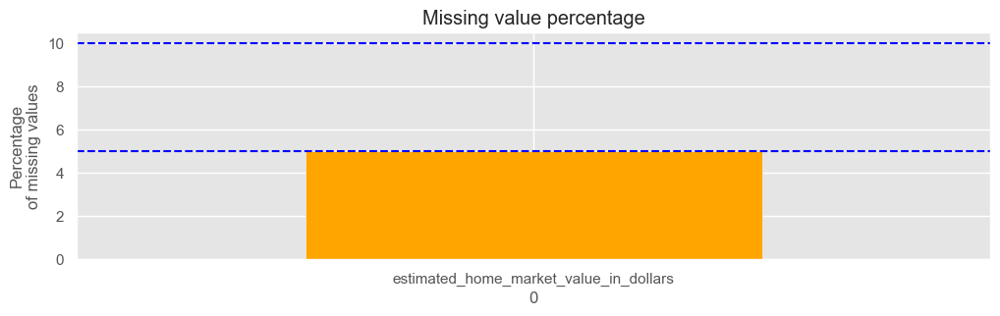

In [1987]:
# Plot missing value percentage
# dash line set at 5%

print(f"Total {sum(df.isnull().mean()>0)} features have missing values.")
print('='*60)

ax = (df.isnull().mean()
            .nlargest(sum(df.isnull().mean()>0))
            .mul(100)
            .plot(kind='bar', figsize=(12,3),color='orange',
                  title='Missing value percentage')
     )

ax.axhline(y=5, color='blue', linestyle='--')
ax.axhline(y=10, color='blue', linestyle='--')
ax.set_ylabel('Percentage\nof missing values')
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
plt.show()

In [1988]:
df.estimated_home_market_value_in_dollars.unique()

array(['350,000 - 399,999', '150,000 - 174,999', '125,000 - 149,999',
       '225,000 - 249,999', '250,000 - 274,999', '500,000 - 749,999',
       '300,000 - 349,999', '175,000 - 199,999', '75,000 - 99,999',
       '400,000 - 449,999', '50,000 - 74,999', '100,000 - 124,999',
       '200,000 - 224,999', '275,000 - 299,999', nan, '450,000 - 499,999',
       '750,000 - 999,999', '1,000 - 24,999', '25,000 - 49,999',
       '1,000,000 Plus'], dtype=object)

In [1989]:
len(df.estimated_home_market_value_in_dollars.unique())

20

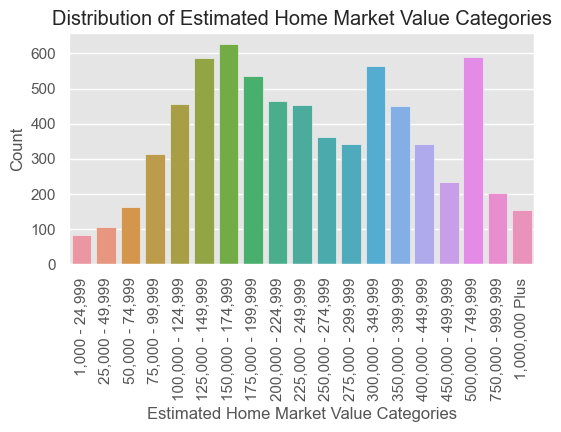

In [1990]:
# Convert the ordinal variables to ordered categorical types
df['estimated_home_market_value_in_dollars'] = pd.Categorical(
    df['estimated_home_market_value_in_dollars'], 
    categories=[
        '1,000 - 24,999', '25,000 - 49,999', '50,000 - 74,999', '75,000 - 99,999', '100,000 - 124,999', 
        '125,000 - 149,999', '150,000 - 174,999', '175,000 - 199,999', '200,000 - 224,999', 
        '225,000 - 249,999', '250,000 - 274,999', '275,000 - 299,999', '300,000 - 349,999', 
        '350,000 - 399,999', '400,000 - 449,999', '450,000 - 499,999', '500,000 - 749,999', 
        '750,000 - 999,999', '1,000,000 Plus'
    ],
    ordered=True
)

plt.figure(figsize=(6, 3))
sns.countplot(data=df, x='estimated_home_market_value_in_dollars')
plt.title('Distribution of Estimated Home Market Value Categories')
plt.xlabel('Estimated Home Market Value Categories')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

In [1991]:
# Convert categorical types to object types
df['estimated_home_market_value_in_dollars'] = df['estimated_home_market_value_in_dollars'].astype('object')

**The above shows that estimated_home_market_value_in_dollars has a relatively scattered distribution, and we will discuss how to handle missing values in the EDA phase below.**

<a id='Data_Quality'></a>
<h3 style="color:blue">Mising value fillin strategies</h2>

**Because the feature with missing values is a category feature, the processing method is different from that of numerical features. At present, the filling of numerical features is not discussed, but we only discuss the filling strategy of numerical features.**


1. Understanding missing data:

Missing ratio: The missing ratio for this feature is relatively low at 4.99%, so it is recommended to retain most of the information of the dataset by filling in missing values rather than deleting rows. It should be said that no rows should be deleted at any time, but that in-depth investigation should be conducted to retain as much data information as possible.
Importance of category characteristic: This characteristic represents the estimated market value of the property and predicts that it may be a key factor in customer segmentation or churn models and therefore needs to be carefully handled.


2. Filling strategies are generally available

Mode filling: If some categories dominate the distribution (for example, if a value is particularly common), it is a simple and effective strategy to fill in missing values with mode (the category with the highest frequency of occurrence).
Probability filling: If the categories are evenly distributed, we can consider filling in missing values according to the probability distribution of non-missing data, which can maintain the natural variation of features.
Using auxiliary features: It is also possible to consider using related features to predict missing values and fill them in using supervised learning methods (e.g., decision tree classification models).

3. Alternative strategies:

Create a new category: Introduce a new category (for example, "Unknown") to represent missing values, especially when the missing itself may be informative.
Multiple imputation: For a more robust analysis, consider the use of multiple imputation techniques, generating multiple possible values and combining the results to reduce uncertainty.**

4. Final consideration:

**On the basis of K-means clustering, it is considered to use the median, mean, mode or other algorithm method to fill in the missing values in each cluster rather than in the whole data set. This practice can better capture the local characteristics of the data, thus improving the accuracy of the model.**

**I will discuss the detaill after RFM and Kmeans analysis**

<a id='Data_Quality'></a>
<h2 style="color:blue">Target Label</h2>

<p style="color:black; font-weight:bold; font-size:18px;">In the PetStore dataset, the 90_day_churn and 90_day_sales fields play crucial roles. These fields are aggregated over the 90 days immediately following the 365-day observation period described by the other features.</p>

<p style="color:black; font-weight:bold; font-size:18px;">90_day_churn: This field indicates whether a customer has ceased shopping at PetStore within the past 90 days, with binary values (1 = churned, 0 = not churned). This makes it an ideal target variable for predicting customer churn risk, well-suited for classification models. Selecting 90_day_churn as the target variable aligns with the business goal of enhancing customer retention.</p>

<p style="color:black; font-weight:bold; font-size:18px;">90_day_sales: This field reflects the total amount purchased by the customer during the 90-day observation period. Once a customer is predicted to retain, this field can serve as a valuable target variable for predicting future purchasing behavior. Such information helps in making more precise sales forecasts and managing inventory.</p>

<p style="color:black; font-weight:bold; font-size:18px;">Overall, using 90_day_churn as the target variable assists in developing models aimed at identifying customers at high risk of churn, while 90_day_sales is suitable for tasks related to sales forecasting and customer value assessment. This distinction enables the company to accurately predict sales trends and manage inventory, while also customizing strategies and models for different business needs, thus enhancing revenue potential while maintaining current customers.</p>

<p style="color:black; font-weight:bold; font-size:24px;">In this modeling task, I am selecting 90_day_churn as the target variable, with 90_day_sales as a topic for future discussion.</p>

****percentage of customers churned over the 90-day window (90_day_churn = 1)****

In [1992]:
# Calculate the number of churned customers
churned_customers = df['90_day_churn'].sum()

# Calculate the total number of customers
total_customers = df['90_day_churn'].count()

# Calculate the churn rate percentage
churn_rate = (churned_customers / total_customers) * 100
churn_count = len(df[df['90_day_churn'] == 0])
not_churn_count = len(df[df['90_day_churn'] == 1])
print(f"Percentage of customers who churned within the 90-day window: {churn_rate:.2f}%")

Percentage of customers who churned within the 90-day window: 41.65%


In [1993]:
import plotly.express as px


data = {
    'Churn Status': ['Churned', 'Not Churned'],
    'Value': [churn_count, not_churn_count]
}

# Define color palette
pal_ = ['#ff9999','#66b3ff']

# Create the donut chart using Plotly
fig = px.pie(data, values='Value', names='Churn Status',
             color_discrete_sequence=pal_)

# Update traces for better aesthetics
fig.update_traces(textposition='outside', textinfo='percent+label', 
                  hole=.6, hoverinfo="label+percent+name")

# Update layout for the figure
fig.update_layout(width=600, height=600,
                  margin=dict(t=0, l=0, r=0, b=0))
fig.write_image("90_day_churn_donut_chart.png")
# Show the chart
fig.show()


<p style="color:black; font-weight:bold; font-size:20px;">Target Variable Analysis</p>

<p style="color:black; font-weight:bold; font-size:20px;"><Target Variable: 90_day_churn/p>
    
<p style="color:black; font-weight:bold; font-size:20px;">Class Distribution:</p>
    <p style="color:black; font-weight:bold; font-size:15px;">0 (Non-Churn): 58.4%</p>
    <p style="color:black; font-weight:bold; font-size:15px;">1 (Churn): 41.6%</p>

<p style="color:black; font-weight:bold; font-size:20px;">Insights:</p>

    1.The target variable 90_day_churn is slightly imbalanced, with a larger proportion of non-churners (58.4%) compared to churners (41.6%).
    
    2.While this imbalance is not extreme, it is still worth considering techniques to address it, such as oversampling, undersampling, or using specific evaluation metrics that account for class imbalance.

    3.However, it is particularly noteworthy that a churn rate of 41.6% is relatively high compared to the average churn rates observed in many industries, which typically range from 15% to 25%. A key concern is how this churn rate compares within the pet industry. Investigating and comparing this rate against the average churn rate in the pet industry is essential to understand its relative position and determine if it is an outlier.

    4.Regardless of industry comparison, a churn rate of 41.6% indicates significant room for improvement. Further investigation is needed to uncover the factors contributing to this high churn rate and to develop and implement effective strategies to address it.

## Data Split

**To avoid data leakage, I will split training data into df_train and df_test. I will use df_train for EDA and model building. df_valid will be used for cross validation and haperparameter tunning.**

In [1994]:
from sklearn.model_selection import train_test_split
df_train, df_test = train_test_split(df,
                                      test_size=0.2,
                                      stratify = df['90_day_churn'],
                                      random_state= 42
)

In [1995]:
df_train.info(), print('='*50), df_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5922 entries, 6053 to 5219
Data columns (total 26 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   total_sales                             5922 non-null   float64
 1   total_margin                            5922 non-null   float64
 2   total_units                             5922 non-null   int64  
 3   total_txns                              5922 non-null   int64  
 4   upt                                     5922 non-null   float64
 5   spt                                     5922 non-null   float64
 6   median_time_between_visit               5922 non-null   int64  
 7   days_from_last_visit                    5922 non-null   int64  
 8   days_from_first_visit                   5922 non-null   int64  
 9   std_time_between_visit                  5922 non-null   float64
 10  has_loyalty                             5922 non-null   int64 

(None, None, None)

In [1996]:
cat_col_train = [col for col in df_train.columns if df_train[col].dtype == 'object']
num_col_train = [col for col in df_train.columns if col not in cat_col_train]
print('cat_col_train : {} \n\
num_col_train : {}'.format(len(cat_col_train), len(num_col_train)))

cat_col_train : 6 
num_col_train : 20


## Summary of Data Qualiity

<p style="color:black; font-weight:bold; font-size:20px;"></p>


**Side: 7403 entries, total 26 columns**

**skewness: 4 out of 20 columns are close to normal distributed, with the rest of 16 columns are skewed.**

**Column with Missing Data: estimated_home_market_value_in_dollars**

**Missing Values: 370 (approx. 5% of the dataset).**

**Target variable : '90_day_churn'**

**Class Distribution:**

    0 (Non-Churn): 58.4%

    1 (Churn): 41.6%

**Action Needed:**  
    
    Need to go further study and take appropriate strategies to address it. Consider imputing the missing values using methods like mode, mean, median, or advanced techniques (e.g., KNN, regression). 

**Columns without Missing Data:**
    
    All other columns are complete with no missing values, making them ready for analysis.

<a id="4"></a>
<h1 style="background-color:#16DCC9;font-family:Calibri;font-size:200%;text-align:center">Customer Segmentation Analysis</h1>

<p style="color:black; font-weight:bold; font-size:20px;">Why we Need Segmentation Analysis</p>
    
    Not all users are the same.Segmentation before churn classification allows us to tailor the model to distinct customer groups, leading to more accurate predictions and targeted retention strategies. By understanding the unique behaviors and risks within each segment, we can develop personalized interventions and optimize resource allocation, ultimately improving the effectiveness of our churn management efforts.

    RFM analysis (Recency, Frequency, Monetary) helps to identify the most valuable customer groups by measuring the time of the customer's last purchase (Recency), the Frequency of purchase (Frequency) and the amount spent (Monetary). It can be used to optimize marketing strategies, enhance customer loyalty, and increase sales and customer lifetime value (CLV).

<p style="color:black; font-weight:bold; font-size:20px;">In this project, I designed the RFM Analysis to segment customers based on their purchasing behavior, focusing on three key metrics: Recency, Frequency, and Monetary value. Recency was measured using the variable days_from_last_visit, indicating how recently a customer made a purchase. Frequency was captured through the variable total_txns, representing the total number of transactions a customer completed. Monetary value was determined by the variable total_sales, reflecting the total amount spent by the customer. These metrics were then scored and combined to create an overall RFM score, which was used to categorize customers into different loyalty levels, providing a nuanced understanding of customer behavior for targeted marketing strategies.</p>

<h2 style="color:blue">RFM Analysis</h2>

In [1997]:
# Step 1: Calculate RFM scores

# Recency Score: The lower the days_from_last_visit, the higher the score
df_train['recency_score'] = pd.qcut(df_train['days_from_last_visit'], 5, labels=[5, 4, 3, 2, 1])

# Frequency Score: The higher the total_txns, the higher the score
df_train['frequency_score'] = pd.qcut(df_train['total_txns'], 5, labels=[1, 2, 3, 4, 5])

# Monetary Score: The higher the total_sales, the higher the score
df_train['monetary_score'] = pd.qcut(df_train['total_sales'], 5, labels=[1, 2, 3, 4, 5])

# Combine RFM scores into a single RFM score
df_train['RFM_Score'] = df_train[['recency_score', 'frequency_score', 'monetary_score']].sum(axis=1).astype(int)

df_train.head()

,total_sales,total_margin,total_units,total_txns,upt,spt,median_time_between_visit,days_from_last_visit,days_from_first_visit,std_time_between_visit,has_loyalty,profile_complete,species_group,visit_frequency,estimated_household_income_in_dollars,population_density,home_property_type,estimated_home_market_value_in_dollars,home_owner_or_renter,loyalty_discounts,cpn_discount,price_match_discounts,promo_discount,employee_discount,90_day_churn,90_day_sales,recency_score,frequency_score,monetary_score,RFM_Score
6053,25.97,18.720,3,1,3.0000,25.9700,369,369,1045,0.00,1,0,Dog,1,50000 to 74999,"City and Surrounds - HHs/sq mile 935 - 1,327",Single,"125,000 - 149,999",Home Owner,0.00,0.0,0.0,0.00,0.0,1,0.00,1,1,1,3
3740,363.80,254.718,26,10,2.6000,36.3800,7,72,234,27.12,1,1,Dog,9,30000 to 39999,Very Rural areas - HHs/sq mile less than 30,Single,"450,000 - 499,999",Home Owner,10.00,0.0,0.0,10.00,0.0,0,64.45,3,4,3,10
3082,101.68,52.975,8,3,2.6667,33.8933,3,101,371,186.68,1,0,Dog,3,100000 to 124999,"City and Surrounds - HHs/sq mile 1,328 - 1,825",Single,"275,000 - 299,999",Renter,6.75,0.0,0.0,6.75,0.0,1,0.00,2,1,2,5
5709,1784.80,840.003,471,39,12.0769,45.7641,9,6,2171,14.87,1,1,Dog+Cat,38,100000 to 124999,Smaller Suburbs or Towns - HHs/sq mile 592 - 934,Apartment,"200,000 - 224,999",Renter,114.53,5.5,1.5,121.53,0.0,0,85.14,5,5,5,15
1392,1168.71,365.288,514,28,18.3571,41.7396,15,4,2175,11.91,1,1,Dog+Cat,28,Greater than 124999,"Downtown Metro - HHs/sq mile 4,431 - 8,300",Single,"1,000,000 Plus",Home Owner,53.03,3.0,0.0,57.83,0.0,0,106.11,5,5,5,15


**we use kmeans to cluster RFMscores to different groups.**

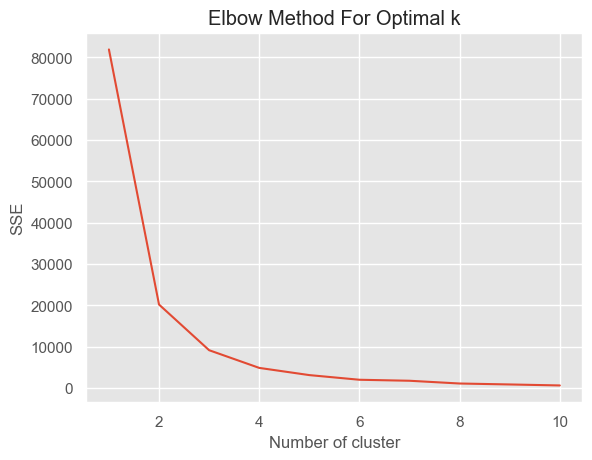

In [1998]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

sse = {}
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42).fit(df_train[['RFM_Score']])
    sse[k] = kmeans.inertia_  # Sum of squared distances of samples to their closest cluster center

plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.title("Elbow Method For Optimal k")
plt.show()

<p style="color:black; font-weight:bold; font-size:20px;">Elbow method suggests that k=3 is a good choice</p>

In [1999]:
# Step 2: Apply KMeans clustering
k = 3
kmeans = KMeans(n_clusters=k, random_state=42)
df_train['RFM_Loyalty_Level'] = kmeans.fit_predict(df_train[['RFM_Score']])

# Calculate the median RFM_Score for each cluster
medians = df_train.groupby('RFM_Loyalty_Level')['RFM_Score'].median()

# Sort the cluster indices by median RFM_Score
sorted_indices = medians.sort_values().index

# Create a mapping from old cluster indices to the labels "Low", "Medium", "High"
labels_mapping = {old_index: label for old_index, label in zip(sorted_indices, ["Low", "Medium", "High"])}

# Apply the mapping to the RFM_Loyalty_Level column
df_train['RFM_Loyalty_Level'] = df_train['RFM_Loyalty_Level'].map(labels_mapping)

In [2000]:
df_train.head()

,total_sales,total_margin,total_units,total_txns,upt,spt,median_time_between_visit,days_from_last_visit,days_from_first_visit,std_time_between_visit,has_loyalty,profile_complete,species_group,visit_frequency,estimated_household_income_in_dollars,population_density,home_property_type,estimated_home_market_value_in_dollars,home_owner_or_renter,loyalty_discounts,cpn_discount,price_match_discounts,promo_discount,employee_discount,90_day_churn,90_day_sales,recency_score,frequency_score,monetary_score,RFM_Score,RFM_Loyalty_Level
6053,25.97,18.720,3,1,3.0000,25.9700,369,369,1045,0.00,1,0,Dog,1,50000 to 74999,"City and Surrounds - HHs/sq mile 935 - 1,327",Single,"125,000 - 149,999",Home Owner,0.00,0.0,0.0,0.00,0.0,1,0.00,1,1,1,3,Low
3740,363.80,254.718,26,10,2.6000,36.3800,7,72,234,27.12,1,1,Dog,9,30000 to 39999,Very Rural areas - HHs/sq mile less than 30,Single,"450,000 - 499,999",Home Owner,10.00,0.0,0.0,10.00,0.0,0,64.45,3,4,3,10,Medium
3082,101.68,52.975,8,3,2.6667,33.8933,3,101,371,186.68,1,0,Dog,3,100000 to 124999,"City and Surrounds - HHs/sq mile 1,328 - 1,825",Single,"275,000 - 299,999",Renter,6.75,0.0,0.0,6.75,0.0,1,0.00,2,1,2,5,Low
5709,1784.80,840.003,471,39,12.0769,45.7641,9,6,2171,14.87,1,1,Dog+Cat,38,100000 to 124999,Smaller Suburbs or Towns - HHs/sq mile 592 - 934,Apartment,"200,000 - 224,999",Renter,114.53,5.5,1.5,121.53,0.0,0,85.14,5,5,5,15,High
1392,1168.71,365.288,514,28,18.3571,41.7396,15,4,2175,11.91,1,1,Dog+Cat,28,Greater than 124999,"Downtown Metro - HHs/sq mile 4,431 - 8,300",Single,"1,000,000 Plus",Home Owner,53.03,3.0,0.0,57.83,0.0,0,106.11,5,5,5,15,High


In [2001]:
df_train['RFM_Loyalty_Level'].value_counts()

RFM_Loyalty_Level
Low       2369
Medium    1816
High      1737
Name: count, dtype: int64

In [2002]:
# Columns to conversion
cols_to_num = ['recency_score', 'frequency_score', 'monetary_score']

# Convert cols_to_num columns to numeric types
for col in cols_to_num:
    df_train[col] = pd.to_numeric(df_train[col], errors='coerce')

In [2003]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5922 entries, 6053 to 5219
Data columns (total 31 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   total_sales                             5922 non-null   float64
 1   total_margin                            5922 non-null   float64
 2   total_units                             5922 non-null   int64  
 3   total_txns                              5922 non-null   int64  
 4   upt                                     5922 non-null   float64
 5   spt                                     5922 non-null   float64
 6   median_time_between_visit               5922 non-null   int64  
 7   days_from_last_visit                    5922 non-null   int64  
 8   days_from_first_visit                   5922 non-null   int64  
 9   std_time_between_visit                  5922 non-null   float64
 10  has_loyalty                             5922 non-null   int64 

In [2004]:
cat_col_train = [col for col in df_train.columns if df_train[col].dtype in ['object', 'category']]
num_col_train = [col for col in df_train.columns if col not in cat_col_train]
print('cat_col_train : {} \n\
num_col_train : {}'.format(len(cat_col_train), len(num_col_train)))

cat_col_train : 7 
num_col_train : 24


### A glance at the distribution of RFM_Score and RFM_Loyalty_Level.

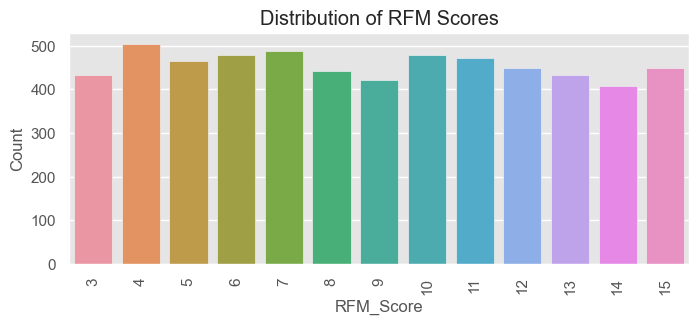

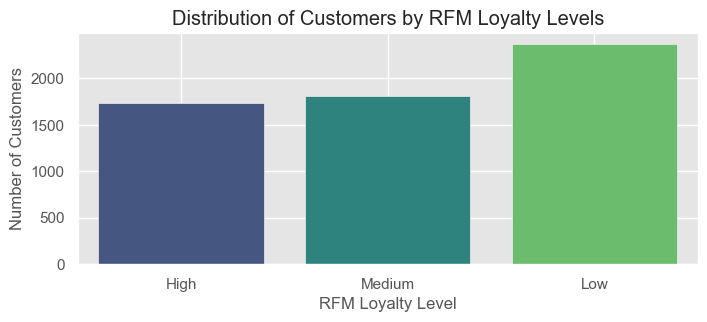

In [2005]:
plt.figure(figsize=(8, 3))
sns.countplot(data=df_train, x='RFM_Score')
plt.title('Distribution of RFM Scores')
plt.xlabel('RFM_Score')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()


# Plot distribution of Loyalty Levels
plt.figure(figsize=(8, 3))
ax = sns.countplot(x='RFM_Loyalty_Level', data=df_train, order=['High', 'Medium', 'Low'], palette='viridis')
ax.set(title='Distribution of Customers by RFM Loyalty Levels', xlabel='RFM Loyalty Level', ylabel='Number of Customers')
plt.grid(True) 
plt.show()

<p style="color:black; font-weight:bold; font-size:20px;">insights of RFM Analysis：</p>

    From the chart, we can see that the distribution of RFM scores across different levels is relatively even, with customers having an RFM score of 4 being the most numerous, close to 500. The number of customers with an RFM score of 13 is the lowest, slightly below 400. The overall trend is fairly stable, with no significant peaks or troughs. This suggests that the distribution of customers' RFM scores is relatively uniform within the range of 3 to 15.

    From the chart, it is also evident that the distribution of customer loyalty levels is uneven. Customers in the "Low" loyalty level are the most numerous, exceeding 2,000, while the number of customers in the "High" and "Medium" loyalty levels is relatively close, at around 1,500 each. This distribution may indicate that a large proportion of customers have lower RFM scores, meaning they haven't made recent purchases, purchase infrequently, or spend less. As a result, these customers may require more incentives or marketing activities to improve their loyalty.

    Customers grouped in the same category tend to exhibit similar characteristics, which suggests that further analysis is needed to understand their behaviors and preferences better.

<h2 style="color:blue">Kmeans Analysis for all features</h2>

<p style="color:black; font-weight:bold; font-size:20px;">Why we Need Kmeans Analysis</p>

    RFM analysis, while effective, has its limitations:

    Limited Dimensions: RFM only considers three dimensions (Recency, Frequency, and Monetary), which may not fully capture the complexity of customer behavior and needs. Other important factors, such as customer preferences, purchase channels, and product categories, are overlooked.

    Inability to Reveal Complex Relationships: RFM relies on simple scores or segments, which cannot uncover complex patterns or nonlinear relationships in customer behavior. This might lead to overly simplistic customer classifications.

    Not Suitable for All Industries: In some industries, customer purchasing behavior may not align with the assumptions of RFM, such as businesses with high frequency but low monetary transactions.

    Therefore, after conducting RFM analysis, it can be used as a new feature in the original data and combined with K-means clustering. This approach allows the incorporation of additional dimensions, uncovering more nuanced customer segments, and addressing RFM's limitations to gain more comprehensive customer insights.

<p style="color:black; font-weight:bold; font-size:20px;">Based on the temporal misalignment and potential bias these features could introduce, I decided not to include '90_day_churn' and '90_day_sales' in the K-means analysis. These metrics are based on data from a period immediately following the 365-day window covered by the other features, which could skew the clustering results towards future behavior rather than focusing on the characteristics and behaviors during the original period of interest. Including them might lead to clusters that reflect outcomes rather than the inherent features of the data during the 365-day period.</p>

In [2006]:
# use colums without '90_day_churn'and '90_day_sales’ to apply kmeans.
num_col_kmean_train = [col for col in num_col_train if col not in ['90_day_churn', '90_day_sales']]

In [2007]:
# Step 1: Standardize the data before K-means clustering
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_train[num_col_kmean_train])

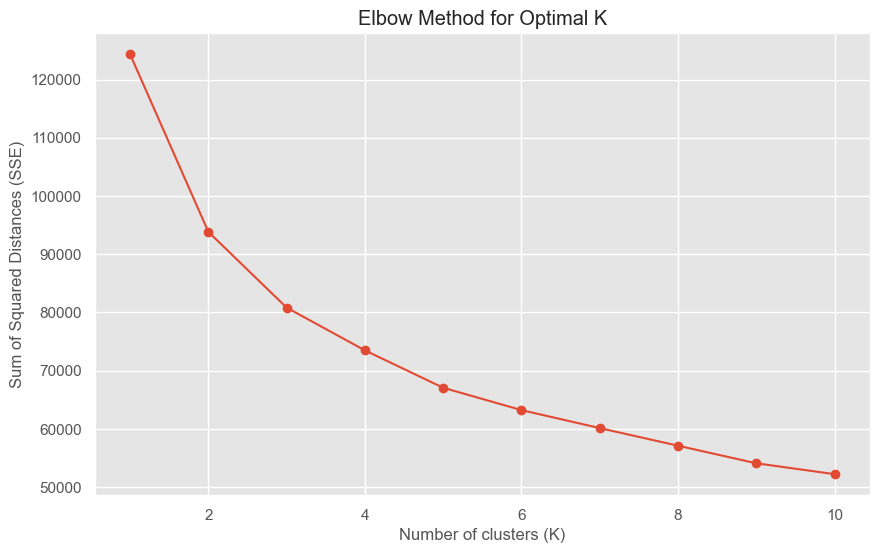

In [2008]:
# Step 2: Use the Elbow method to find the optimal number of clusters
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt


# Use the Elbow method to find the optimal number of clusters
sse = []
k_values = range(1, 11)
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_scaled)
    sse.append(kmeans.inertia_)

# Plot the Elbow curve
plt.figure(figsize=(10, 6))
plt.plot(k_values, sse, marker='o')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Sum of Squared Distances (SSE)')
plt.show()

**From the above figure, 3,4,5 can be used as the optimal K, which requires further observation.**

In [2009]:
from sklearn.metrics import silhouette_score

# Calculate silhouette scores
# Define the range of clusters to test
n_clusters = [3, 4, 5, 6, 7]

# Initialize dictionaries to store scores
inertia_scores = {}
silhouette_scores = {}

# Perform K-means clustering and calculate scores
for k in n_clusters:
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_results = kmeans.fit_predict(df_scaled)
    inertia_scores[k] = kmeans.inertia_
    silhouette_scores[k] = silhouette_score(df_scaled, cluster_results)

# Print the silhouette scores
print("Silhouette Scores:")
for k in n_clusters:
    print(f"K={k}: {silhouette_scores[k]}")

Silhouette Scores:
K=3: 0.23116257221559164
K=4: 0.22539371586866053
K=5: 0.17040287510476143
K=6: 0.16171755601663482
K=7: 0.1566470259212344


**Based on the results above, we choose K = 3**

 **design a K-means-based loyalty level and assign new labels to each data point based on the chosen K=3**

In [2010]:
# Step 2: Apply KMeans clustering
k = 3
kmeans = KMeans(n_clusters=k, random_state=42)
df_train['KMeans_Loyalty_Level'] = kmeans.fit_predict(df_scaled)

# Calculate the median RFM_Score for each cluster
medians = df_train.groupby('KMeans_Loyalty_Level')['RFM_Score'].median()

# Sort the cluster indices by median RFM_Score
sorted_indices = medians.sort_values().index

# Create a mapping from old cluster indices to the labels "Low", "Medium", "High"
labels_mapping = {old_index: label for old_index, label in zip(sorted_indices, ["Low", "Medium", "High"])}

# Apply the mapping to the RFM_Loyalty_Level column
df_train['KMeans_Loyalty_Level'] = df_train['KMeans_Loyalty_Level'].map(labels_mapping)

In [2011]:
df_train.head()

,total_sales,total_margin,total_units,total_txns,upt,spt,median_time_between_visit,days_from_last_visit,days_from_first_visit,std_time_between_visit,has_loyalty,profile_complete,species_group,visit_frequency,estimated_household_income_in_dollars,population_density,home_property_type,estimated_home_market_value_in_dollars,home_owner_or_renter,loyalty_discounts,cpn_discount,price_match_discounts,promo_discount,employee_discount,90_day_churn,90_day_sales,recency_score,frequency_score,monetary_score,RFM_Score,RFM_Loyalty_Level,KMeans_Loyalty_Level
6053,25.97,18.720,3,1,3.0000,25.9700,369,369,1045,0.00,1,0,Dog,1,50000 to 74999,"City and Surrounds - HHs/sq mile 935 - 1,327",Single,"125,000 - 149,999",Home Owner,0.00,0.0,0.0,0.00,0.0,1,0.00,1,1,1,3,Low,Low
3740,363.80,254.718,26,10,2.6000,36.3800,7,72,234,27.12,1,1,Dog,9,30000 to 39999,Very Rural areas - HHs/sq mile less than 30,Single,"450,000 - 499,999",Home Owner,10.00,0.0,0.0,10.00,0.0,0,64.45,3,4,3,10,Medium,Medium
3082,101.68,52.975,8,3,2.6667,33.8933,3,101,371,186.68,1,0,Dog,3,100000 to 124999,"City and Surrounds - HHs/sq mile 1,328 - 1,825",Single,"275,000 - 299,999",Renter,6.75,0.0,0.0,6.75,0.0,1,0.00,2,1,2,5,Low,Low
5709,1784.80,840.003,471,39,12.0769,45.7641,9,6,2171,14.87,1,1,Dog+Cat,38,100000 to 124999,Smaller Suburbs or Towns - HHs/sq mile 592 - 934,Apartment,"200,000 - 224,999",Renter,114.53,5.5,1.5,121.53,0.0,0,85.14,5,5,5,15,High,High
1392,1168.71,365.288,514,28,18.3571,41.7396,15,4,2175,11.91,1,1,Dog+Cat,28,Greater than 124999,"Downtown Metro - HHs/sq mile 4,431 - 8,300",Single,"1,000,000 Plus",Home Owner,53.03,3.0,0.0,57.83,0.0,0,106.11,5,5,5,15,High,Medium


In [2012]:
df_train['KMeans_Loyalty_Level'].value_counts()

KMeans_Loyalty_Level
Low       2949
Medium    2599
High       374
Name: count, dtype: int64

### A glance at the distribution of KMeans_Loyalty_Level.

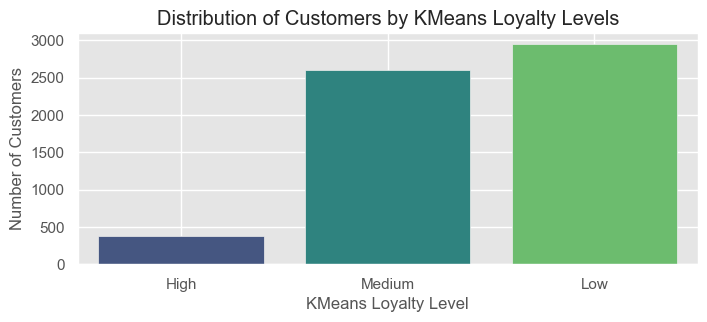

In [2013]:
# Plot distribution of Loyalty Levels
plt.figure(figsize=(8, 3))
ax = sns.countplot(x='KMeans_Loyalty_Level', data=df_train, order=['High', 'Medium', 'Low'], palette='viridis')
ax.set(title='Distribution of Customers by KMeans Loyalty Levels', xlabel='KMeans Loyalty Level', ylabel='Number of Customers')
plt.grid(True) 
plt.show()

In [2014]:
#compare the similarity between the classifications in the columns RFM_Loyalty_Level and KMeans_Loyalty_Level
similarity_ratio = (df_train['RFM_Loyalty_Level'] == df_train['KMeans_Loyalty_Level']).mean()
similarity_ratio

0.6681864235055724

<p style="color:black; font-weight:bold; font-size:20px;">The similarity ratio of approximately 66.82% derived from comparing RFM_Loyalty_Level and KMeans_Loyalty_Level suggests that about two-third of the classifications from the two methods agree with each other. </p>

<p style="color:black; font-weight:bold; font-size:20px;">Using all available features for K-means clustering instead of just RFM scores significantly increases the complexity and dimensionality of the analysis.  This could be a crucial reason for the observed differences between the RFM_Loyalty_Level and KMeans_Loyalty_Level classifications.  The multidimensional clustering captures a broader range of customer behaviors and interactions, which are not reflected in the simpler RFM scoring system.  This comprehensive approach allows for a more nuanced understanding of customer segments and facilitates the development of tailored marketing strategies and customer engagement plans. </p>

<p style="color:black; font-weight:bold; font-size:20px;">On the other hand, we can observe that the distribution of segments classified by K-means has changed significantly compared to the RFM classification, particularly in the "High" category. We can continue to examine the classification from these two different perspectives and analyze the differences in their contributions to sales and margin.</p>

In [2015]:
cat_col_train = [col for col in df_train.columns if df_train[col].dtype == 'object']
num_col_train = [col for col in df_train.columns if col not in cat_col_train]
print('cat_col_train : {} \n\
num_col_train : {}'.format(len(cat_col_train), len(num_col_train)))

cat_col_train : 8 
num_col_train : 24


### visualize the distribution of all features in df_train according to the RFM_Loyalty_Level classification

In [2016]:
num_col_train_RFM = num_col_train.copy()

In [2017]:
items_to_remove = ['std_time_between_visit', 'employee_discount', '90_day_sales', 'has_loyalty']
num_col_train_RFM = [item for item in num_col_train_RFM if item not in items_to_remove]

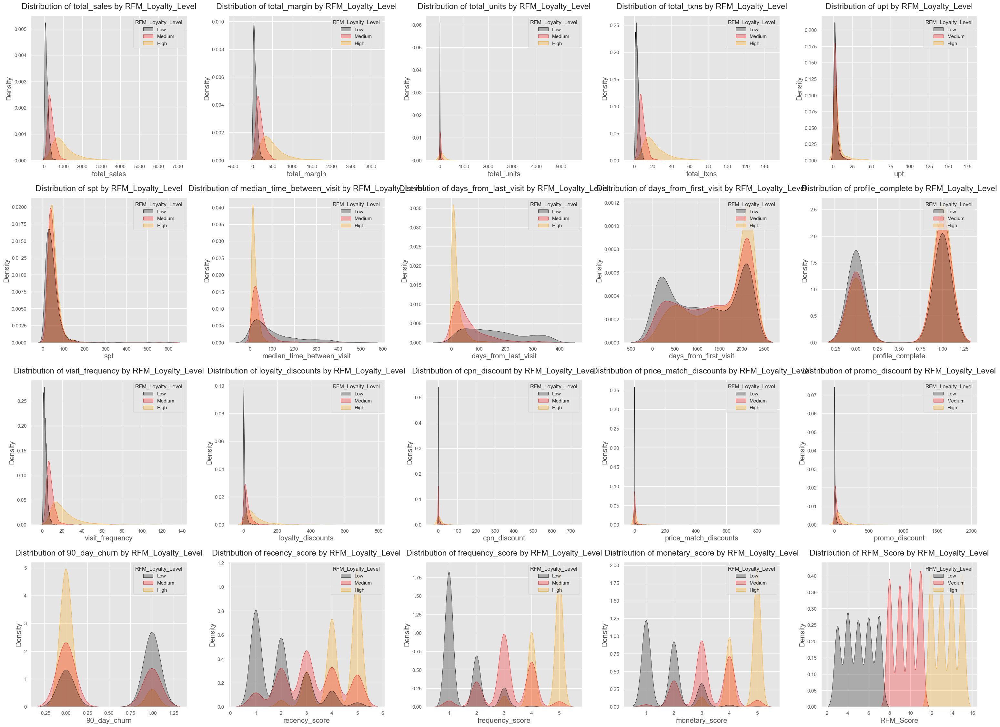

In [2018]:
# Create a grid for the plots with 4 rows and 4 columns
fig, axes = plt.subplots(4, 5, figsize=(32, 24))
fig.tight_layout(pad=8.0, h_pad=6.0, w_pad=6.0)
axes = axes.flatten()

# Plot the distribution for numerical features, split by 90_day_churn label
for i, col in enumerate(num_col_train_RFM):
    if pd.api.types.is_numeric_dtype(df_train[col]):
        sns.kdeplot(
            data=df_train, 
            x=col, 
            hue='RFM_Loyalty_Level', 
            fill=True, 
            common_norm=False, 
            palette=['black', 'red','orange'], 
            ax=axes[i]
        )
        axes[i].set_title(f'Distribution of {col} by RFM_Loyalty_Level', fontsize=18, pad=15)
        axes[i].set_ylabel('Density', fontsize=16)
        axes[i].set_xlabel(col, fontsize=16)
    else:
        # If the column is categorical, skip the plot or handle differently
        axes[i].text(0.5, 0.5, f"{col} is categorical", ha='center', va='center', fontsize=14)
        axes[i].set_axis_off()

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])
# fig.savefig('numeric_RFM_Loyalty_Level_distribution.png', dpi=400)
plt.show()

<p style="color:black; font-weight:bold; font-size:20px;">Insights</p>

**"90_day_churn":**

    The churn rate for the High group is significantly lower than that of other groups.
    This indicates that the loyalty of the High group is much higher than that of other groups.

**Total Sales, Total Margin, Total Transactions, RFM Score:**

    The High group outperforms other groups in terms of total sales, total margin, total transactions, and RFM score.This confirms that the High group is undoubtedly the company's core customer base.The company should focus on these core customers and develop corresponding marketing and retention strategies, such as personalized offers, loyalty programs, and premium services, to further enhance their value contribution.

**Days from Last Visit and Visit Frequency:**

    The values for the High group are more concentrated and the time intervals are significantly shorter compared to other groups.This indicates that the High group customers are more engaged, visit more frequently, and have shorter intervals between visits.The company should continue to maintain and enhance the engagement of these customers by regularly providing updates, exclusive offers, and personalized communication to ensure they continue to visit frequently.

**Profile Completion:**

    A higher proportion of customers in the High group have completed their profiles compared to other groups.This indicates that these users have higher engagement and are more invested in the brand.

    Better engagement not only helps make customer segmentation and prediction models more accurate but also increases customer loyalty through associated discounts and offers. The company should leverage this advantage by collecting more personalized data to offer tailored experiences. Additionally, encourage customers in other groups to complete their profiles by highlighting the benefits of having a complete profile.

**Loyalty Discounts:**

    The High group receives more loyalty discounts than other groups.
    This suggests that loyalty discounts may play a role in maintaining the high engagement and value of this group.Further analyze the relationship between loyalty discounts and sales, margin, and churn to evaluate the effectiveness and efficiency of the discounts. Use this analysis to optimize the loyalty discount strategy for better returns on investment.

In [2019]:
cat_col_train_RFM = [item for item in cat_col_train if item not in ['RFM_Loyalty_Level','KMeans_Loyalty_Level']]
cat_col_train_RFM

['species_group',
 'estimated_household_income_in_dollars',
 'population_density',
 'home_property_type',
 'estimated_home_market_value_in_dollars',
 'home_owner_or_renter']

In [2020]:
df_train['estimated_home_market_value_in_dollars'] = pd.Categorical(
    df_train['estimated_home_market_value_in_dollars'], 
    categories=[
        '1,000 - 24,999', '25,000 - 49,999', '50,000 - 74,999', '75,000 - 99,999', '100,000 - 124,999', 
        '125,000 - 149,999', '150,000 - 174,999', '175,000 - 199,999', '200,000 - 224,999', 
        '225,000 - 249,999', '250,000 - 274,999', '275,000 - 299,999', '300,000 - 349,999', 
        '350,000 - 399,999', '400,000 - 449,999', '450,000 - 499,999', '500,000 - 749,999', 
        '750,000 - 999,999', '1,000,000 Plus'
    ],
    ordered=True
)

df_train['estimated_household_income_in_dollars'] = pd.Categorical(
    df_train['estimated_household_income_in_dollars'], 
    categories=[
        'Less than 15000', '15000 to 19999', '20000 to 29999', '30000 to 39999', '40000 to 49999', 
        '50000 to 74999', '75000 to 99999', '100000 to 124999', 'Greater than 124999'
    ],
    ordered=True
)

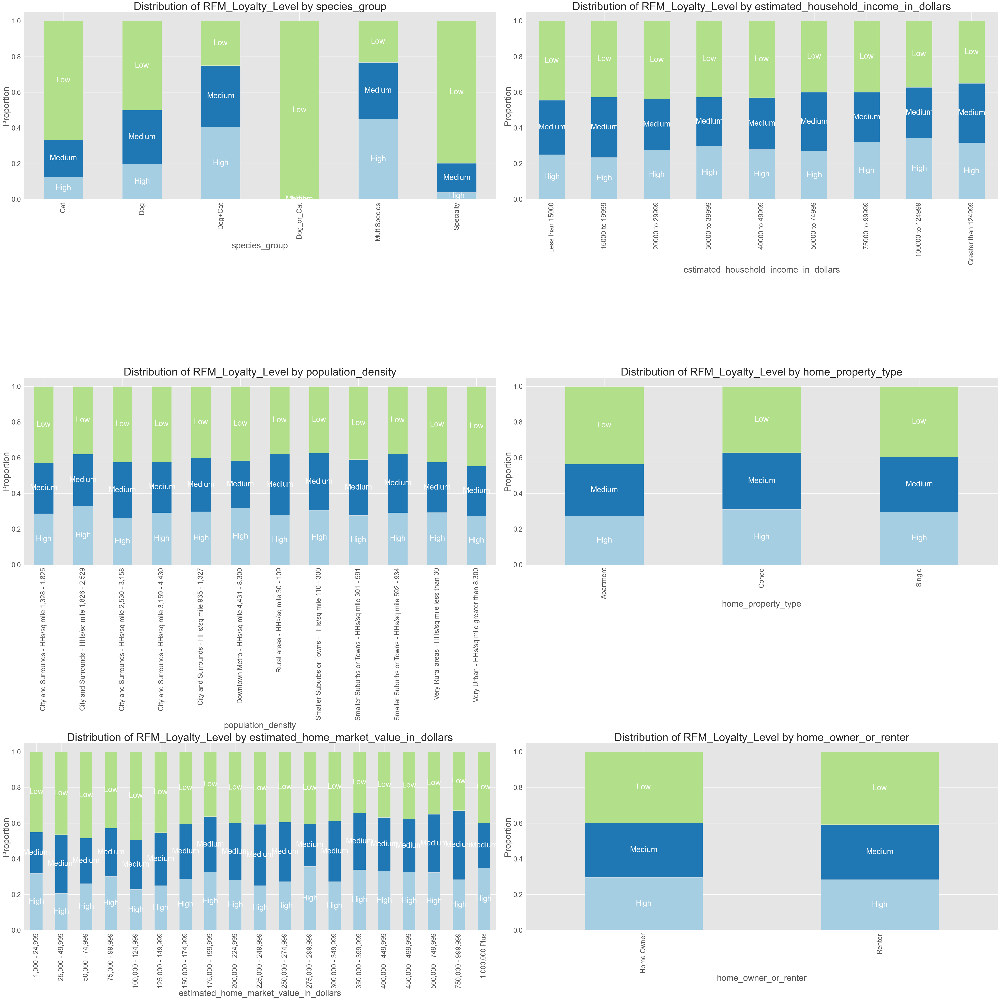

In [2021]:
# Set up the plot grid with 2 columns and 3 rows
fig, axes = plt.subplots(3, 2, figsize=(45, 45))
axes = axes.flatten()

# Get unique values of KMeans_Loyalty_Level and set a specific order
rfm_levels = ['High', 'Medium', 'Low']  # Ensure the order is High, Medium, Low
colors = sns.color_palette("Paired", n_colors=3)

# Iterate over each categorical column and create a stacked bar plot
for i, cat_col in enumerate(cat_col_train_RFM):
    # Calculate the normalized count for each category
    crosstab = pd.crosstab(df_train[cat_col], df_train['RFM_Loyalty_Level'], normalize='index')
    
    # Reorder the columns to ensure the order is High, Medium, Low
    crosstab = crosstab[rfm_levels]
    
    # Plot the stacked bar chart
    crosstab.plot(kind='bar', stacked=True, ax=axes[i], color=colors)
    
    # Annotate category labels inside the bars
    for j, container in enumerate(axes[i].containers):
        labels = [rfm_levels[j]] * len(container)
        axes[i].bar_label(container, labels=labels, label_type='center', fontsize=25, color='white')
    
    # Set the title and labels
    axes[i].set_title(f'Distribution of RFM_Loyalty_Level by {cat_col}', fontsize=35)
    axes[i].set_xlabel(cat_col, fontsize=28)
    axes[i].set_ylabel('Proportion', fontsize=28)
    axes[i].tick_params(axis='x', labelsize=22)
    axes[i].tick_params(axis='y', labelsize=22)
    axes[i].get_legend().remove()  # Remove the legend

# Remove the last empty subplot if there are any
if len(cat_col_train_RFM) < len(axes):
    fig.delaxes(axes[-1])

# Adjust the layout to prevent overlap
plt.tight_layout()
plt.show()

<p style="color:black; font-weight:bold; font-size:20px;">Insights</p>

    From the chart, we can observe the distribution of RFM Loyalty Level across different categorical features such as geographic location, population density, pet species, household income, and home market value. Below is an analysis and interpretation for each feature:

**Pet Species (Species Group):**

    The chart shows that customers with pet compositions of MultiSpecies and Dog+Cat have a higher proportion in the High loyalty group compared to other groups, indicating stronger purchasing power. This phenomenon may be due to the fact that households with multiple pets, such as MultiSpecies or those with both dogs and cats, typically need to purchase a wider variety and greater quantity of pet supplies. This increased demand likely leads to higher purchase frequency and amounts than households with only one type of pet, making these customers more likely to be classified as high-loyalty customers. Additionally, multi-pet households may rely more heavily on certain brands for products and services, particularly those that offer a comprehensive and high-quality range of pet supplies. This reliance may drive them to make repeat purchases more frequently and to prefer shopping at the same store or brand, thus enhancing their loyalty. I will further analyze their relationship with upt (Units per transaction) and spt (Sales per transaction) during the EDA phase to uncover more patterns.

**Population Density:**

    The distribution of the High group remains relatively stable across different population density ranges, but in some medium population density areas, the proportion of the Medium and Low groups increases. Since this feature contains both regional and population density information, further analysis will be conducted in the next steps of the EDA by decomposing these elements for a more detailed examination.

**Home Market Value (Estimated Home Market Value in Dollars) and Household Income (Estimated Household Income in Dollars):**

    As household income increases, the proportion of the High group also increases. In contrast, the Low and Medium groups have a higher proportion in the lower household income segments. Customers with higher household income are more likely to belong to the High group, indicating a correlation between income levels and customer loyalty. These customers may have more disposable income for purchasing products or services.

    Among customers with higher home market value, the High group has a significantly higher proportion, while the Low group is more prevalent among lower home market value segments. Customers with higher home market value tend to exhibit a higher RFM score level, likely due to their greater economic capacity and spending habits.

    This suggests that economic conditions (such as household income, home market value, and home ownership) are positively correlated with customer loyalty. Customers with better economic conditions are more likely to belong to the High group.

**Home Property Type and Home Ownership (Home Owner or Renter):**

    The distribution across groups is relatively even, indicating that further analysis is needed by combining other features and methods.

### visualize the distribution of all features in df_train according to the KMeans_Loyalty_Level classification

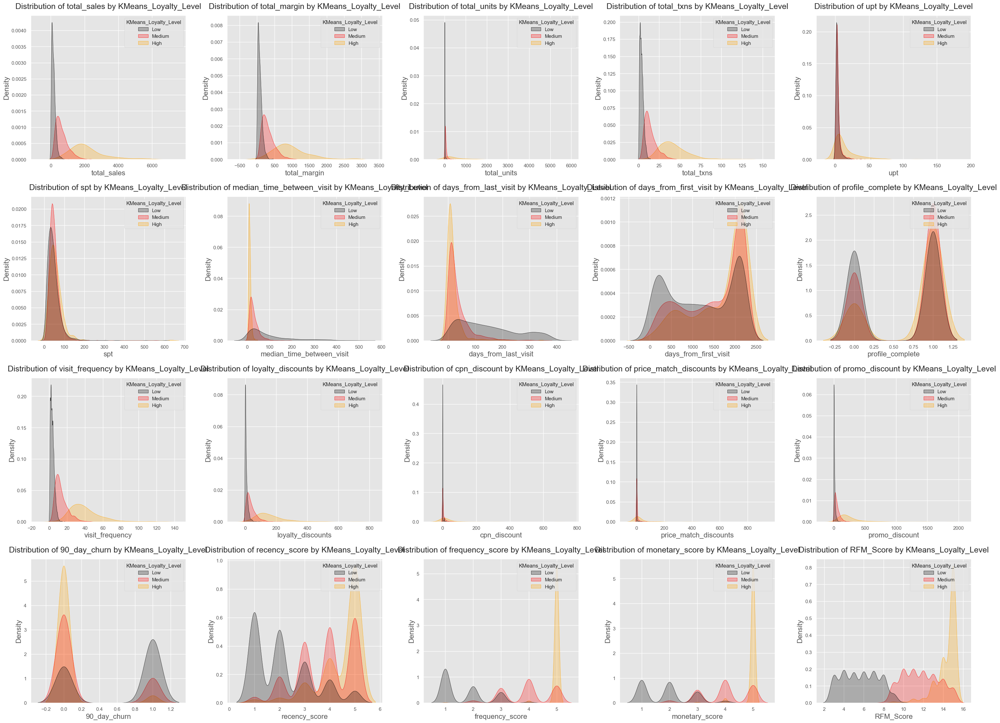

In [2022]:
# Create a grid for the plots with 4 rows and 4 columns
fig, axes = plt.subplots(4, 5, figsize=(32, 24))
fig.tight_layout(pad=8.0, h_pad=6.0, w_pad=6.0)
axes = axes.flatten()

# Plot the distribution for numerical features, split by 90_day_churn label
for i, col in enumerate(num_col_train_RFM):
    if pd.api.types.is_numeric_dtype(df_train[col]):
        sns.kdeplot(
            data=df_train, 
            x=col, 
            hue='KMeans_Loyalty_Level', 
            fill=True, 
            common_norm=False, 
            palette=['black', 'red','orange'], 
            ax=axes[i]
        )
        axes[i].set_title(f'Distribution of {col} by KMeans_Loyalty_Level', fontsize=18, pad=15)
        axes[i].set_ylabel('Density', fontsize=16)
        axes[i].set_xlabel(col, fontsize=16)
    else:
        # If the column is categorical, skip the plot or handle differently
        axes[i].text(0.5, 0.5, f"{col} is categorical", ha='center', va='center', fontsize=14)
        axes[i].set_axis_off()

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])
# fig.savefig('numeric_KMeans_Loyalty_Level_distribution.png', dpi=400)
plt.show()

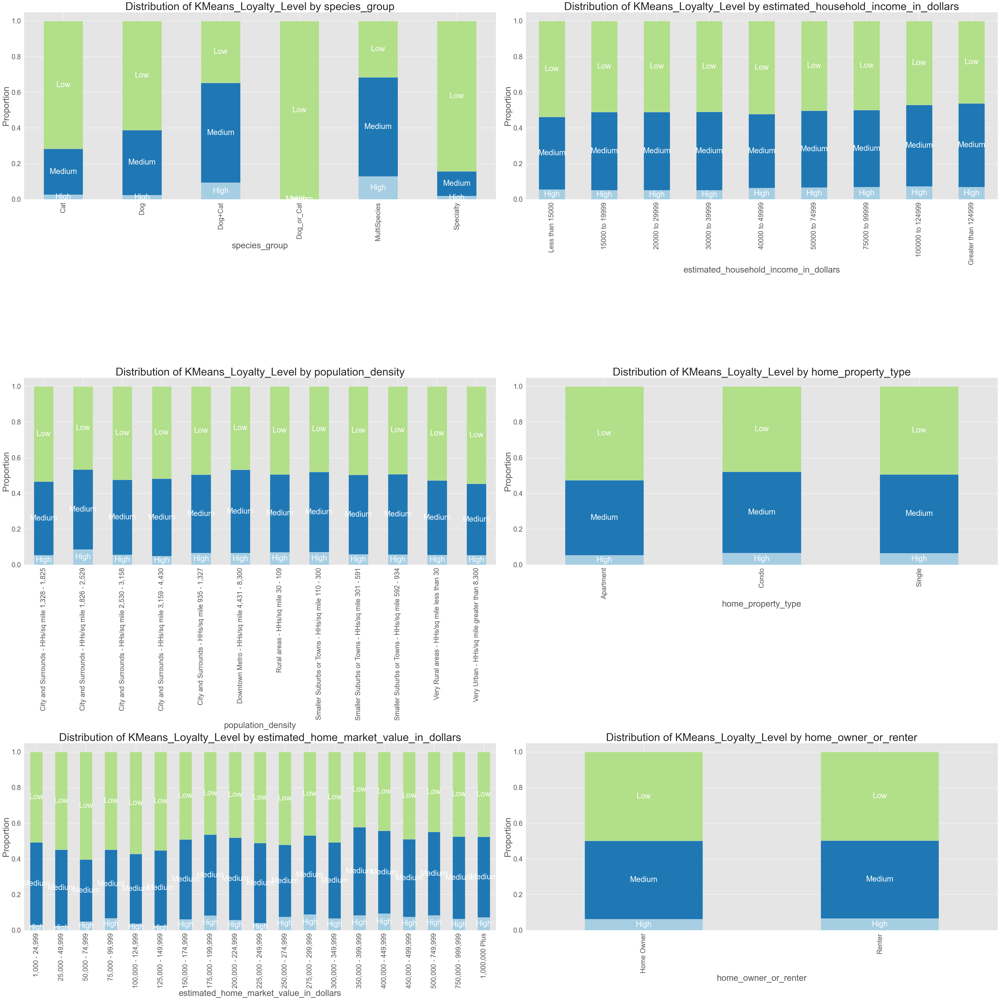

In [2023]:
# Set up the plot grid with 2 columns and 3 rows
fig, axes = plt.subplots(3, 2, figsize=(45, 45))
axes = axes.flatten()

# Get unique values of KMeans_Loyalty_Level and set a specific order
rfm_levels = ['High', 'Medium', 'Low']  # Ensure the order is High, Medium, Low
colors = sns.color_palette("Paired", n_colors=3)

# Iterate over each categorical column and create a stacked bar plot
for i, cat_col in enumerate(cat_col_train_RFM):
    # Calculate the normalized count for each category
    crosstab = pd.crosstab(df_train[cat_col], df_train['KMeans_Loyalty_Level'], normalize='index')
    
    # Reorder the columns to ensure the order is High, Medium, Low
    crosstab = crosstab[rfm_levels]
    
    # Plot the stacked bar chart
    crosstab.plot(kind='bar', stacked=True, ax=axes[i], color=colors)
    
    # Annotate category labels inside the bars
    for j, container in enumerate(axes[i].containers):
        labels = [rfm_levels[j]] * len(container)
        axes[i].bar_label(container, labels=labels, label_type='center', fontsize=25, color='white')
    
    # Set the title and labels
    axes[i].set_title(f'Distribution of KMeans_Loyalty_Level by {cat_col}', fontsize=35)
    axes[i].set_xlabel(cat_col, fontsize=28)
    axes[i].set_ylabel('Proportion', fontsize=28)
    axes[i].tick_params(axis='x', labelsize=22)
    axes[i].tick_params(axis='y', labelsize=22)
    axes[i].get_legend().remove()  # Remove the legend

# Remove the last empty subplot if there are any
if len(cat_col_train_RFM) < len(axes):
    fig.delaxes(axes[-1])

# Adjust the layout to prevent overlap
plt.tight_layout()
# fig.savefig('Categorical_KMeans_Loyalty_Level_distribution.png', dpi=400)
plt.show()

<p style="color:black; font-weight:bold; font-size:20px;">Insights</p>

    The distribution of KMeans levels across various features is generally similar to that of RFM levels. Regions and demographics with high income and spending power tend to be classified into the High group in both KMeans and RFM levels. The relationship between household pet composition and level classification also mirrors the RFM distribution. However, the High group in KMeans levels is smaller and more concentrated, which may suggest that this group represents a more loyal and higher-value customer segment. Further analysis, including churn rate, sales, and profit data, is needed to confirm this hypothesis.

**Let's look at the statistics of KMeans_Loyalty_Level and RFM_Loyalty_Level on total_sales and total_margin.**

In [2024]:
# Calculate statistics for KMeans_Loyalty_Level categories
kmeans_stats = df_train.groupby('KMeans_Loyalty_Level')[['total_sales', 'total_margin']].agg(['mean', 'median', 'std', 'min', 'max'])

# Calculate statistics for RFM_Loyalty_Level categories
rfm_stats = df_train.groupby('RFM_Loyalty_Level')[['total_sales', 'total_margin']].agg(['mean', 'median', 'std', 'min', 'max'])

# Add a new column 'Loyalty_name' and fill it with the appropriate values
kmeans_stats['Loyalty_name'] = 'KMeans_Loyalty_Level'
rfm_stats['Loyalty_name'] = 'RFM_Loyalty_Level'

# Reset index to have Loyalty_Level as a column instead of index
kmeans_stats = kmeans_stats.reset_index().rename(columns={'KMeans_Loyalty_Level': 'Loyalty_Level'})
rfm_stats = rfm_stats.reset_index().rename(columns={'RFM_Loyalty_Level': 'Loyalty_Level'})

# Concatenate both dataframes
combined_stats = pd.concat([kmeans_stats, rfm_stats], ignore_index=True)

# Display the resulting dataframe
combined_stats

0 Loyalty_Level  total_sales                                           
                        mean    median          std     min      max   
0          High  2152.734901  1917.925  1084.753384  222.50  6582.75  \
1           Low   153.972222   127.100   119.274700    0.49  1208.74   
2        Medium   646.753379   558.910   367.132790   33.05  2398.29   
3          High  1122.263466   881.510   803.161626  218.47  6582.75   
4           Low   126.918400   104.000   100.226183    0.49  1208.74   
5        Medium   379.987686   332.170   222.156033    8.80  2368.68   

0 total_margin                                                   Loyalty_name  
          mean   median         std      min        max                        
0   960.781794  862.997  518.230743 -181.686  2915.2480  KMeans_Loyalty_Level  
1    80.384180   66.104   66.017612 -266.346   787.9800  KMeans_Loyalty_Level  
2   315.721363  273.305  185.348207 -163.422  1339.5771  KMeans_Loyalty_Level  
3   525.206201  424.372  370.511544 -181.686  2915.2480     RFM_Loyalty_Level  
4    66.966513   53.615   56.428315  -54.563   787.9800     RFM_Loyalty_Level  
5   190.538722  166.493  115.209690 -266.346  1155.2980     RFM_Loyalty_Level

**Then we continue to observe the distribution of churn rate in KMeans_Loyalty_Level and RFM_Loyalty groups.**

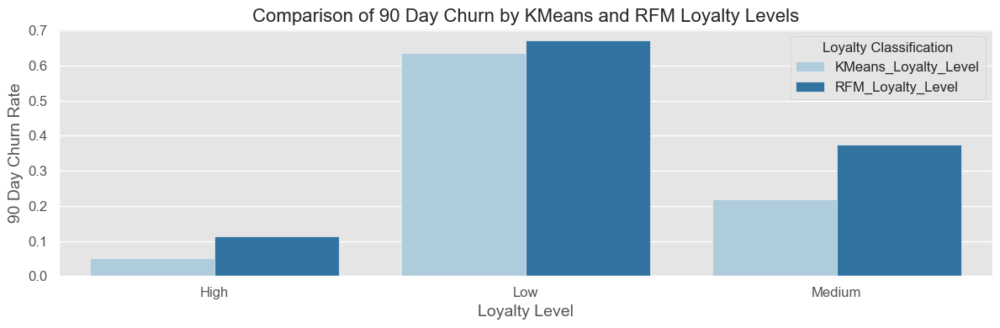

In [2025]:
kmeans_churn = df_train.groupby('KMeans_Loyalty_Level')['90_day_churn'].mean().reset_index()
kmeans_churn['Loyalty_name'] = 'KMeans_Loyalty_Level'

rfm_churn = df_train.groupby('RFM_Loyalty_Level')['90_day_churn'].mean().reset_index()
rfm_churn['Loyalty_name'] = 'RFM_Loyalty_Level'

kmeans_churn = kmeans_churn.rename(columns={'KMeans_Loyalty_Level': 'Loyalty_Level'})
rfm_churn = rfm_churn.rename(columns={'RFM_Loyalty_Level': 'Loyalty_Level'})

combined_churn = pd.concat([kmeans_churn, rfm_churn], ignore_index=True)

plt.figure(figsize=(12, 4))
sns.barplot(x='Loyalty_Level', y='90_day_churn', hue='Loyalty_name', data=combined_churn, palette='Paired')

plt.title('Comparison of 90 Day Churn by KMeans and RFM Loyalty Levels', fontsize=16)
plt.ylabel('90 Day Churn Rate', fontsize=14)
plt.xlabel('Loyalty Level', fontsize=14)
plt.legend(title='Loyalty Classification', fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()
plt.show()

<p style="color:black; font-weight:bold; font-size:20px;">Insights</p>

    In above statistics and charts, we observe that the KMeans classification outperforms the RFM classification in terms of sales, profit, and churn rate across all categories. Particularly for the High group, the data shows better performance, although the group size is smaller. In scenarios where resources are limited, the company may consider focusing more resources on this group, based on a comprehensive analysis of ROI and CLV.

    On the other hand, this difference suggests that KMeans may be more effective in identifying and categorizing customer groups.


## Summary of Customer Segmentation Analysis

    The analysis reveals that segmentation, particularly through KMeans, provides deeper insights into customer behavior than RFM, identifying high-value customers with lower churn rates, higher sales, and greater engagement.  Multi-pet households and customers with higher economic status are more likely to be in the High loyalty group, highlighting the need for targeted marketing strategies.  Prioritizing these high-value segments, especially in resource-constrained environments, can optimize ROI and customer lifetime value.

<p style="color:black; font-weight:bold; font-size:20px;">Now that we have completed the hierarchical and cluster analysis of customers and labeled our data with clusters, we can further explore the new data characteristics and carry out the Churn classification modeling in the next step. Specifically, it includes:</p>

    1. Analyze Characteristics of Each Cluster
    Describe the Characteristics of Each Cluster: Conduct an in-depth analysis of the clusters to understand the purchasing behavior, pet types, and consumption patterns of different customer groups. For example, one cluster of customers might primarily purchase premium pet food, while another cluster might be more focused on price and discounts.
    
    2. Interpret Business Implications
    Identify High-Value Customer Segments: For example, if a particular cluster of customers frequently purchased premium pet products and had high spending in the past year, these customers can be identified as high-value customers. we can then develop VIP or loyalty programs to maintain and increase their spending.
    Refine Marketing Strategies: Personalize marketing strategies for different customer clusters. For instance, for price-sensitive customers, regularly send them discount and promotional information; for customers focused on pet health, recommend high-quality pet food and health products.
    
    3. Build Predictive Models
    Customer Churn Prediction: Based on the clustering results, build a customer churn prediction model to identify which customer groups may be at risk of churning, and take proactive measures to retain these customers.
    Optimize Recommendation System: Use clustering labels as one of the input features to optimize PetStore's recommendation system, providing more personalized product recommendations and improving conversion rates.
    
    4. Develop Segmented Market Strategies
    Customized Promotional Strategies: Customized Promotions: Create targeted promotions for different clusters (e.g., loyalty programs, first-time buyer discounts).
    Regional Strategies: Adjust market strategies based on regional cluster differences.

<a id="4"></a>
<h1 style="background-color:#16DCC9;font-family:Calibri;font-size:200%;text-align:center">Exploratory Data Analysis For Churn Prediction</h1>

In [2026]:
df_train.info(), print('='*50), df_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5922 entries, 6053 to 5219
Data columns (total 32 columns):
 #   Column                                  Non-Null Count  Dtype   
---  ------                                  --------------  -----   
 0   total_sales                             5922 non-null   float64 
 1   total_margin                            5922 non-null   float64 
 2   total_units                             5922 non-null   int64   
 3   total_txns                              5922 non-null   int64   
 4   upt                                     5922 non-null   float64 
 5   spt                                     5922 non-null   float64 
 6   median_time_between_visit               5922 non-null   int64   
 7   days_from_last_visit                    5922 non-null   int64   
 8   days_from_first_visit                   5922 non-null   int64   
 9   std_time_between_visit                  5922 non-null   float64 
 10  has_loyalty                             5922 non-n

(None, None, None)

In [2027]:
# Convert categorical types to object types
df_train['estimated_home_market_value_in_dollars'] = df_train['estimated_home_market_value_in_dollars'].astype('object')
df_train['estimated_household_income_in_dollars'] = df_train['estimated_household_income_in_dollars'].astype('object')
df_train['RFM_Loyalty_Level'] = df_train['RFM_Loyalty_Level'].astype('object')
df_train['KMeans_Loyalty_Level'] = df_train['KMeans_Loyalty_Level'].astype('object')

In [2028]:
cat_col_train = [col for col in df_train.columns if df_train[col].dtype == 'object']
num_col_train = [col for col in df_train.columns if col not in cat_col_train]
print('cat_col_train : {} \n\
num_col_train : {}'.format(len(cat_col_train), len(num_col_train)))

cat_col_train : 8 
num_col_train : 24


## Functions to plot counts and normalized counts

In [2029]:
def plot_counts(df, category_col, target_col, length, height, fontsize, show_percentages=True):
    fig = plt.figure(figsize=(length, height))
    ax = sns.countplot(x=category_col, hue=target_col, data=df, palette='Paired')

    if show_percentages:
        for p in ax.patches:
            height = p.get_height()
            ax.annotate(f'{height / len(df) * 100:.1f}%',
                        xy=(p.get_x() + p.get_width() / 2., height),
                        ha='center', va='center', xytext=(0, 5),
                        textcoords='offset points', fontsize=fontsize)
    plt.xticks(rotation=90)
    plt.show()

In [2030]:
def plot_normalized_counts(df, category_col, target_col, length, height, fontsize, show_percentages=True):
    
   # Calculate the normalized count for each category
    counts = df.groupby([category_col, target_col]).size().unstack().fillna(0)

    # Calculate percentages
    counts_percent = counts.div(counts.sum(axis=1), axis=0) * 100
    average_churn_rate = 41.6
    # Reverse the order of stacking
    counts_percent = counts_percent[[1, 0]]

    # Plot the bar chart
    fig, ax = plt.subplots(figsize=(length, height))
    counts_percent.plot(kind='bar', stacked=True, ax=ax, color=colors)

    if show_percentages:
        for col in counts_percent.columns:
            for index, value in enumerate(counts_percent[col]):
                if value != 0:  # Skip displaying percentage for 0 values
                    ax.text(
                        index,
                        counts_percent.iloc[:, :counts_percent.columns.get_loc(col)].sum(axis=1)[index] + value / 2,
                        f"{value:.2f}%",
                        ha='center',
                        va='center',
                        fontsize=fontsize,
                        color='white'
                    )

    # Add the average churn rate line if provided
    if average_churn_rate is not None:
        ax.axhline(y=average_churn_rate, color='red', linestyle='--', label=f'Average Churn')
        ax.legend(title=target_col, bbox_to_anchor=(1, 1))

    plt.xticks(rotation=90)
    ax.set_xlabel(category_col)
    ax.set_ylabel('Percentage of normalized counts')
    plt.show()

In [2031]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_combined_counts_in_one(df, category_col, target_col, length, height, fontsize, show_percentages=True):
    """
    Plots two types of count distributions on the same figure: 
    - A standard count plot with percentage annotations.
    - A normalized stacked bar chart with percentage annotations.
    
    Parameters:
    df (DataFrame): The input DataFrame.
    category_col (str): The column name for the categories (x-axis).
    target_col (str): The column name for the target variable (used for hue and stacking).
    length (int): The width of the figure.
    height (int): The height of the figure.
    fontsize (int): Font size for percentage annotations.
    show_percentages (bool): Whether to show percentages on the bars.
    
    Returns:
    None
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(length, height))

    # First plot: Standard count plot with percentages
    sns.countplot(x=category_col, hue=target_col, data=df, palette='Paired', ax=ax1)
    
    if show_percentages:
        for p in ax1.patches:
            height = p.get_height()
            ax1.annotate(f'{height / len(df) * 100:.1f}%',
                         xy=(p.get_x() + p.get_width() / 2., height),
                         ha='center', va='center', xytext=(0, 5),
                         textcoords='offset points', fontsize=fontsize)
    ax1.set_title('Count Plot with Percentages', fontsize=16)
    ax1.set_xlabel(category_col, fontsize=14)
    ax1.set_ylabel('Count', fontsize=14)
    ax1.tick_params(axis='x', rotation=90)
    
    # Second plot: Normalized stacked bar chart with percentages
    counts = df.groupby([category_col, target_col]).size().unstack().fillna(0)
    counts_percent = counts.div(counts.sum(axis=1), axis=0) * 100
    counts_percent = counts_percent[[1, 0]]  # Reversing the stacking order

    counts_percent.plot(kind='bar', stacked=True, ax=ax2, color=['steelblue', 'skyblue'])

    if show_percentages:
        for col in counts_percent.columns:
            for index, value in enumerate(counts_percent[col]):
                if value != 0:  # Skip displaying percentage for 0 values
                    ax2.text(
                        index,
                        counts_percent.iloc[:, :counts_percent.columns.get_loc(col)].sum(axis=1)[index] + value / 2,
                        f"{value:.2f}%",
                        ha='center',
                        va='center',
                        fontsize=fontsize,
                        color='white'
                    )
    
    average_churn_rate = 41.6  # Example average churn rate
    ax2.axhline(y=average_churn_rate, color='red', linestyle='--', label=f'Average Churn')
    ax2.legend(title=target_col, bbox_to_anchor=(1, 1), labels=['Average Churn', '1','0'])

    ax2.set_title('Normalized Stacked Bar Chart', fontsize=16)
    ax2.set_xlabel(category_col, fontsize=18)
    ax2.set_ylabel('Percentage of Normalized Counts', fontsize=18)
    ax2.tick_params(axis='x', rotation=90)
    
    plt.tight_layout()
    plt.show()

In [2032]:
def plot_grouped_bar(df, group_col, metrics, title, xlabel, ylabel, figsize=(14, 6), colors=None, width=0.8):
    """
    Plots a grouped bar chart for the mean values of specified metrics by a grouping column.
    
    Parameters:
    df (DataFrame): The input DataFrame.
    group_col (str): The column name to group by.
    metrics (list): A list of metric columns to calculate the mean and plot.
    title (str): The title of the plot.
    xlabel (str): The label for the x-axis.
    ylabel (str): The label for the y-axis.
    figsize (tuple): The size of the figure (width, height).
    colors (list): A list of colors for the bars.
    width (float): The width of the bars.
    
    Returns:
    None
    """
    grouped_df = df.groupby(group_col)[metrics].mean()
    
    fig, ax = plt.subplots(figsize=figsize)
    
    grouped_df.plot(kind='bar', ax=ax, color=colors, width=width)
    
    ax.set_title(title, fontsize=16)
    ax.set_xlabel(xlabel, fontsize=18)
    ax.set_ylabel(ylabel, fontsize=18)
    
    ax.legend(title='Metrics', bbox_to_anchor=(1, 1), loc='upper left')
    
    plt.tight_layout()
    
    plt.show()


In [2033]:
def plot_sales_margin_distribution(df, group_col, metrics, agg_func='sum', title='', xlabel='', ylabel='', figsize=(14, 6), colors=None, width=0.4):
    """
    Plots a grouped bar chart for the sum or mean of total sales and total margin by a specified grouping column.

    Parameters:
    df (DataFrame): The input DataFrame.
    group_col (str): The column name to group by.
    metrics (list): A list of metric columns to calculate the sum or mean and plot.
    agg_func (str): Aggregation function to apply, either 'sum' or 'mean'.
    title (str): The title of the plot.
    xlabel (str): The label for the x-axis.
    ylabel (str): The label for the y-axis.
    figsize (tuple): The size of the figure (width, height).
    colors (list): A list of colors for the bars.
    width (float): The width of the bars.
    
    Returns:
    None
    """
    if agg_func == 'sum':
        grouped_df = df.groupby(group_col)[metrics].sum()
    elif agg_func == 'mean':
        grouped_df = df.groupby(group_col)[metrics].mean()
    else:
        raise ValueError("agg_func must be either 'sum' or 'mean'")

    fig, ax = plt.subplots(figsize=figsize)
    
    grouped_df[metrics[0]].plot(kind='bar', ax=ax, color=colors[0], width=width, position=1, label=metrics[0])
    grouped_df[metrics[1]].plot(kind='bar', ax=ax, color=colors[1], width=width, position=0, label=metrics[1])

    ax.set_title(title, fontsize=16)
    ax.set_xlabel(xlabel, fontsize=18)
    ax.set_ylabel(ylabel, fontsize=18)
    ax.legend()

    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

def plot_sales_margin_distribution_in_one(df, group_col, metrics, agg_func1='sum', agg_func2='mean', title1='', title2='', xlabel='', ylabel='', figsize=(18, 6), colors=None, width=0.4):
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)

    if agg_func1 == 'sum':
        grouped_df1 = df.groupby(group_col)[metrics].sum()
    elif agg_func1 == 'mean':
        grouped_df1 = df.groupby(group_col)[metrics].mean()
    else:
        raise ValueError("agg_func1 must be either 'sum' or 'mean'")

    grouped_df1[metrics[0]].plot(kind='bar', ax=ax1, color=colors[0], width=width, position=1, label=metrics[0])
    grouped_df1[metrics[1]].plot(kind='bar', ax=ax1, color=colors[1], width=width, position=0, label=metrics[1])

    ax1.set_title(title1, fontsize=16)
    ax1.set_xlabel(xlabel, fontsize=14)
    ax1.set_ylabel(ylabel, fontsize=14)
    ax1.legend()

    if agg_func2 == 'sum':
        grouped_df2 = df.groupby(group_col)[metrics].sum()
    elif agg_func2 == 'mean':
        grouped_df2 = df.groupby(group_col)[metrics].mean()
    else:
        raise ValueError("agg_func2 must be either 'sum' or 'mean'")

    grouped_df2[metrics[0]].plot(kind='bar', ax=ax2, color=colors[0], width=width, position=1, label=metrics[0])
    grouped_df2[metrics[1]].plot(kind='bar', ax=ax2, color=colors[1], width=width, position=0, label=metrics[1])

    ax2.set_title(title2, fontsize=16)
    ax2.set_xlabel(xlabel, fontsize=14)
    ax2.set_ylabel(ylabel, fontsize=14)
    ax2.legend()

    plt.setp(ax1.xaxis.get_majorticklabels(), rotation=45)
    plt.setp(ax2.xaxis.get_majorticklabels(), rotation=45)

    plt.tight_layout()

    plt.show()

<h2 style="color:blue">Univariate Analysis - Categorical Features</h2>

- Data distribution: normal or skewed.
- Outliers elimination.
- Check distribution of target label in each group in a category column to infer the importance of the variable for target prediction

In [2034]:
cat_col_train = [col for col in df_train.columns if df_train[col].dtype == 'object']
num_col_train = [col for col in df_train.columns if col not in cat_col_train]
print('cat_col_train : {} \n\
num_col_train : {}'.format(len(cat_col_train), len(num_col_train)))

cat_col_train : 8 
num_col_train : 24


In [2035]:
cat_col_train

['species_group',
 'estimated_household_income_in_dollars',
 'population_density',
 'home_property_type',
 'estimated_home_market_value_in_dollars',
 'home_owner_or_renter',
 'RFM_Loyalty_Level',
 'KMeans_Loyalty_Level']

In [2036]:
# Convert the ordinal variables to ordered categorical types
df_train['estimated_home_market_value_in_dollars'] = pd.Categorical(
    df_train['estimated_home_market_value_in_dollars'], 
    categories=[
        '1,000 - 24,999', '25,000 - 49,999', '50,000 - 74,999', '75,000 - 99,999', '100,000 - 124,999', 
        '125,000 - 149,999', '150,000 - 174,999', '175,000 - 199,999', '200,000 - 224,999', 
        '225,000 - 249,999', '250,000 - 274,999', '275,000 - 299,999', '300,000 - 349,999', 
        '350,000 - 399,999', '400,000 - 449,999', '450,000 - 499,999', '500,000 - 749,999', 
        '750,000 - 999,999', '1,000,000 Plus'
    ],
    ordered=True
)

df_train['estimated_household_income_in_dollars'] = pd.Categorical(
    df_train['estimated_household_income_in_dollars'], 
    categories=[
        'Less than 15000', '15000 to 19999', '20000 to 29999', '30000 to 39999', '40000 to 49999', 
        '50000 to 74999', '75000 to 99999', '100000 to 124999', 'Greater than 124999'
    ],
    ordered=True
)

df_train['RFM_Loyalty_Level'] = pd.Categorical(
    df_train['RFM_Loyalty_Level'], 
    categories=['Low', 'Medium', 'High'], 
    ordered=True
)

df_train['KMeans_Loyalty_Level'] = pd.Categorical(
    df_train['KMeans_Loyalty_Level'], 
    categories=['Low', 'Medium', 'High'], 
    ordered=True
)



<p style="color:black; font-weight:bold; font-size:20px;">We have 8 categorical features. only Column 'estimated_home_market_value_in_dollars' have missing values (4.99%). I will check these columns individually.</p>

<p style="color:black; font-weight:bold; font-size:20px;">For the feature 'estimated_home_market_value_in_dollars,' each group has a corresponding 'KMeans_Loyalty_Level.' I plan to fill in the missing values using the mode of each group. Specifically, I'll divide 'estimated_home_market_value_in_dollars' into three categories based on 'KMeans_Loyalty_Level,' and then fill the missing values in each category with the mode of that group.</p>

In [2037]:
# Function to fill missing values with mode based on 'KMeans_Loyalty_Level'
def fill_missing_with_mode(df, group_col, target_col):
    return df_train.groupby(group_col)[target_col].transform(lambda x: x.fillna(x.mode()[0] if not x.mode().empty else x))

# Applying the function to DataFrame
df_train['estimated_home_market_value_in_dollars'] = fill_missing_with_mode(df_train, 'KMeans_Loyalty_Level', 'estimated_home_market_value_in_dollars')


<AxesSubplot: >

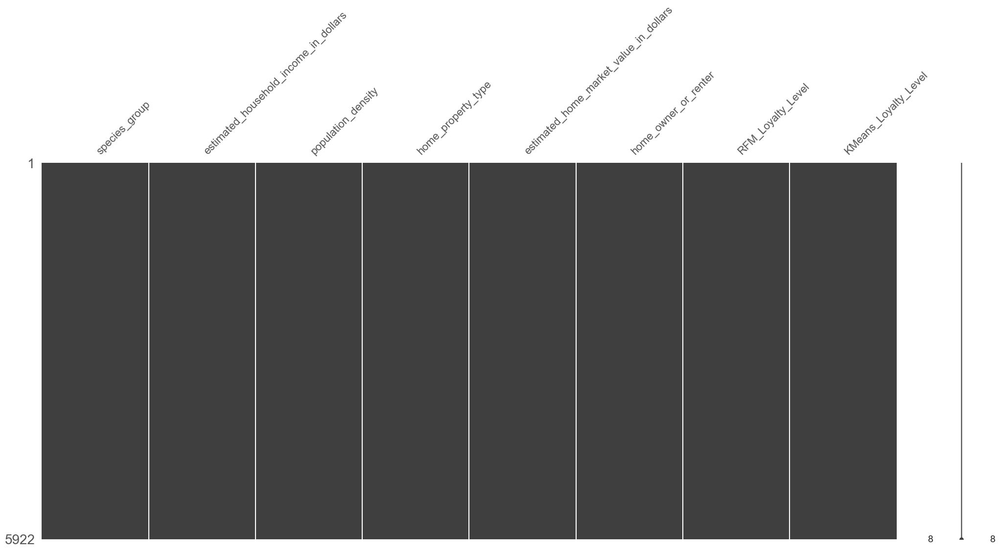

In [2038]:
mno.matrix(df_train[cat_col_train])

### Column 'species_group': contains Type of species customer has purchased product for.No missing value.

In [2039]:
df_train.species_group.value_counts(dropna = False)

species_group
Dog             2930
MultiSpecies    1539
Dog+Cat         1062
Cat              230
Specialty        159
Dog_or_Cat         2
Name: count, dtype: int64

In [2040]:
df_train.columns

Index(['total_sales', 'total_margin', 'total_units', 'total_txns', 'upt',
       'spt', 'median_time_between_visit', 'days_from_last_visit',
       'days_from_first_visit', 'std_time_between_visit', 'has_loyalty',
       'profile_complete', 'species_group', 'visit_frequency',
       'estimated_household_income_in_dollars', 'population_density',
       'home_property_type', 'estimated_home_market_value_in_dollars',
       'home_owner_or_renter', 'loyalty_discounts', 'cpn_discount',
       'price_match_discounts', 'promo_discount', 'employee_discount',
       '90_day_churn', '90_day_sales', 'recency_score', 'frequency_score',
       'monetary_score', 'RFM_Score', 'RFM_Loyalty_Level',
       'KMeans_Loyalty_Level'],
      dtype='object', name=0)

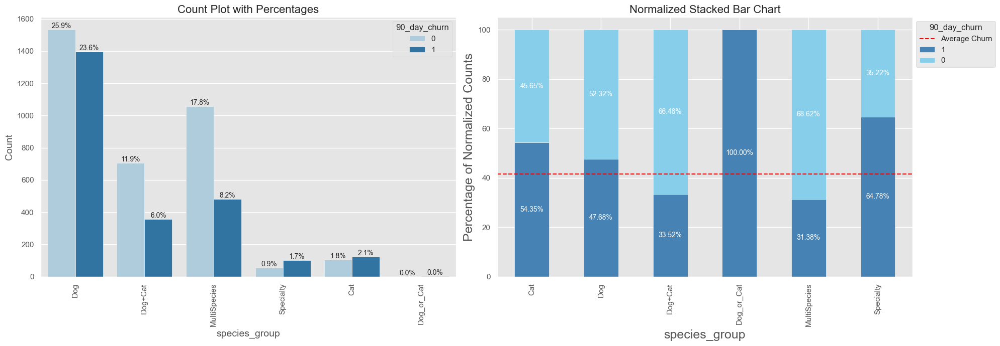

In [2041]:
plot_combined_counts_in_one(df_train, 'species_group', '90_day_churn', 20, 7, 10, show_percentages=True)

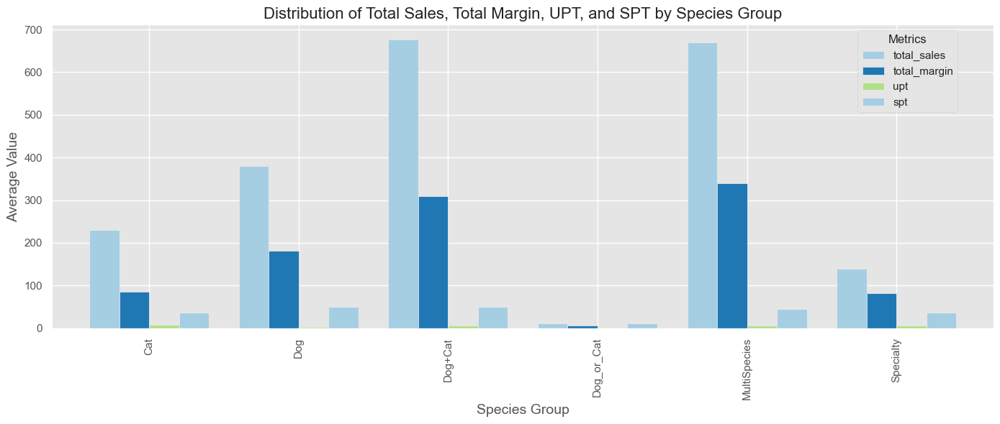

In [2042]:
import pandas as pd
import matplotlib.pyplot as plt

grouped_df = df_train.groupby('species_group')[['total_sales', 'total_margin', 'upt', 'spt']].mean()
fig, ax = plt.subplots(figsize=(14, 6))
grouped_df.plot(kind='bar', ax=ax, color = colors,width=0.8)

ax.set_title('Distribution of Total Sales, Total Margin, UPT, and SPT by Species Group', fontsize=16)
ax.set_xlabel('Species Group', fontsize=14)
ax.set_ylabel('Average Value', fontsize=14)
ax.legend(title='Metrics', bbox_to_anchor=(0.85, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [2043]:
# Calculate statistics for KMeans_Loyalty_Level categories
species_stats = df_train.groupby('species_group')[['upt', 'spt']].agg(['mean', 'median', 'std', 'min', 'max'])


# Reset index to have Loyalty_Level as a column instead of index
species_stats = species_stats.reset_index().rename(columns={'KMeans_Loyalty_Level': 'Loyalty_Level'})

# Display the resulting dataframe
species_stats

0 species_group       upt                                          spt   
                     mean  median        std  min       max       mean   
0           Cat  7.543478  3.0000  12.333419  1.0  100.0526  36.940373  \
1           Dog  3.144719  2.4286   3.304132  1.0  102.5000  50.935513   
2       Dog+Cat  5.953938  3.5352   9.005548  1.0  131.7857  49.329799   
3    Dog_or_Cat  1.000000  1.0000   0.000000  1.0    1.0000  10.740000   
4  MultiSpecies  6.830830  3.7083  10.341131  1.0  171.2258  44.550410   
5     Specialty  5.926725  3.0000  12.415564  1.0  121.8750  36.191833   

0                                         
     median        std     min       max  
0  32.08125  21.637785  4.2800  138.0000  
1  44.93145  36.229360  0.4900  633.4667  
2  44.44050  25.512687  5.4300  211.2600  
3  10.74000   1.060660  9.9900   11.4900  
4  39.81280  26.092527  4.9057  272.8900  
5  24.37000  39.963685  1.9800  279.9900

<p style="color:black; font-weight:bold; font-size:20px;">Insights</p>

    1.From the chart and statistical table, it is evident that the MultiSpecies and Dog+Cat categories significantly outperform other groups in terms of 'total_sales', 'total_margin', 'upt', and 'spt'. Additionally, these two categories have much lower churn rates compared to others, indicating a more loyal customer base. This also corroborates our analysis in the RFM and KMeans sections.

    Customers with multiple pets often exhibit diverse and complex purchasing needs, which result in both higher transaction amounts and more frequent purchases. These customers typically require a wide range of products, such as different types of food, grooming products, toys, and health supplies. For example, a household with both cats and dogs might need to buy cat food, dog food, cat litter, leashes, and pet care products simultaneously. This variety in demand not only increases the range of products they purchase but also raises the frequency of their shopping.

    Moreover, the complexity of these needs means that customers must consider various factors like nutritional content, suitability, and their pets' preferences, making their purchasing decisions more intricate and time-consuming. The cumulative effect of these factors leads to significantly higher transaction values per visit, as these customers often buy larger quantities to meet the needs of all their pets. Additionally, the high demand for diverse products means these households are more likely to visit pet stores frequently to replenish their supplies.

    If a pet store brand can comprehensively offer a wide range of products that cater to the diverse needs of customers with multiple pets, those customers are naturally inclined to complete all their purchases at that store. This not only saves them the time and effort of shopping across multiple locations but also simplifies decision-making and reduces the hassle of shopping. As a result, when customers can find everything they need in one place, they are less likely to seek alternatives from other brands, thereby reducing their switching costs. This "one-stop shopping" experience enhances customer satisfaction and strengthens their loyalty to the brand by increasing their reliance on the store that consistently meets their needs.
    
    2.Although the second chart shows that the Specialty groups exhibit much higher churn rates compared to other species groups, their contribution to total sales and profit is relatively small. Therefore, the company's future retention efforts should not primarily focus on this group. On the other hand, customers who own only dogs or only cats also show above-average churn rates and contribute a significant portion to sales. Moving forward, the company could focus more retention efforts on these segments to reduce churn and maximize their sales contributions.
    
    3. Although the dog_or_cat category shows a 100% churn rate, this category represents such a small proportion of the overall dataset that it can be considered negligible.

<p style="color:black; font-weight:bold; font-size:20px;">How does the average likelihood to churn vary with species group?</p>

    the Target lebel distribution varies between yes and no group for column 'species_group'. indicating it's a good predictor to predict target label y.

### Column 'estimated_household_income_in_dollars': contains information of Customer’s estimated household income.No missing value.

In [2044]:
df_train.estimated_household_income_in_dollars.value_counts(dropna = False)

estimated_household_income_in_dollars
50000 to 74999         1284
Greater than 124999    1107
75000 to 99999          868
40000 to 49999          645
30000 to 39999          492
100000 to 124999        484
20000 to 29999          472
Less than 15000         331
15000 to 19999          239
Name: count, dtype: int64

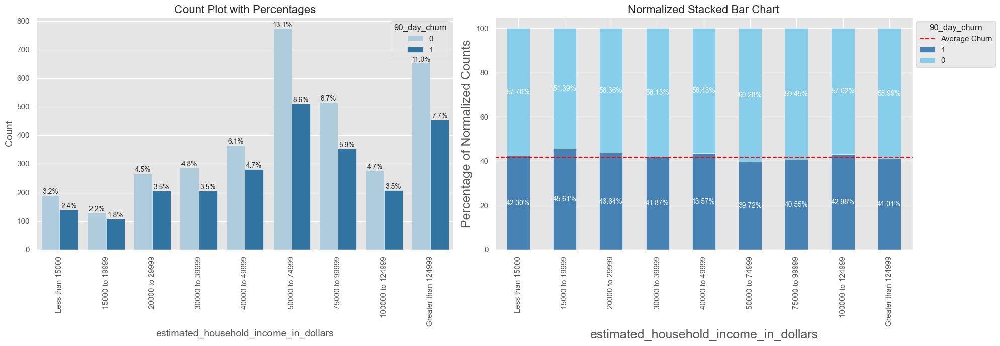

In [2045]:
plot_combined_counts_in_one(df_train, 'estimated_household_income_in_dollars', '90_day_churn', 20, 7, 10, show_percentages=True)

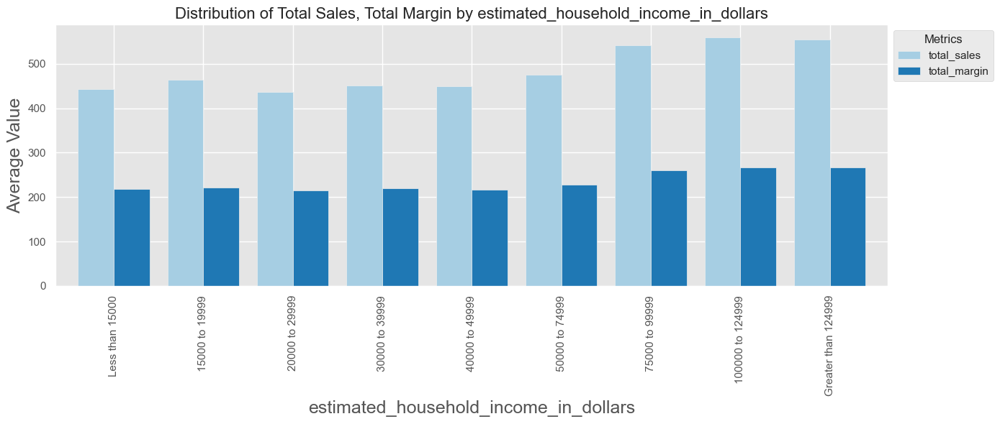

In [2046]:
plot_grouped_bar(
    df=df_train,
    group_col='estimated_household_income_in_dollars',
    metrics=['total_sales', 'total_margin'],
    title='Distribution of Total Sales, Total Margin by estimated_household_income_in_dollars',
    xlabel='estimated_household_income_in_dollars',
    ylabel='Average Value',
    figsize=(14, 6),
    colors=colors,
    width=0.8
)

<p style="color:black; font-weight:bold; font-size:20px;">Insights</p>

    The charts above indicate that in regions with higher home prices, consumer spending power is also higher. There is a positive correlation between home prices and sales volume, as well as profit. Future marketing efforts or store placements could be strategically focused on areas with higher home prices.
    
    Target label distribution varies very slightly, Feature seems not likely contribute to modeling, need further study.

### Column 'population_density': contains information of Customer’s estimated household income.No missing value.

**Because 'population_density' has string characters and numeric,so we need to take action to
    a.	Extract a categorical variable from this column with the values [‘Rural’, ‘Suburban’, ‘Urban’]
    b.	Extract a numeric variable with the maximum HH/sq mile for each customer.**

In [2047]:
df_train.population_density.value_counts(dropna = False)

population_density
Smaller Suburbs or Towns - HHs/sq mile 301 - 591    785
Smaller Suburbs or Towns - HHs/sq mile 592 - 934    726
City and Surrounds - HHs/sq mile 935 - 1,327        701
City and Surrounds - HHs/sq mile 1,328 - 1,825      679
Smaller Suburbs or Towns - HHs/sq mile 110 - 300    669
City and Surrounds - HHs/sq mile 1,826 - 2,529      653
Rural areas - HHs/sq mile 30 - 109                  533
City and Surrounds - HHs/sq mile 2,530 - 3,158      306
Very Rural areas - HHs/sq mile less than 30         294
City and Surrounds - HHs/sq mile 3,159 - 4,430      230
Downtown Metro - HHs/sq mile 4,431 - 8,300          214
Very Urban - HHs/sq mile greater than 8,300         132
Name: count, dtype: int64

In [2048]:
# 1. Extract Categorical Variable
df_train['Population_Density_Category'] = df_train['population_density'].apply(lambda x:x.split(' - HHs/sq mile ')[0])


# 2. Extracting numeric variable
df_train['Population_Density_Numeric'] = df_train['population_density'].apply(lambda x:x.split(' - ')[-1].replace(',', ''))


In [2049]:
df_train['Population_Density_Numeric'] = pd.to_numeric(df_train['Population_Density_Numeric'], errors='coerce')

In [2050]:
df_train['Population_Density_Category'].unique()

array(['City and Surrounds', 'Very Rural areas',
       'Smaller Suburbs or Towns', 'Downtown Metro', 'Rural areas',
       'Very Urban'], dtype=object)

In [2051]:
df_train.head()

,total_sales,total_margin,total_units,total_txns,upt,spt,median_time_between_visit,days_from_last_visit,days_from_first_visit,std_time_between_visit,has_loyalty,profile_complete,species_group,visit_frequency,estimated_household_income_in_dollars,population_density,home_property_type,estimated_home_market_value_in_dollars,home_owner_or_renter,loyalty_discounts,cpn_discount,price_match_discounts,promo_discount,employee_discount,90_day_churn,90_day_sales,recency_score,frequency_score,monetary_score,RFM_Score,RFM_Loyalty_Level,KMeans_Loyalty_Level,Population_Density_Category,Population_Density_Numeric
6053,25.97,18.720,3,1,3.0000,25.9700,369,369,1045,0.00,1,0,Dog,1,50000 to 74999,"City and Surrounds - HHs/sq mile 935 - 1,327",Single,"125,000 - 149,999",Home Owner,0.00,0.0,0.0,0.00,0.0,1,0.00,1,1,1,3,Low,Low,City and Surrounds,1327.0
3740,363.80,254.718,26,10,2.6000,36.3800,7,72,234,27.12,1,1,Dog,9,30000 to 39999,Very Rural areas - HHs/sq mile less than 30,Single,"450,000 - 499,999",Home Owner,10.00,0.0,0.0,10.00,0.0,0,64.45,3,4,3,10,Medium,Medium,Very Rural areas,NaN
3082,101.68,52.975,8,3,2.6667,33.8933,3,101,371,186.68,1,0,Dog,3,100000 to 124999,"City and Surrounds - HHs/sq mile 1,328 - 1,825",Single,"275,000 - 299,999",Renter,6.75,0.0,0.0,6.75,0.0,1,0.00,2,1,2,5,Low,Low,City and Surrounds,1825.0
5709,1784.80,840.003,471,39,12.0769,45.7641,9,6,2171,14.87,1,1,Dog+Cat,38,100000 to 124999,Smaller Suburbs or Towns - HHs/sq mile 592 - 934,Apartment,"200,000 - 224,999",Renter,114.53,5.5,1.5,121.53,0.0,0,85.14,5,5,5,15,High,High,Smaller Suburbs or Towns,934.0
1392,1168.71,365.288,514,28,18.3571,41.7396,15,4,2175,11.91,1,1,Dog+Cat,28,Greater than 124999,"Downtown Metro - HHs/sq mile 4,431 - 8,300",Single,"1,000,000 Plus",Home Owner,53.03,3.0,0.0,57.83,0.0,0,106.11,5,5,5,15,High,Medium,Downtown Metro,8300.0


In [2052]:
df_train['Population_Density_Numeric'].isnull().sum()

426

**The new variable Population_Density_Numeric has 542 rows of missing values and needs to be addressed, which we discuss in the Univariate Analysis of NUMERIC features below.**

**now that we have two new viariables Population_Density_Category and Population_Density_Numeric, so we are going to drop the original variale population_density.**

In [2053]:
df_train.drop('population_density', axis=1, inplace=True)

In [2054]:
df_train.head()

,total_sales,total_margin,total_units,total_txns,upt,spt,median_time_between_visit,days_from_last_visit,days_from_first_visit,std_time_between_visit,has_loyalty,profile_complete,species_group,visit_frequency,estimated_household_income_in_dollars,home_property_type,estimated_home_market_value_in_dollars,home_owner_or_renter,loyalty_discounts,cpn_discount,price_match_discounts,promo_discount,employee_discount,90_day_churn,90_day_sales,recency_score,frequency_score,monetary_score,RFM_Score,RFM_Loyalty_Level,KMeans_Loyalty_Level,Population_Density_Category,Population_Density_Numeric
6053,25.97,18.720,3,1,3.0000,25.9700,369,369,1045,0.00,1,0,Dog,1,50000 to 74999,Single,"125,000 - 149,999",Home Owner,0.00,0.0,0.0,0.00,0.0,1,0.00,1,1,1,3,Low,Low,City and Surrounds,1327.0
3740,363.80,254.718,26,10,2.6000,36.3800,7,72,234,27.12,1,1,Dog,9,30000 to 39999,Single,"450,000 - 499,999",Home Owner,10.00,0.0,0.0,10.00,0.0,0,64.45,3,4,3,10,Medium,Medium,Very Rural areas,NaN
3082,101.68,52.975,8,3,2.6667,33.8933,3,101,371,186.68,1,0,Dog,3,100000 to 124999,Single,"275,000 - 299,999",Renter,6.75,0.0,0.0,6.75,0.0,1,0.00,2,1,2,5,Low,Low,City and Surrounds,1825.0
5709,1784.80,840.003,471,39,12.0769,45.7641,9,6,2171,14.87,1,1,Dog+Cat,38,100000 to 124999,Apartment,"200,000 - 224,999",Renter,114.53,5.5,1.5,121.53,0.0,0,85.14,5,5,5,15,High,High,Smaller Suburbs or Towns,934.0
1392,1168.71,365.288,514,28,18.3571,41.7396,15,4,2175,11.91,1,1,Dog+Cat,28,Greater than 124999,Single,"1,000,000 Plus",Home Owner,53.03,3.0,0.0,57.83,0.0,0,106.11,5,5,5,15,High,Medium,Downtown Metro,8300.0


**and I am going to renew the cat_col and numcol.**


**I am going to check new variable Population_Density_Category.**

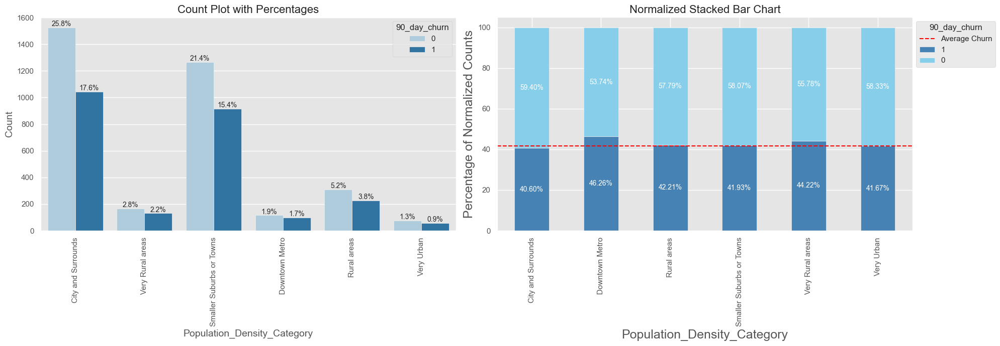

In [2055]:
plot_combined_counts_in_one(df_train, 'Population_Density_Category', '90_day_churn', 20, 7, 10, show_percentages=True)

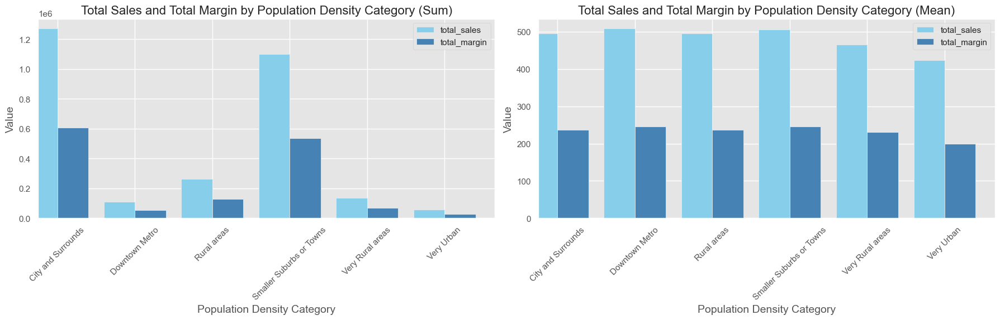

In [2056]:
# check the sales and margin distribution on Population_Density_Category by sum and mean.
plot_sales_margin_distribution_in_one(
    df=df_train,
    group_col='Population_Density_Category',
    metrics=['total_sales', 'total_margin'],
    agg_func1='sum',
    agg_func2='mean',
    title1='Total Sales and Total Margin by Population Density Category (Sum)',
    title2='Total Sales and Total Margin by Population Density Category (Mean)',
    xlabel='Population Density Category',
    ylabel='Value',
    colors=['skyblue', 'steelblue']
)

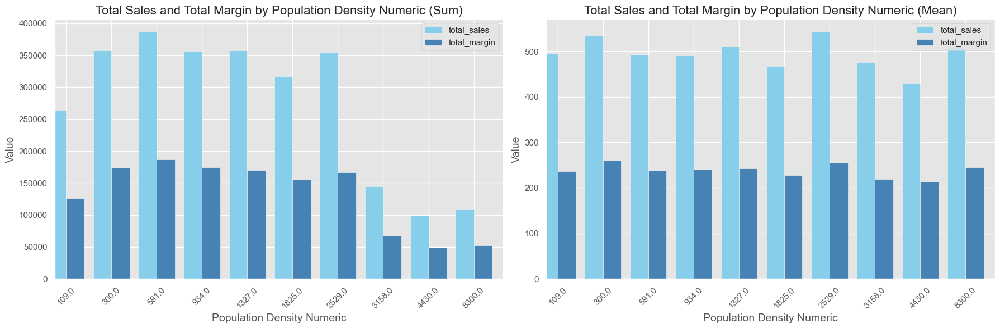

In [2057]:
# check the sales and margin distribution on Population_Density_Numeric by sum and mean.
plot_sales_margin_distribution_in_one(
    df=df_train,
    group_col='Population_Density_Numeric',
    metrics=['total_sales', 'total_margin'],
    agg_func1='sum',
    agg_func2='mean',
    title1='Total Sales and Total Margin by Population Density Numeric (Sum)',
    title2='Total Sales and Total Margin by Population Density Numeric (Mean)',
    xlabel='Population Density Numeric',
    ylabel='Value',
    colors=['skyblue', 'steelblue']
)

<p style="color:black; font-weight:bold; font-size:20px;">Insights</p>

**Contribution of City and Surrounding Areas, and Smaller Suburbs or Towns:**

    In terms of total sales and total margin, the "City and Surrounds" and "Smaller Suburbs or Towns" categories account for a significant portion. Especially in the "sum" charts, these areas have notably higher sales and margins compared to other regions.
    The average sales and average margins in these areas also outperform others, indicating that not only do these regions contribute significantly in terms of volume, but individual customer spending power is also strong.

**Performance of Downtown and Very Urban Areas:**

    "Downtown Metro" and "Very Urban" areas show relatively weaker performance in total sales and total margin. Their total sales and margins are considerably lower than those in the city and suburban areas.
    In the average sales and average margin charts, these urbanized areas perform slightly better, but still trail behind the high-performing regions mentioned earlier. This suggests that these highly urbanized regions may face more competition or other factors, such as higher living costs leading to reduced consumer spending.

**Potential in Rural and Remote Areas:**

    In the total sales and total margin charts, "Rural areas" and "Very Rural areas" have lower sales and margins compared to urban and suburban areas, but they still contribute a notable portion to these metrics.In the average sales and average margin charts, the performance of rural and remote areas is relatively better, indicating that although the overall spending capacity in these areas may be lower than in urban regions, the contribution per individual customer is higher.

<p style="color:black; font-weight:bold; font-size:20px;">Recommendations:</p>

**Focus Resources on High-Performing Regions:**

    The company should allocate more resources to the high-performing regions of "City and Surrounds" and "Smaller Suburbs or Towns," including enhancing marketing efforts, increasing store presence, or optimizing delivery services to further boost market share in these areas.
    Optimize Strategy in Urban Areas:

    For the relatively weaker performing "Downtown Metro" and "Very Urban" areas, the company should reassess the current marketing strategies and product offerings. It may be beneficial to introduce more customized products or services tailored to the demographics of these areas to attract more consumers.
    Develop Rural and Remote Markets:

    Considering the higher per-customer contribution in rural and remote areas, the company could explore expanding its presence in these regions. Although the total market size may be smaller than in urban areas, increasing market penetration and customer loyalty could effectively raise overall sales and margins in these areas.

**Target label distribution varies slightly, Feature not likely contribute to modeling, need further research.**

### Column home_property_type  contains information of Type of home customer lives in.No missing value.

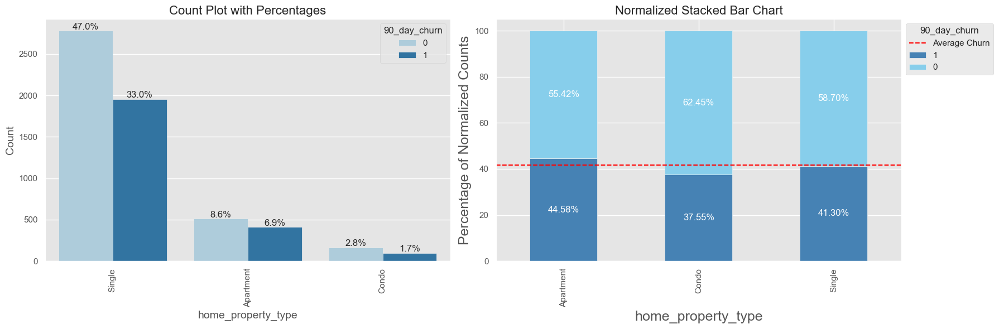

In [2058]:
plot_combined_counts_in_one(
    df=df_train,
    category_col='home_property_type',
    target_col='90_day_churn',
    length=18,
    height=6,
    fontsize=12,
    show_percentages=True
)

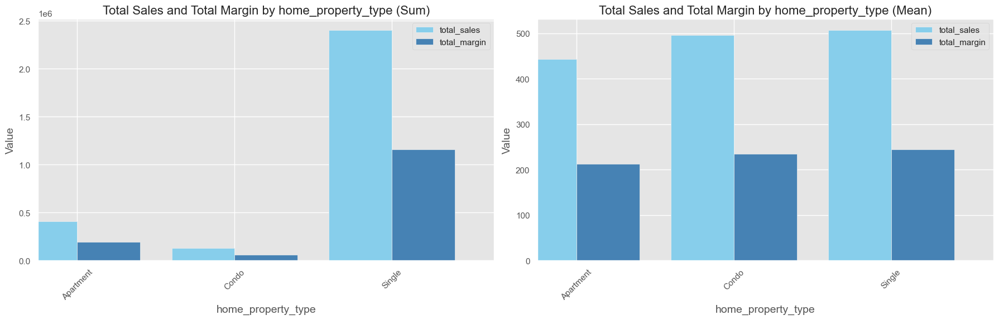

In [2059]:
plot_sales_margin_distribution_in_one(
    df=df_train,
    group_col='home_property_type',
    metrics=['total_sales', 'total_margin'],
    agg_func1='sum',
    agg_func2='mean',
    title1='Total Sales and Total Margin by home_property_type (Sum)',
    title2='Total Sales and Total Margin by home_property_type (Mean)',
    xlabel='home_property_type',
    ylabel='Value',
    colors=['skyblue', 'steelblue']
)

<p style="color:black; font-weight:bold; font-size:20px;">Insights:</p>

    In terms of total sales and total margin, Single Family Homes significantly outperform apartments and condos, primarily due to the larger number of customers in this category. Regarding average sales and average margin, Single Family Homes slightly exceed condos, making them the best-performing group. Their higher purchasing power suggests that they are likely the most valuable customer segment for the company. Given the higher loyalty and spending capacity of Single Family Home residents, the company should consider investing more marketing resources in this group and offering them personalized discounts and services to further enhance their value.

<p style="color:black; font-weight:bold; font-size:20px;">Target label distribution changes slightly, Feature not likely contribute to modeling,need further research.</p>

### Column estimated_home_market_value_in_dollars : Customer’s estimated home market value.No missing value.

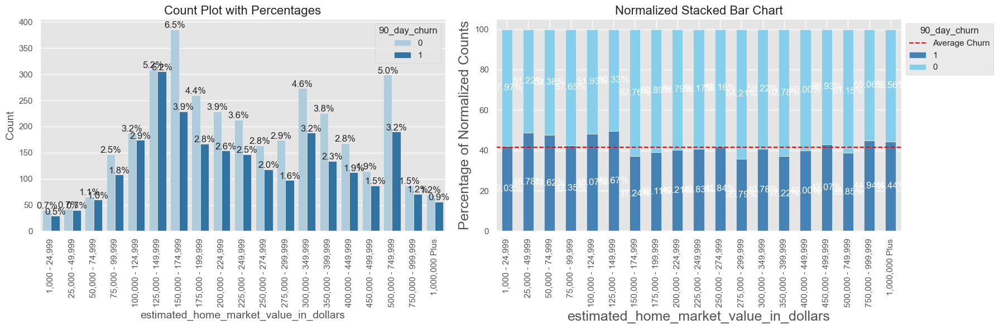

In [2060]:
# plot_counts(df_train, 'estimated_home_market_value_in_dollars', '90_day_churn', 16, 4, 6, show_percentages=True)
plot_combined_counts_in_one(
    df=df_train,
    category_col='estimated_home_market_value_in_dollars',
    target_col='90_day_churn',
    length=18,
    height=6,
    fontsize=12,
    show_percentages=True
)

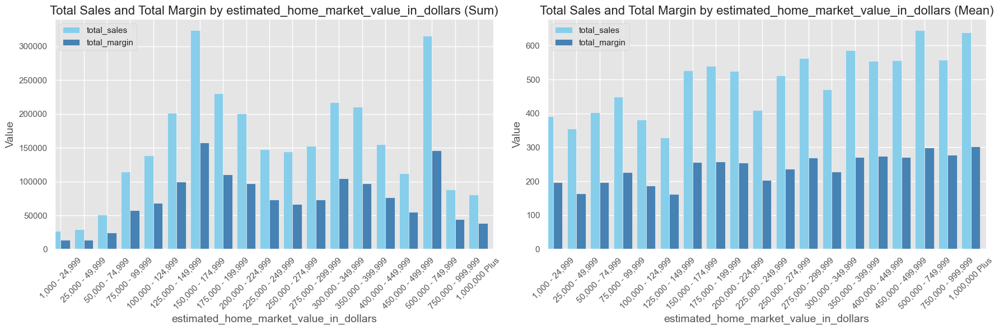

In [2061]:
plot_sales_margin_distribution_in_one(
    df=df_train,
    group_col='estimated_home_market_value_in_dollars',
    metrics=['total_sales', 'total_margin'],
    agg_func1='sum',
    agg_func2='mean',
    title1='Total Sales and Total Margin by estimated_home_market_value_in_dollars (Sum)',
    title2='Total Sales and Total Margin by estimated_home_market_value_in_dollars (Mean)',
    xlabel='estimated_home_market_value_in_dollars',
    ylabel='Value',
    colors=['skyblue', 'steelblue']
)

<p style="color:black; font-weight:bold; font-size:20px;">Insights:</p>

    The charts reveal that segments with higher home market values tend to exhibit a slightly lower churn rates, which suggests stronger customer loyalty. These segments also contribute significantly to total sales and margins, underscoring their importance to the business. The data shows that as home market value increases, so does the average sales and profit margin, indicating that customers in these segments have substantial purchasing power. This suggests that targeting marketing efforts and resources towards these high-value segments could yield better returns, as these customers not only remain loyal but also generate higher revenue and profitability for the company.

<p style="color:black; font-weight:bold; font-size:20px;">Target label distribution varies, Feature likely contribute to modeling.need further research.</p>

### Column home_owner_or_renter. No missing value.


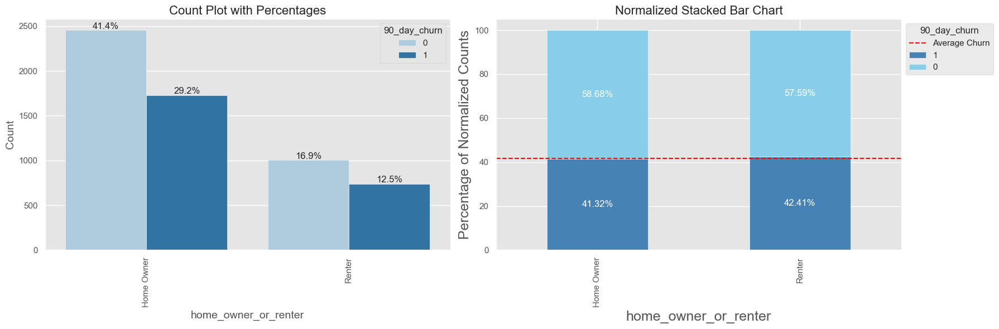

In [2062]:
plot_combined_counts_in_one(
    df=df_train,
    category_col='home_owner_or_renter',
    target_col='90_day_churn',
    length=18,
    height=6,
    fontsize=12,
    show_percentages=True
)

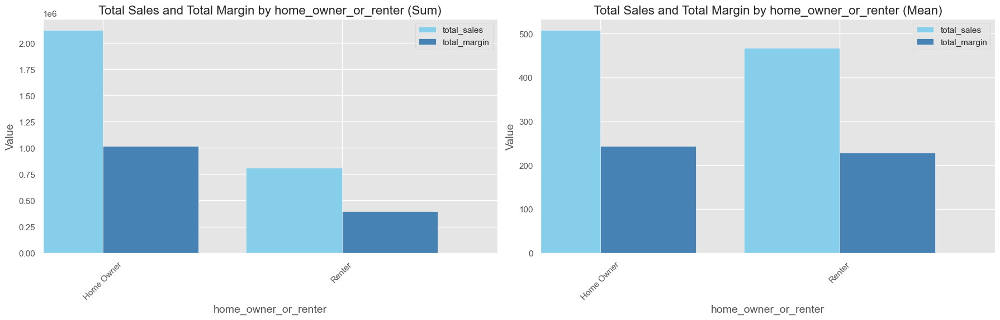

In [2063]:
plot_sales_margin_distribution_in_one(
    df=df_train,
    group_col='home_owner_or_renter',
    metrics=['total_sales', 'total_margin'],
    agg_func1='sum',
    agg_func2='mean',
    title1='Total Sales and Total Margin by home_owner_or_renter (Sum)',
    title2='Total Sales and Total Margin by home_owner_or_renter (Mean)',
    xlabel='home_owner_or_renter',
    ylabel='Value',
    colors=['skyblue', 'steelblue']
)

<p style="color:black; font-weight:bold; font-size:20px;">Insights:</p>

    From the charts, we can observe a clear distinction between home owners and renters in terms of customer behavior and value:

    Churn Rates: Homeowners exhibit slightly lower churn rates compared to renters, as shown in the normalized stacked bar chart.

    Sales and Margin: Homeowners significantly contribute more to both total sales and total margin compared to renters. This is evident in both the sum and mean distribution charts. The average sales and margin values for homeowners are notably higher, indicating that this group is more likely to spend more and contribute more to the company's profitability.

    Overall, homeowners appear to be a more valuable customer segment with higher loyalty and spending power. The company should consider focusing more marketing and retention efforts on this group, possibly through targeted promotions, loyalty programs, or personalized services aimed at further enhancing their customer experience and value.
    

<p style="color:black; font-weight:bold; font-size:20px;">Target label distribution change slightly, Feature not likely contribute to modeling, need further research.</p>

### Column RFM_Loyalty_Level: segmentation information From RFM analysis.No missing value.

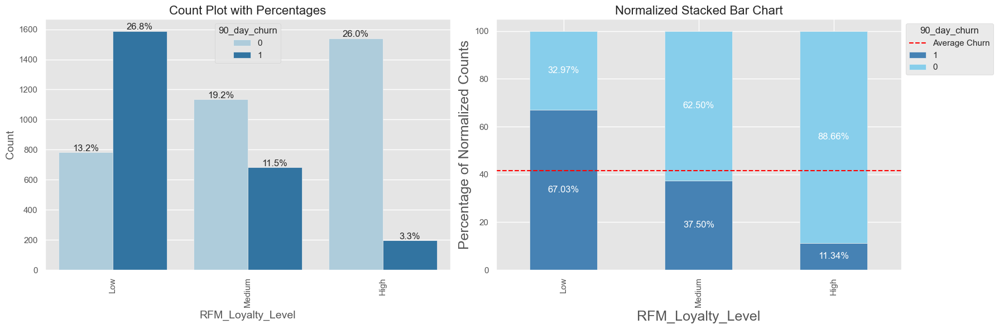

In [2066]:
plot_combined_counts_in_one(
    df=df_train,
    category_col='RFM_Loyalty_Level',
    target_col='90_day_churn',
    length=18,
    height=6,
    fontsize=12,
    show_percentages=True
)

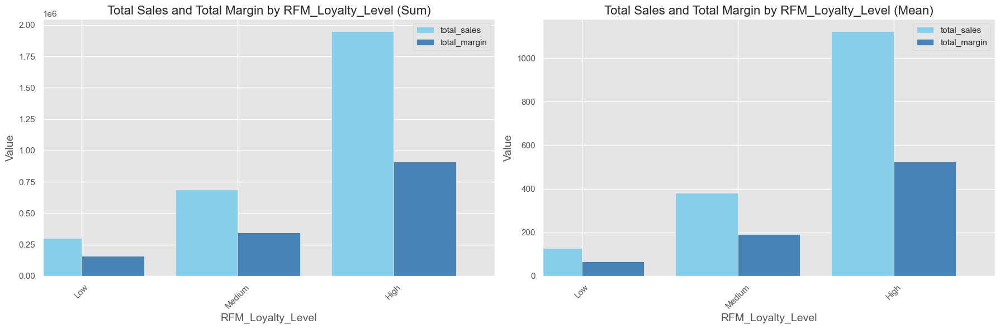

In [2068]:
plot_sales_margin_distribution_in_one(
    df=df_train,
    group_col='RFM_Loyalty_Level',
    metrics=['total_sales', 'total_margin'],
    agg_func1='sum',
    agg_func2='mean',
    title1='Total Sales and Total Margin by RFM_Loyalty_Level (Sum)',
    title2='Total Sales and Total Margin by RFM_Loyalty_Level (Mean)',
    xlabel='RFM_Loyalty_Level',
    ylabel='Value',
    colors=['skyblue', 'steelblue']
)

<p style="color:black; font-weight:bold; font-size:20px;">Insights:</p>
    
    The data indicates that customers classified under the High RFM Loyalty Level are not only more loyal, as evidenced by their lower churn rates, but also contribute the most to sales and margin. This underscores the importance of focusing retention efforts and resources on this group to maximize their lifetime value. Conversely, the Low RFM Loyalty Level group poses the highest risk of churn, suggesting that targeted marketing strategies are needed to improve engagement and retention within this segment. The Medium group, while less at risk of churn than the Low group, still presents opportunities for growth and should be nurtured to elevate them towards the High loyalty group.

<p style="color:black; font-weight:bold; font-size:20px;">Target label distribution varies. churn rate shows siginficant difference of distribution within each group, indicating it would be a good preditor, need further research.</p>

### Column KMeans_Loyalty_Level: segmentation information From Kmeans analysis.No missing value.

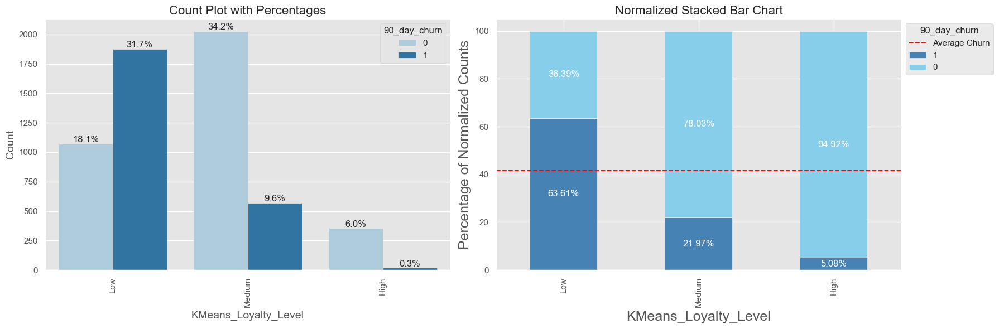

In [2069]:
plot_combined_counts_in_one(
    df=df_train,
    category_col='KMeans_Loyalty_Level',
    target_col='90_day_churn',
    length=18,
    height=6,
    fontsize=12,
    show_percentages=True
)

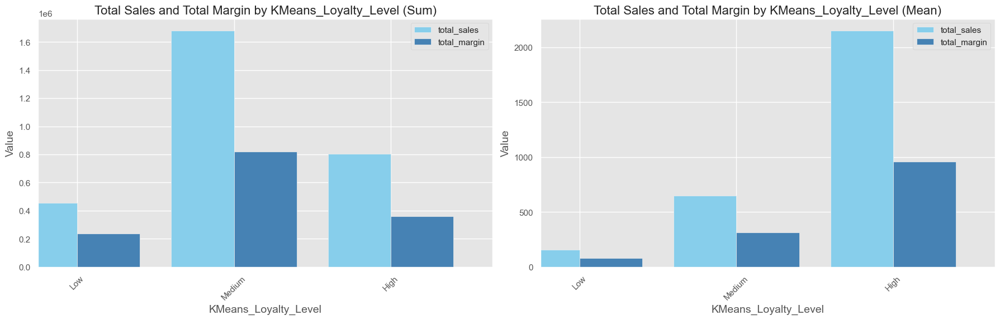

In [2070]:
plot_sales_margin_distribution_in_one(
    df=df_train,
    group_col='KMeans_Loyalty_Level',
    metrics=['total_sales', 'total_margin'],
    agg_func1='sum',
    agg_func2='mean',
    title1='Total Sales and Total Margin by KMeans_Loyalty_Level (Sum)',
    title2='Total Sales and Total Margin by KMeans_Loyalty_Level (Mean)',
    xlabel='KMeans_Loyalty_Level',
    ylabel='Value',
    colors=['skyblue', 'steelblue']
)

<p style="color:black; font-weight:bold; font-size:20px;">Insights:</p>

    The charts indicate that customers classified under the High KMeans_Loyalty_Level have the lowest churn rate and contribute significantly to average sales and margins, despite their smaller size.  The Medium loyalty level, while showing higher churn than the High group, is the largest contributor to overall sales and margins, making it a key revenue driver.  Conversely, the Low loyalty group has the highest churn and contributes the least, suggesting a need for different retention strategies or a focus on more profitable segments.  This analysis underscores the importance of targeting the High and Medium loyalty groups to maximize customer value.

<p style="color:black; font-weight:bold; font-size:20px;">Target label distribution varies, churn rate shows siginficant difference of distribution within each group, indicating it would be a good preditor. Specially, the The High group exhibits very high loyalty,while low with pretty high churn rate, need further research.</p>

<h2 style="color:blue">Univariate Analysis - Numerical Features</h2>

### handle with 90_day_churn and 90_day_sales.

<p style="color:black; font-weight:bold; font-size:20px;">Firstly, we discuss the variables 90_day_churn and 90_day_sales, as previously outlined in the section on target variables, both are suitable as targets for observation rather than as input features. This is because, by definition, these two variables are positively correlated. Within the 90-day observation period, if a transaction occurs, then 90_day_sales will not be zero, and concurrently, the customer will be defined as not churned, hence the 90_day_churn variable will be set to 0. By analyzing the data we have, this analysis can be further confirmed. We can convert the value of 90_day_sales into a binary variable; it is assigned a value of 1 if 90_day_sales is zero, otherwise, it is 1.</p>

In [2071]:
df['90_day_sales_binary'] = df['90_day_sales'].apply(lambda x: 0 if x > 0 else 1)

In [2072]:
(df['90_day_sales_binary'] == df['90_day_churn']).all()

True

<p style="color:black; font-weight:bold; font-size:20px;">Based on the analysis above, we will exclude 90_day_sales as an input in the upcoming modeling task.</p>

In [2073]:
df_train.drop('90_day_sales',axis=1, inplace = True)

### Handling with missing values in numerical columns


<h3 style="color:blue">Mising value fillin strategies</h2>

Handling with missing values is really a big topic. This involves investigating, whether the missing values are uniformly distributed across different features, determining if they are numerical or categorical, identifying the number of features with missing data, and identifying any patterns in the types of transactions with significant missing data. Additionally, I would explore the reasons behind the missing data, classifying it as Missing Completely At Random (MCAR), Missing At Random (MAR), or Not Missing At Random (NMAR).

Next, I would establish a baseline model without addressing missing values to assess whether the missing data truly impacts model performance. If the missing data is predominantly associated with loans that rarely default or occurs mainly in columns with limited predictive value, it might be unnecessary to handle missing values, and building a baseline model might be sufficient.

If the baseline model suggests that addressing missing data is worthwhile, I would check the proportion of missing data in the whole datasets, if the missing part is under 5%, I would employ imputation techniques. For continuous features, I might use mean or median imputation, or consider nearest neighbors methods based on other available features to estimate missing values. Beyond that point, I would choose using an alternative method like indicator variables, categorical variables for missing data values.

<h3 style="color:blue">Check missing values in numerical columns</h2>

In [2074]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5922 entries, 6053 to 5219
Data columns (total 32 columns):
 #   Column                                  Non-Null Count  Dtype   
---  ------                                  --------------  -----   
 0   total_sales                             5922 non-null   float64 
 1   total_margin                            5922 non-null   float64 
 2   total_units                             5922 non-null   int64   
 3   total_txns                              5922 non-null   int64   
 4   upt                                     5922 non-null   float64 
 5   spt                                     5922 non-null   float64 
 6   median_time_between_visit               5922 non-null   int64   
 7   days_from_last_visit                    5922 non-null   int64   
 8   days_from_first_visit                   5922 non-null   int64   
 9   std_time_between_visit                  5922 non-null   float64 
 10  has_loyalty                             5922 non-n

In [2075]:
# Convert categorical types to object types
df_train['estimated_home_market_value_in_dollars'] = df_train['estimated_home_market_value_in_dollars'].astype('object')
df_train['estimated_household_income_in_dollars'] = df_train['estimated_household_income_in_dollars'].astype('object')
df_train['RFM_Loyalty_Level'] = df_train['RFM_Loyalty_Level'].astype('object')
df_train['KMeans_Loyalty_Level'] = df_train['KMeans_Loyalty_Level'].astype('object')

In [2076]:
#update the columns
cat_col_train = [col for col in df_train.columns if df_train[col].dtype == 'object']
num_col_train = [col for col in df_train.columns if col not in cat_col_train]
print('cat_col_train : {} \n\
num_col_train : {}'.format(len(cat_col_train), len(num_col_train)))

cat_col_train : 8 
num_col_train : 24


In [2077]:
df_train[num_col_train].head()

,total_sales,total_margin,total_units,total_txns,upt,spt,median_time_between_visit,days_from_last_visit,days_from_first_visit,std_time_between_visit,has_loyalty,profile_complete,visit_frequency,loyalty_discounts,cpn_discount,price_match_discounts,promo_discount,employee_discount,90_day_churn,recency_score,frequency_score,monetary_score,RFM_Score,Population_Density_Numeric
6053,25.97,18.720,3,1,3.0000,25.9700,369,369,1045,0.00,1,0,1,0.00,0.0,0.0,0.00,0.0,1,1,1,1,3,1327.0
3740,363.80,254.718,26,10,2.6000,36.3800,7,72,234,27.12,1,1,9,10.00,0.0,0.0,10.00,0.0,0,3,4,3,10,NaN
3082,101.68,52.975,8,3,2.6667,33.8933,3,101,371,186.68,1,0,3,6.75,0.0,0.0,6.75,0.0,1,2,1,2,5,1825.0
5709,1784.80,840.003,471,39,12.0769,45.7641,9,6,2171,14.87,1,1,38,114.53,5.5,1.5,121.53,0.0,0,5,5,5,15,934.0
1392,1168.71,365.288,514,28,18.3571,41.7396,15,4,2175,11.91,1,1,28,53.03,3.0,0.0,57.83,0.0,0,5,5,5,15,8300.0


In [2078]:
# numerical columns in the dataset
print("There are {} numerical columns:".format(len(num_col_train)))
print('='*50)
print(num_col_train)

There are 24 numerical columns:
['total_sales', 'total_margin', 'total_units', 'total_txns', 'upt', 'spt', 'median_time_between_visit', 'days_from_last_visit', 'days_from_first_visit', 'std_time_between_visit', 'has_loyalty', 'profile_complete', 'visit_frequency', 'loyalty_discounts', 'cpn_discount', 'price_match_discounts', 'promo_discount', 'employee_discount', '90_day_churn', 'recency_score', 'frequency_score', 'monetary_score', 'RFM_Score', 'Population_Density_Numeric']


In [2079]:
missing_counts = df_train[num_col_train].isnull().sum().all() == 0
missing_counts

True

<AxesSubplot: >

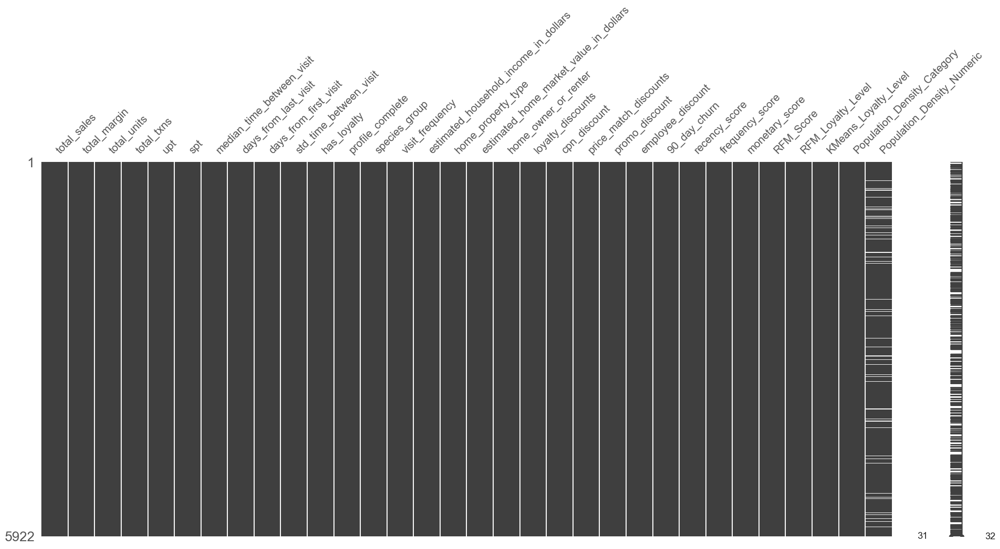

In [2080]:
mno.matrix(df_train)

Total 1 features have missing values.


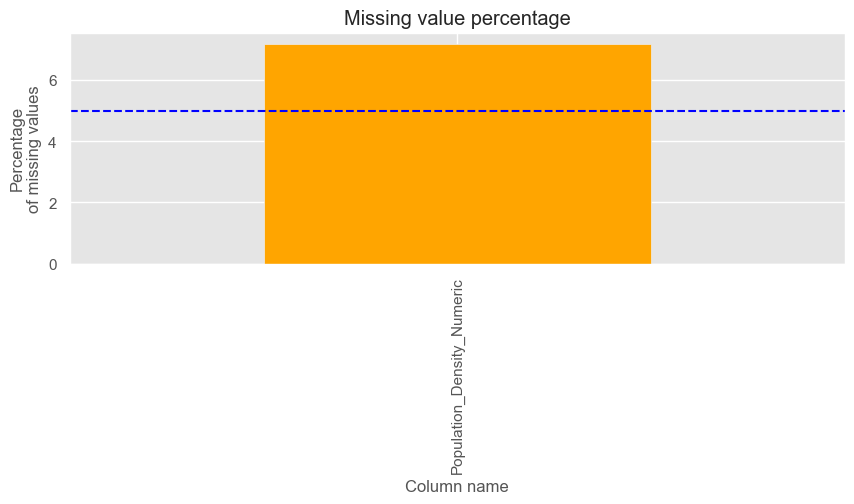

In [2081]:
# Plot missing value percentage
# dash line set at 5%

print(f"Total {sum(df_train[num_col_train].isnull().mean()>0)} features have missing values.")
print('='*40)

ax = (df_train[num_col_train].isnull().mean()
            .nlargest(sum(df_train[num_col_train].isnull().mean()>0))
            .mul(100)
            .plot(kind='bar', figsize=(10,3),color='orange',
                  title='Missing value percentage')
     )

ax.axhline(y=5, color='blue', linestyle='--')
ax.set_xlabel('Column name')
ax.set_ylabel('Percentage\nof missing values')
plt.show()

**only Population_Density_Numeric has 426 missing values (7.19%).**

<p style="color:black; font-weight:bold; font-size:20px;">First, I will observe the correlation between Population_Density_Numeric and other columns to determine if methods such as regression or KNN would be suitable for handling the missing values. </p>

In [2082]:
# observe the relationship between each numrical columns
df_train[num_col_train].corr()

,total_sales,total_margin,total_units,total_txns,upt,spt,median_time_between_visit,days_from_last_visit,days_from_first_visit,std_time_between_visit,has_loyalty,profile_complete,visit_frequency,loyalty_discounts,cpn_discount,price_match_discounts,promo_discount,employee_discount,90_day_churn,recency_score,frequency_score,monetary_score,RFM_Score,Population_Density_Numeric
0,,,,,,,,,,,,,,,,,,,,,,,,
total_sales,1.000000,0.950825,0.469289,0.814485,0.258094,0.292811,-0.328157,-0.339247,0.206934,-0.146126,NaN,0.083488,0.813530,0.806917,0.325862,0.180207,0.676979,0.137749,-0.328520,0.406660,0.658146,0.718687,0.690868,-0.006828
total_margin,0.950825,1.000000,0.438948,0.769277,0.231610,0.293941,-0.333212,-0.336040,0.181688,-0.130674,NaN,0.072467,0.764816,0.754197,0.245431,0.135050,0.585651,0.068789,-0.326064,0.399211,0.652482,0.718319,0.685618,-0.009909
total_units,0.469289,0.438948,1.000000,0.547773,0.750350,0.012242,-0.158913,-0.159292,0.109749,-0.105791,NaN,0.068129,0.550847,0.471190,0.118558,0.095101,0.360089,0.047178,-0.160144,0.202847,0.328881,0.302348,0.323498,-0.000209
total_txns,0.814485,0.769277,0.547773,1.000000,0.235583,-0.050360,-0.380473,-0.377336,0.208205,-0.162103,NaN,0.108684,0.994789,0.697820,0.309510,0.226746,0.636746,0.205425,-0.355797,0.452537,0.758461,0.681933,0.734353,0.014668
upt,0.258094,0.231610,0.750350,0.235583,1.000000,0.143208,-0.093349,-0.065045,0.049011,-0.075835,NaN,0.071667,0.241294,0.284924,0.052201,0.039357,0.199529,0.001641,-0.077551,0.090650,0.166781,0.189003,0.172928,-0.001530
spt,0.292811,0.293941,0.012242,-0.050360,0.143208,1.000000,0.025302,0.000081,0.013878,-0.031703,NaN,-0.013211,-0.049081,0.161840,0.066571,-0.011384,0.115206,-0.017376,-0.012888,-0.002418,-0.053876,0.317571,0.098435,-0.026830
median_time_between_visit,-0.328157,-0.333212,-0.158913,-0.380473,-0.093349,0.025302,1.000000,0.360112,-0.048669,-0.201974,NaN,-0.110606,-0.382021,-0.279989,-0.102903,-0.089253,-0.237121,-0.039457,0.274100,-0.334451,-0.534374,-0.491117,-0.527438,-0.015924
days_from_last_visit,-0.339247,-0.336040,-0.159292,-0.377336,-0.065045,0.000081,0.360112,1.000000,-0.054501,-0.139873,NaN,-0.115770,-0.379026,-0.284127,-0.104638,-0.070814,-0.235484,-0.042698,0.430160,-0.867305,-0.473287,-0.444658,-0.690071,-0.004481
days_from_first_visit,0.206934,0.181688,0.109749,0.208205,0.049011,0.013878,-0.048669,-0.054501,1.000000,0.155193,NaN,-0.131103,0.214769,0.163209,0.036502,0.038200,0.125829,0.012584,-0.094704,0.080943,0.260600,0.245257,0.227863,-0.036023


<AxesSubplot: xlabel='0', ylabel='0'>

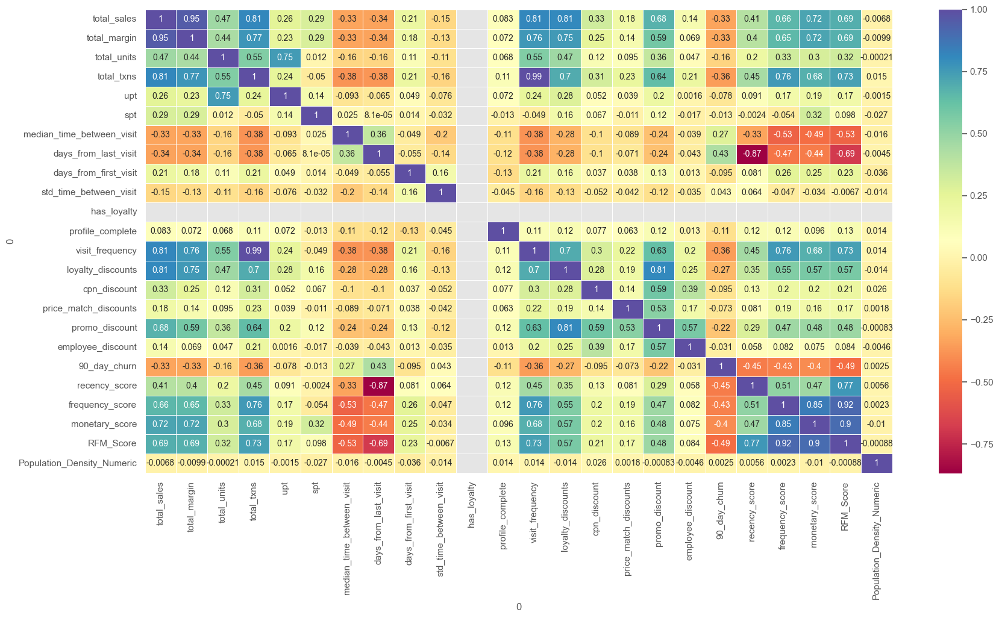

In [2083]:
plt.figure(figsize=(20,10))
    
sns.heatmap(df_train[num_col_train].corr(),annot = True, cmap = 'Spectral',
           lw = 0.5, linecolor = 'white')

<p style="color:black; font-weight:bold; font-size:20px;">From the analysis above, it appears that the correlation between Population_Density_Numeric and other features is very weak, making regression or KNN methods inappropriate for this situation. As the next step, I will continue to examine the distribution of the missing variable and the pattern of its missing values before deciding on the most suitable imputation method.</p>

**Rule of thumb :**
- If the skewness is between -0.5 & 0.5, the data are nearly symmetrical.
- If the skewness is between -1 & -0.5 (negative skewed) or between 0.5 & 1(positive skewed), the data are slightly skewed.
- If the skewness is lower than -1 (negative skewed) or greater than 1 (positive skewed), the data are extremely skewed.

<p style="color:black; font-weight:bold; font-size:20px;">To check the skewness of the Population_Density_Numeric column within each group of KMeans_Loyalty_Level and plot the results, you can use the following Python code</p>

  KMeans_Loyalty_Level  Population_Density_Numeric
0                 High                    2.365481
1                  Low                    2.326921
2               Medium                    2.335976


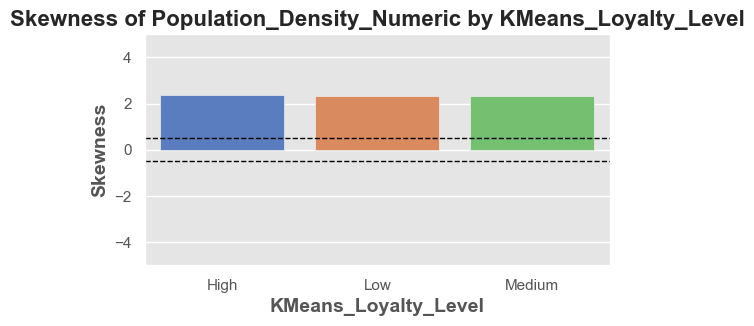

In [2084]:
# Group the data by 'KMeans_Loyalty_Level' and calculate skewness for 'Population_Density_Numeric'
skewness_by_group = df_train.groupby('KMeans_Loyalty_Level')['Population_Density_Numeric'].skew().reset_index()

# Print the skewness values
print(skewness_by_group)

# Bar plot for skewness by 'KMeans_Loyalty_Level'
plt.figure(figsize=(6, 3))
sns.barplot(x='KMeans_Loyalty_Level', y='Population_Density_Numeric', data=skewness_by_group, palette="muted")
plt.axhline(y=0.5, color='black', linestyle='--', linewidth=1)
plt.axhline(y=-0.5, color='black', linestyle='--', linewidth=1)
plt.ylim(-5, 5)

# Add a more elegant font style
plt.title('Skewness of Population_Density_Numeric by KMeans_Loyalty_Level', fontsize=16, fontweight='bold')
plt.xlabel('KMeans_Loyalty_Level', fontsize=14, fontweight='bold')
plt.ylabel('Skewness', fontsize=14, fontweight='bold')
plt.show()

<p style="color:black; font-weight:bold; font-size:20px;">Check the distribution of missing values in Population_Density_Numeric to see if the missingness is MCAR (missing completely at random) or not.</p>

In [2085]:
# check if missing in these column is MCAR (missing completely at random)
import sys
from scipy import stats
from scipy.stats import ttest_ind

In [2086]:
# Column to check
col = 'Population_Density_Numeric'

# Calculate percentage of missing values
missing_percentages = df_train[col].isnull().sum() / len(df_train) * 100
print(f"Missing Percentage in {col}: {missing_percentages:.2f}%")

if missing_percentages == 0:
    print(f"No missing values in {col}.")
else:
    # Impute missing values with mean
    col_imputed = df_train[col].fillna(df_train[col].mean())
    
    # Perform t-test to compare distributions
    original_data = df_train[col].dropna()
    imputed_data = col_imputed.dropna()
    
    if len(original_data) == 0 or len(imputed_data) == 0:
        print(f"Not enough data for t-test in {col}.")
    else:
        t_statistic, p_value = stats.ttest_ind(original_data, imputed_data, equal_var=False)
        print(f"p-value for {col}: {p_value:.4f}")
        
        # Check MCAR condition
        if p_value < 0.05:
            print(f"The missing values in {col} may not be MCAR.")
        else:
            print(f"The missing values in {col} appear to be MCAR.")

Missing Percentage in Population_Density_Numeric: 7.19%
p-value for Population_Density_Numeric: 1.0000
The missing values in Population_Density_Numeric appear to be MCAR.


<p style="color:black; font-weight:bold; font-size:20px;">Given that the missingness is MCAR of Population_Density_Numeric, and the skewness of Population_Density_Numeric in each group is above 1 (indicating a right-skewed distribution), the most appropriate method for filling in the missing values would likely be using median value in each group.</p>

In [2087]:
# Define the column and the grouping column
col = 'Population_Density_Numeric'
group_col = 'KMeans_Loyalty_Level'

# Fill missing values in Population_Density_Numeric using the median of each group
df_train[col] = df_train.groupby(group_col)[col].transform(lambda x: x.fillna(x.median()))

# Verify the result
print(df_train[col].isnull().sum())  # Should print 0 if all missing values are filled


0


<AxesSubplot: >

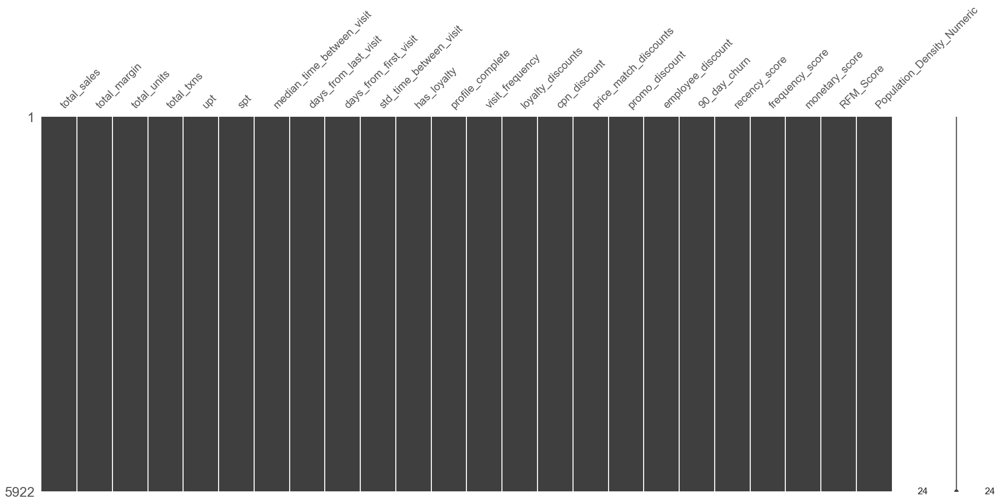

In [2088]:
mno.matrix(df_train[num_col_train])

### Distribution of data in numerical columns


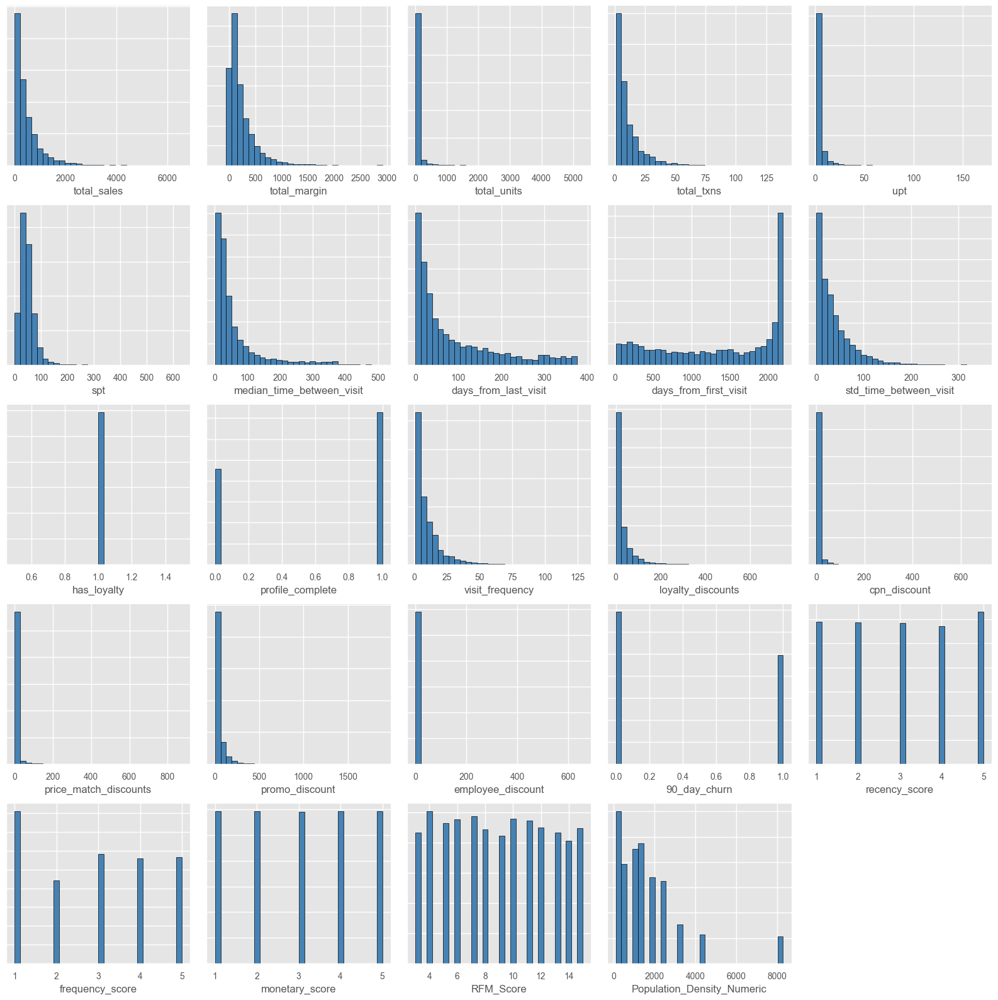

In [2089]:
import matplotlib.pyplot as plt

def plot_histograms(df, num_columns, n_rows=5, n_cols=5, figsize=(16, 16)):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    axes = axes.flatten()

    for i, col in enumerate(num_columns):
        ax = axes[i]
        ax.hist(df[col], bins=30, color='steelblue', edgecolor='black')
        ax.tick_params(axis='both', which='both', labelsize=10)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_xlabel(col, fontsize=12)
        ax.set_yticklabels([])  # Remove y-axis tick labels

    # Remove empty subplots
    if len(num_columns) < len(axes):
        for j in range(len(num_columns), len(axes)):
            fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Plot histograms of numerical columns in a 5x5 grid layout
plot_histograms(df_train, num_col_train, n_rows=5, n_cols=5)


<p style="color:black; font-weight:bold; font-size:20px;">as we can see from above charts, some columns are distributed abnormally,like 'upt', 'employee_discount', 'has_loyalty', 'cpn_discount', 'price_match_discounts',might indicating special correlation with target variable, need more study.</p>

In [2090]:
#Columns need attention:
abnormal_cols = ['total_units', 'upt', 'cpn_discount','has_loyalty','price_match_discounts','promo_discount','employee_discount']

In [2091]:
# Get value counts and percentage frequencies for column upt
value_counts = df_train['upt'].value_counts(dropna=False).sort_values(ascending=False).head(10)
percentages = (value_counts / len(df_train['upt'])) * 100

# Create resulting DataFrame
result = pd.DataFrame({'Count': value_counts, 'Percentage': percentages})
print(result)

        Count  Percentage
upt                      
2.0000    432    7.294833
1.0000    324    5.471125
3.0000    268    4.525498
4.0000    184    3.107058
1.5000    167    2.819993
2.5000    155    2.617359
2.3333     87    1.469098
3.5000     84    1.418440
5.0000     83    1.401554
1.6667     79    1.334009


In [2092]:
# Get value counts and percentage frequencies for column employee_discount
value_counts = df_train['employee_discount'].value_counts(dropna=False).sort_values(ascending=False).head(5)
percentages = (value_counts / len(df_train['employee_discount'])) * 100

# Create resulting DataFrame
result = pd.DataFrame({'Count': value_counts, 'Percentage': percentages})
print(result)

                   Count  Percentage
employee_discount                   
0.00                5886   99.392097
250.92                 1    0.016886
2.54                   1    0.016886
52.99                  1    0.016886
508.24                 1    0.016886


In [2093]:
# Get value counts and percentage frequencies for column has_loyalty
value_counts = df_train['has_loyalty'].value_counts(dropna=False).sort_values(ascending=False).head(5)
percentages = (value_counts / len(df_train['has_loyalty'])) * 100

# Create resulting DataFrame
result = pd.DataFrame({'Count': value_counts, 'Percentage': percentages})
print(result)

             Count  Percentage
has_loyalty                   
1             5922       100.0


In [2094]:
# Get value counts and percentage frequencies for column cpn_discount
value_counts = df_train['cpn_discount'].value_counts(dropna=False).sort_values(ascending=False).head(5)
percentages = (value_counts / len(df_train['cpn_discount'])) * 100

# Create resulting DataFrame
result = pd.DataFrame({'Count': value_counts, 'Percentage': percentages})
print(result)

              Count  Percentage
cpn_discount                   
0.0            4667   78.807835
10.0            285    4.812563
5.0              78    1.317123
3.0              59    0.996285
20.0             54    0.911854


In [2095]:
# Get value counts and percentage frequencies for column price_match_discounts
value_counts = df_train['price_match_discounts'].value_counts(dropna=False).sort_values(ascending=False).head(5)
percentages = (value_counts / len(df_train['price_match_discounts'])) * 100

# Create resulting DataFrame
result = pd.DataFrame({'Count': value_counts, 'Percentage': percentages})
print(result)

                       Count  Percentage
price_match_discounts                   
0.0                     5049   85.258359
3.0                       29    0.489699
5.0                       27    0.455927
6.0                       22    0.371496
2.0                       18    0.303951


<p style="color:black; font-weight:bold; font-size:20px;">Based on the analysis, it appears that the features has_loyalty and employee_discount both have a dominant value accounting for over 99% of their distribution. This suggests that they may not be particularly useful for predicting the target variable. Therefore, I will drop these two features and continue to examine the other variables.</p>

In [2096]:
df_train.drop(['has_loyalty', 'employee_discount'], axis = 1, inplace = True)

In [2097]:
#update the colums
cat_col_train = [col for col in df_train.columns if df_train[col].dtype == 'object']
num_col_train = [col for col in df_train.columns if col not in cat_col_train]
print('cat_col_train : {} \n\
num_col_train : {}'.format(len(cat_col_train), len(num_col_train)))

cat_col_train : 8 
num_col_train : 22


### Check distribution of target label y in numerical features

In [2098]:
df_train[num_col_train].head()

,total_sales,total_margin,total_units,total_txns,upt,spt,median_time_between_visit,days_from_last_visit,days_from_first_visit,std_time_between_visit,profile_complete,visit_frequency,loyalty_discounts,cpn_discount,price_match_discounts,promo_discount,90_day_churn,recency_score,frequency_score,monetary_score,RFM_Score,Population_Density_Numeric
6053,25.97,18.720,3,1,3.0000,25.9700,369,369,1045,0.00,0,1,0.00,0.0,0.0,0.00,1,1,1,1,3,1327.0
3740,363.80,254.718,26,10,2.6000,36.3800,7,72,234,27.12,1,9,10.00,0.0,0.0,10.00,0,3,4,3,10,934.0
3082,101.68,52.975,8,3,2.6667,33.8933,3,101,371,186.68,0,3,6.75,0.0,0.0,6.75,1,2,1,2,5,1825.0
5709,1784.80,840.003,471,39,12.0769,45.7641,9,6,2171,14.87,1,38,114.53,5.5,1.5,121.53,0,5,5,5,15,934.0
1392,1168.71,365.288,514,28,18.3571,41.7396,15,4,2175,11.91,1,28,53.03,3.0,0.0,57.83,0,5,5,5,15,8300.0


In [2099]:
num_col_train_temp = [col for col in num_col_train if col != '90_day_churn']

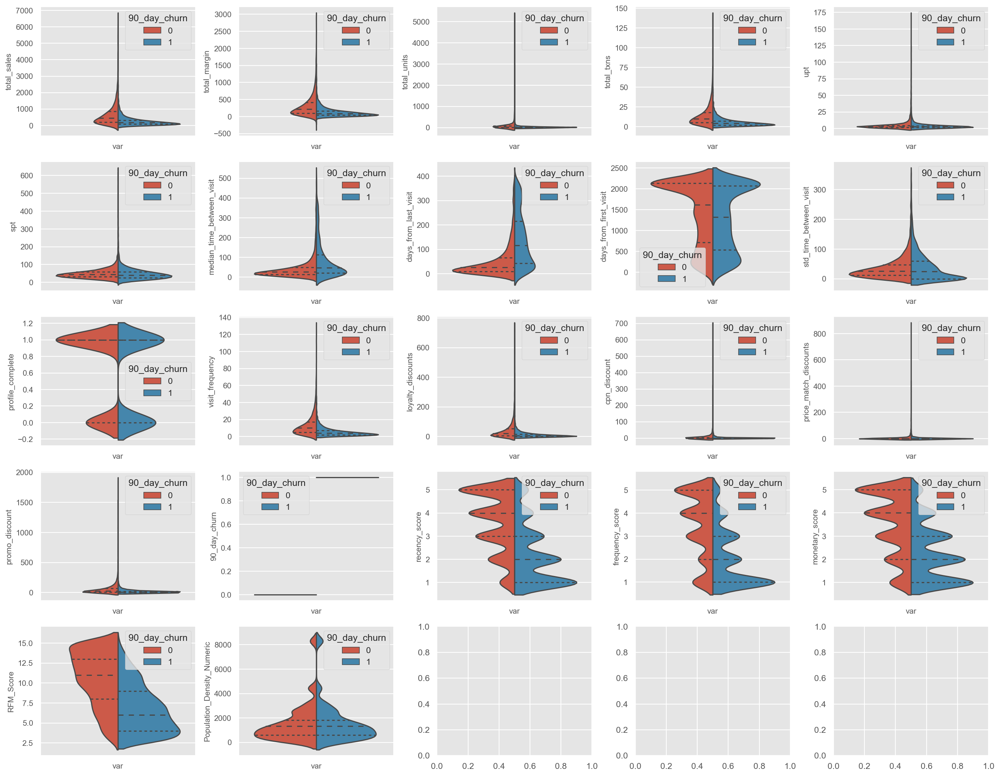

In [2100]:
# plot the distribution of data in either 0 or 1 group for each numerical columns

num_df_train = df_train[num_col_train].copy()
num_df_train['var'] = 'var'
nrows = 5
ncols = 5
fig, axes = plt.subplots(nrows, ncols, figsize=(18, 14), dpi=150)
for r in range(nrows):
    for c in range(ncols):
        i = r * ncols + c  # index of the current column
        if i >= len(num_col_train):  # check if we've reached the end of the columns
            break
        ax = sns.violinplot(x='var', y=num_col_train[i], data=num_df_train, hue='90_day_churn', split=True, inner='quart', ax=axes[r, c])
        ax.set(xlabel=None)
        ax.set_ylabel(f'{num_col_train[i]}', fontsize=10)
        ax.tick_params(labelsize=10)

plt.tight_layout()

<p style="color:black; font-weight:bold; font-size:20px;">Insights</p>

**Total Sales, Total Margin, and Total Units:**
    
    Customers who did not churn (label 0) generally show higher distributions across total sales, total margin, and total units. This suggests that higher spending and larger purchase quantities correlate with lower churn rates, reinforcing the importance of targeting high-value customers.

**Recency:**

    The "days_from_last_visit" variable indicates that non-churned customers (label 0) tend to have visited more recently than churned customers. This pattern highlights the importance of frequent customer engagement to reduce churn. We can set up a system alert for target customers based on the "days_from_last_visit." If a customer hasn't engaged in a critical behavior within a specified time frame, automatically trigger retention promotions through email, SMS, or other channels to encourage re-engagement.

**Visit Frequency and Loyalty Discounts:**

    Non-churned customers exhibit higher visit frequency and more loyalty discounts. This suggests that ongoing engagement and reward programs are effective in retaining customers.

**RFM Scores:**
    
    The RFM (Recency, Frequency, Monetary) scores are notably higher for non-churned customers. The RFM score's positive relationship with customer retention underscores the effectiveness of RFM as a predictive tool for customer loyalty.

**Profile Completion and Churn:**

    There is a higher level of profile completion among non-churned customers. This may indicate that more engaged customers, who complete their profiles, tend to be more loyal.

**Promo Discounts:**

    The distribution of promo discounts shows that customers who churned (label 1) also received discounts, but this did not prevent churn. This may imply that while discounts can drive short-term purchases, they are not sufficient alone to retain customers in the long term.

**Conclusion:**

    High spending, frequent visits, and recent engagement are strong indicators of customer loyalty. Strategies that emphasize these areas, such as personalized offers, loyalty programs, and proactive engagement, could further reduce churn.
    Promo discounts alone may not be enough to retain customers, indicating a need for a more holistic retention strategy.
    The completion of customer profiles is associated with lower churn, suggesting that encouraging customers to provide more information could improve retention efforts.

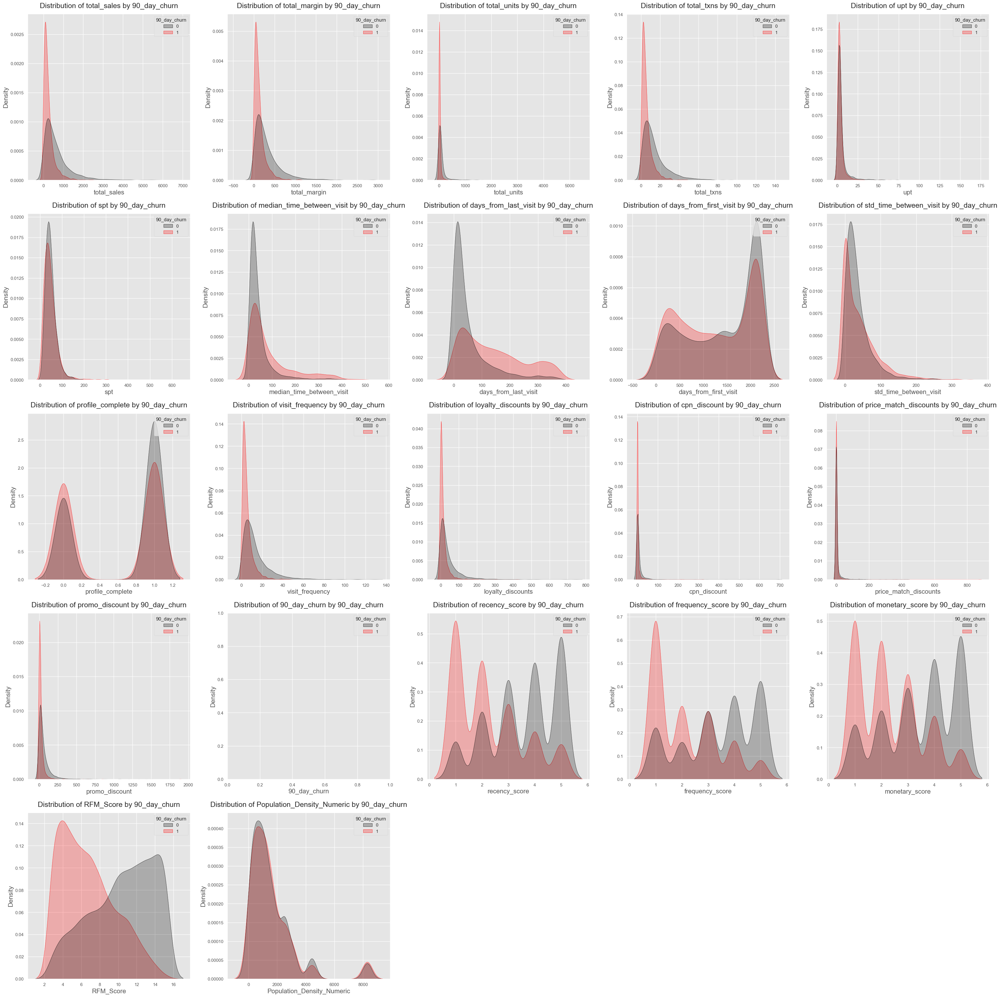

In [2101]:
# Create a grid for the plots with 4 rows and 7 columns
fig, axes = plt.subplots(5, 5, figsize=(36, 36))
fig.tight_layout(pad=8.0, h_pad=6.0, w_pad=6.0)
axes = axes.flatten()

# Plot the distribution for numerical features, split by 90_day_churn label
for i, col in enumerate(num_col_train):
    if pd.api.types.is_numeric_dtype(df_train[col]):
        sns.kdeplot(
            data=df_train, 
            x=col, 
            hue='90_day_churn', 
            fill=True, 
            common_norm=False, 
            palette=['black', 'red'], 
            ax=axes[i]
        )
        axes[i].set_title(f'Distribution of {col} by 90_day_churn', fontsize=18, pad=15)
        axes[i].set_ylabel('Density', fontsize=16)
        axes[i].set_xlabel(col, fontsize=16)
    else:
        # If the column is categorical, skip the plot or handle differently
        axes[i].text(0.5, 0.5, f"{col} is categorical", ha='center', va='center', fontsize=14)
        axes[i].set_axis_off()

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.show()

<p style="color:black; font-weight:bold; font-size:20px;">Insights</p>

**1.Transactional Data:**

    Total sales, profit, unit numbers, and transaction counts are strongly correlated with customer retention. High-value users demonstrate a higher loyalty to the brand and are less likely to churn.

**2.Interaction Frequency:**
    
    The frequency of interactions between users and the brand is a crucial factor affecting retention. Users who engage more frequently are more likely to continue using the brand's services or products.

**3.Customer Engagement:**

    A complete user profile and a high RFM (Recency, Frequency, Monetary) score are good indicators of customer retention. These elements suggest that engaged users with up-to-date interactions and frequent purchases are more committed to the brand.

**4.FRFM (Recency, Frequency, Monetary) score**

    rom the distribution of RFM (Recency, Frequency, Monetary) scores, there is a general rule that the frequency score of non-churn users is generally higher than that of churn users. The distribution peak of non-churn users is in the middle and high sub-region, while the distribution peak of churn users is in the lower sub-region.

<p style="color:black; font-weight:bold; font-size:20px;">Based on above charts, the variables upt, price_match_discounts, and Population_Density_Numeric have distributions of 0s and 1s that are highly overlapping. This indicates that they are likely not very useful for predicting the target variable. Therefore, I have decided to drop these three variables.</p>

In [2102]:
df_train.drop(['upt', 'price_match_discounts','Population_Density_Numeric'], axis = 1, inplace = True)

In [2103]:
#update the colums
cat_col_train = [col for col in df_train.columns if df_train[col].dtype == 'object']
num_col_train = [col for col in df_train.columns if col not in cat_col_train]
print('cat_col_train : {} \n\
num_col_train : {}'.format(len(cat_col_train), len(num_col_train)))
cat_col_train : 8 
num_col_train : 22

cat_col_train : 8 
num_col_train : 19


<p style="color:black; font-weight:bold; font-size:20px;">We continue to observe their correlation using Pearson and VIF</p>


<h2 style="color:blue">Multivariate Analysis</h2>

### Pearson correlation and VIF analysis of numerical columns

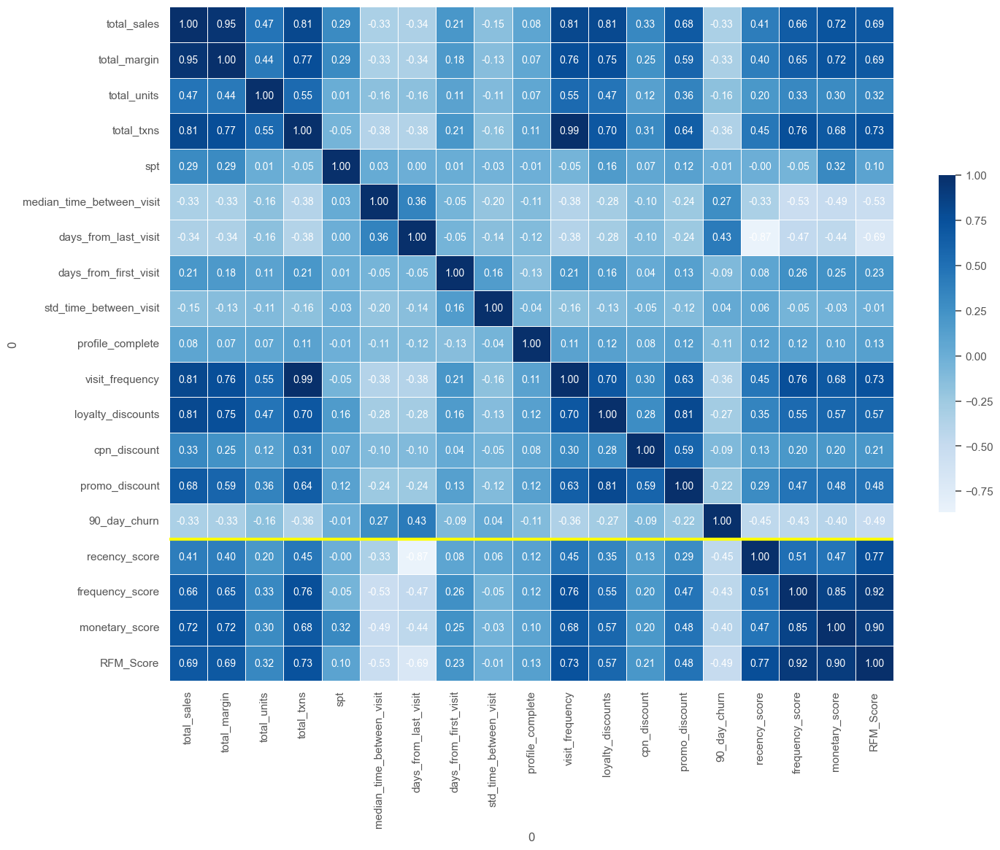

In [2110]:
# Calculate the correlation matrix
corr = df_train[num_col_train].corr()

# Create a mask to hide correlations below a certain threshold
mask = np.abs(corr) < 0.0

# Create a heatmap
fig, ax = plt.subplots(figsize=(16, 12))
sns.heatmap(corr, mask=mask, cmap="Blues", center=0, annot=True, fmt=".2f", linewidths=.5,
            annot_kws={"size": 10, "color": "white"}, cbar_kws={"shrink": .5})

# Find the index for '90_day_churn' in the correlation matrix
churn_index = list(corr.index).index('90_day_churn')  # Correctly getting the index from the DataFrame

# Add a line below the row associated with '90_day_churn'
ax.hlines(churn_index + 1, *ax.get_xlim(), colors='yellow', linestyles='solid', linewidth=3)

plt.show()

<p style="color:black; font-weight:bold; font-size:20px;">Insight:</p>

    As can be seen from the figure: 'total_sales','total_margin','total_txns','days_from_last_visit','days_from_first_visit','std_time_between_visit','visit_frequency','loyalty_discounts','promo_discount', 'employee_discount', 'Recency_score', 'Frequency_score', 'Monetary_score', 'RFM_Score', 'profile_complete' have strong correlations with the target, indicating that they may be good predictors in linear model, but they still could be good predictor in other non-linear models. Additionally, some of them have strong multicollinearity, so we just keep them need to combine other methods for further screening.

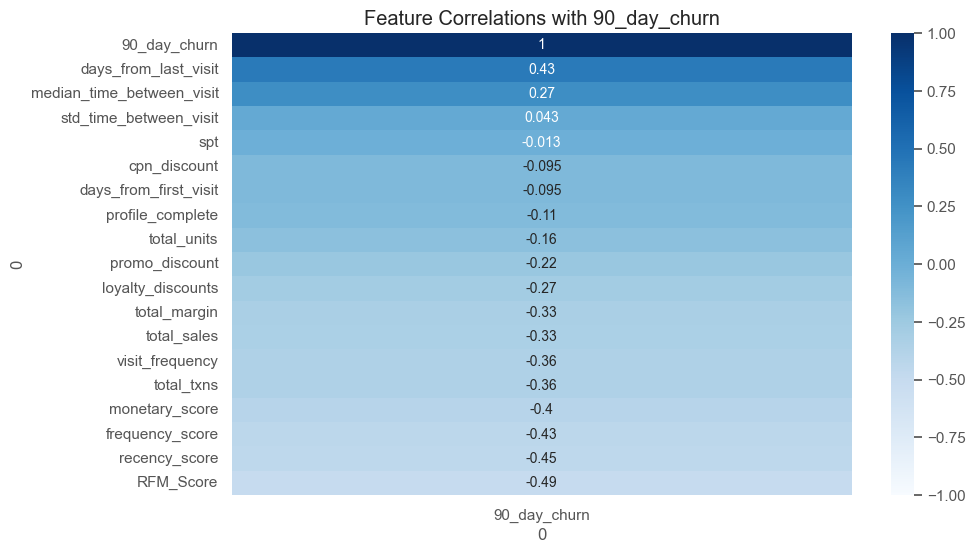

In [2111]:
import seaborn as sns
import matplotlib.pyplot as plt

# Ensure the target variable is numeric
df_train['90_day_churn'] = pd.to_numeric(df_train['90_day_churn'], errors='coerce')

# Filter the DataFrame to include only numeric columns
numeric_df_train = df_train.select_dtypes(exclude=[object])

# Calculate the correlation matrix for numeric columns
corr = numeric_df_train.corr()

# Extract the correlation of all features with the target variable
target_corr = corr[['90_day_churn']].sort_values(by='90_day_churn', ascending=False)

# Plot the heatmap for these correlations
plt.figure(figsize=(10, 6))
sns.heatmap(target_corr, annot=True, cmap='Blues', vmin=-1, vmax=1)
plt.title('Feature Correlations with 90_day_churn')
plt.show()

In [2112]:
# So, we need to maintain the following variables:

low_corr_cols = target_corr[abs(target_corr['90_day_churn']) < 0.1].index.tolist()
# print(low_corr_cols)
print(low_corr_cols)
# print("Columns to drop due to low correlation (<0.1) with target variable '90_day_churn':")


['std_time_between_visit', 'spt', 'cpn_discount', 'days_from_first_visit']


In [2113]:
df_train_high_corr = df_train.copy()
df_train_high_corr.drop(low_corr_cols, axis = 1, inplace = True)

In [2114]:
#update the colums
cat_col_train = [col for col in df_train.columns if df_train[col].dtype == 'object']
num_col_train = [col for col in df_train.columns if col not in cat_col_train]

cat_col_train_high = [col for col in df_train_high_corr.columns if df_train_high_corr[col].dtype == 'object']
num_col_train_high = [col for col in df_train_high_corr.columns if col not in cat_col_train_high]
print('cat_col_train : {} \n\
num_col_train : {}'.format(len(cat_col_train), len(num_col_train)))

print('cat_col_train_high : {} \n\
num_col_train_high : {}'.format(len(cat_col_train_high), len(num_col_train_high)))

cat_col_train : 8 
num_col_train : 19
cat_col_train_high : 8 
num_col_train_high : 15


**Let's calculate the VIF score and used VIF score to eliminate columns showing high multicollinearity.**
- **VIF starts at 1 and has no upper limit**
- **VIF = 1, no correlation between the independent variable and the other variables**
- **VIF exceeding 5 or 10 indicates high multicollinearity between this independent variable and the others**

In [2117]:
# Check missing values
df_train[num_col_train].isnull().sum().all() == 0

True

In [2118]:
num_col_train_temp = [col for col in num_col_train if col != '90_day_churn']

In [2119]:
num_col_train_temp

['total_sales',
 'total_margin',
 'total_units',
 'total_txns',
 'spt',
 'median_time_between_visit',
 'days_from_last_visit',
 'days_from_first_visit',
 'std_time_between_visit',
 'profile_complete',
 'visit_frequency',
 'loyalty_discounts',
 'cpn_discount',
 'promo_discount',
 'recency_score',
 'frequency_score',
 'monetary_score',
 'RFM_Score']

In [2120]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

df_num_train = df_train[num_col_train_temp]

# Calculate VIF for each numerical column
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(df_num_train.values, i) for i in range(df_num_train.shape[1])]
vif["Features"] = df_num_train.columns

vif = vif.sort_values(by='VIF Factor', ascending=False).reset_index(drop=True)

print(vif)

    VIF Factor                   Features
0          inf                  RFM_Score
1          inf             monetary_score
2          inf            frequency_score
3          inf              recency_score
4   184.010552                 total_txns
5   182.628660            visit_frequency
6    28.660179                total_sales
7    20.294599               total_margin
8     7.774251          loyalty_discounts
9     7.571569                        spt
10    6.539770             promo_discount
11    5.038778      days_from_first_visit
12    3.086908       days_from_last_visit
13    2.643010           profile_complete
14    2.367431  median_time_between_visit
15    2.018270     std_time_between_visit
16    2.014600               cpn_discount
17    1.684427                total_units


**There are many columns with VIF score over 10. Let's use a recursive function to eliminate column with highest VIF score each time till VIF scores for the rest column are all below 10**

In [2122]:
# Function to calculate VIF for each feature
def calculate_vif(df):
    vif = pd.DataFrame()
    vif["Features"] = df.columns
    vif["VIF Factor"] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    return vif


# List of features to be considered for removal
features_to_remove = ['recency_score', 'frequency_score', 'monetary_score', 'total_sales', 'total_txns', 'visit_frequency']

# Start with the full feature set
features = df_num_train.copy()

# Iterate through the list and remove features one by one
for feature in features_to_remove:
    # Calculate the VIFs
    vif_df = calculate_vif(features)
    
    # Check if all VIF values are <= 10
    if all(vif_df["VIF Factor"] <= 10):
        print("All VIF values are <= 10. Stopping...")
        break
    
    # Otherwise, remove the current feature
    print(f"Removing feature: {feature} and recalculating VIF...")
    features = features.drop(columns=[feature])
    
# Final VIF after all necessary removals
final_vif_df = calculate_vif(features)
print(final_vif_df)


Removing feature: recency_score and recalculating VIF...
Removing feature: frequency_score and recalculating VIF...
Removing feature: monetary_score and recalculating VIF...
Removing feature: total_sales and recalculating VIF...
Removing feature: total_txns and recalculating VIF...
Removing feature: visit_frequency and recalculating VIF...
                     Features  VIF Factor
0                total_margin    5.597385
1                 total_units    1.458656
2                         spt    3.585896
3   median_time_between_visit    1.949752
4        days_from_last_visit    2.153789
5       days_from_first_visit    4.950884
6      std_time_between_visit    1.904269
7            profile_complete    2.597302
8           loyalty_discounts    7.355018
9                cpn_discount    1.973178
10             promo_discount    6.235894
11                  RFM_Score    9.222207


In [2123]:
num_col_train_high = [col for col in num_col_train_high if col != '90_day_churn']

df_num_train_high = df_train[num_col_train_high]


# List of features to be considered for removal
features_to_remove = ['recency_score', 'frequency_score', 'monetary_score', 'total_sales', 'total_txns']

# Start with the full feature set
features = df_num_train_high.copy()

# Iterate through the list and remove features one by one
for feature in features_to_remove:
    # Calculate the VIFs
    vif_df = calculate_vif(features)
    
    # Check if all VIF values are <= 10
    if all(vif_df["VIF Factor"] <= 10):
        print("All VIF values are <= 10. Stopping...")
        break
    
    # Otherwise, remove the current feature
    print(f"Removing feature: {feature} and recalculating VIF...")
    features = features.drop(columns=[feature])
    
# Final VIF after all necessary removals
final_vif_df_high = calculate_vif(features)
print(final_vif_df_high)



Removing feature: recency_score and recalculating VIF...
Removing feature: frequency_score and recalculating VIF...
Removing feature: monetary_score and recalculating VIF...
Removing feature: total_sales and recalculating VIF...
Removing feature: total_txns and recalculating VIF...
                    Features  VIF Factor
0               total_margin    5.799366
1                total_units    1.666803
2  median_time_between_visit    1.808085
3       days_from_last_visit    1.804928
4           profile_complete    2.541800
5            visit_frequency    6.929749
6          loyalty_discounts    6.204236
7             promo_discount    3.819593
8                  RFM_Score    6.350300


In [2124]:
final_vif_num = final_vif_df['Features'].to_list()

In [2125]:
final_vif_num_high = final_vif_df_high['Features'].to_list()

In [2126]:
cols_new = final_vif_num + cat_col_train
cols_new_high = final_vif_num_high + cat_col_train

In [2127]:
cols_new.append('90_day_churn')
cols_new_high.append('90_day_churn')

In [2128]:
df_train = df_train[cols_new]
df_train_high_corr = df_train_high_corr[cols_new_high]

In [2129]:
df_train.head()

,total_margin,total_units,spt,median_time_between_visit,days_from_last_visit,days_from_first_visit,std_time_between_visit,profile_complete,loyalty_discounts,cpn_discount,promo_discount,RFM_Score,species_group,estimated_household_income_in_dollars,home_property_type,estimated_home_market_value_in_dollars,home_owner_or_renter,RFM_Loyalty_Level,KMeans_Loyalty_Level,Population_Density_Category,90_day_churn
6053,18.720,3,25.9700,369,369,1045,0.00,0,0.00,0.0,0.00,3,Dog,50000 to 74999,Single,"125,000 - 149,999",Home Owner,Low,Low,City and Surrounds,1
3740,254.718,26,36.3800,7,72,234,27.12,1,10.00,0.0,10.00,10,Dog,30000 to 39999,Single,"450,000 - 499,999",Home Owner,Medium,Medium,Very Rural areas,0
3082,52.975,8,33.8933,3,101,371,186.68,0,6.75,0.0,6.75,5,Dog,100000 to 124999,Single,"275,000 - 299,999",Renter,Low,Low,City and Surrounds,1
5709,840.003,471,45.7641,9,6,2171,14.87,1,114.53,5.5,121.53,15,Dog+Cat,100000 to 124999,Apartment,"200,000 - 224,999",Renter,High,High,Smaller Suburbs or Towns,0
1392,365.288,514,41.7396,15,4,2175,11.91,1,53.03,3.0,57.83,15,Dog+Cat,Greater than 124999,Single,"1,000,000 Plus",Home Owner,High,Medium,Downtown Metro,0


In [2130]:
df_train_high_corr.head()

,total_margin,total_units,median_time_between_visit,days_from_last_visit,profile_complete,visit_frequency,loyalty_discounts,promo_discount,RFM_Score,species_group,estimated_household_income_in_dollars,home_property_type,estimated_home_market_value_in_dollars,home_owner_or_renter,RFM_Loyalty_Level,KMeans_Loyalty_Level,Population_Density_Category,90_day_churn
6053,18.720,3,369,369,0,1,0.00,0.00,3,Dog,50000 to 74999,Single,"125,000 - 149,999",Home Owner,Low,Low,City and Surrounds,1
3740,254.718,26,7,72,1,9,10.00,10.00,10,Dog,30000 to 39999,Single,"450,000 - 499,999",Home Owner,Medium,Medium,Very Rural areas,0
3082,52.975,8,3,101,0,3,6.75,6.75,5,Dog,100000 to 124999,Single,"275,000 - 299,999",Renter,Low,Low,City and Surrounds,1
5709,840.003,471,9,6,1,38,114.53,121.53,15,Dog+Cat,100000 to 124999,Apartment,"200,000 - 224,999",Renter,High,High,Smaller Suburbs or Towns,0
1392,365.288,514,15,4,1,28,53.03,57.83,15,Dog+Cat,Greater than 124999,Single,"1,000,000 Plus",Home Owner,High,Medium,Downtown Metro,0


In [2131]:
#update the colums
cat_col_train = [col for col in df_train.columns if df_train[col].dtype == 'object']
num_col_train = [col for col in df_train.columns if col not in cat_col_train]

cat_col_train_high = [col for col in df_train_high_corr.columns if df_train_high_corr[col].dtype == 'object']
num_col_train_high = [col for col in df_train_high_corr.columns if col not in cat_col_train_high]
print('cat_col_train : {} \n\
num_col_train : {}'.format(len(cat_col_train), len(num_col_train)))

print('cat_col_train_high : {} \n\
num_col_train_high : {}'.format(len(cat_col_train_high), len(num_col_train_high)))

cat_col_train : 8 
num_col_train : 13
cat_col_train_high : 8 
num_col_train_high : 10


### Correlation  analysis Categorical columns

In [2132]:
from scipy import stats
import phik
from phik import resources, report

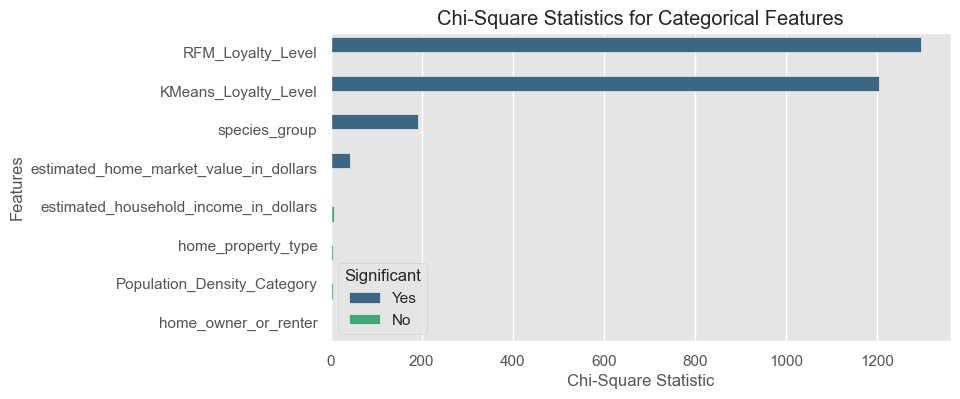

In [2134]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency

# Step 1: Identify categorical features (excluding the target variable)
categorical_features = [col for col in cat_col_train if col != '90_day_churn']

# Step 2: Perform Chi-Square test for each categorical feature
results = []

for feature in categorical_features:
    contingency_table = pd.crosstab(df_train[feature], df_train['90_day_churn'])
    chi2, p, dof, expected = chi2_contingency(contingency_table)

    results.append({
        'Feature': feature,
        'Chi2': chi2,
        'p-value': p,
        'Degrees of Freedom': dof,
        'Significant': 'Yes' if p < 0.05 else 'No'
    })

# Convert results to a DataFrame for easier viewing
results_df_train = pd.DataFrame(results)

# Sort by Chi2 statistic
results_df_train = results_df_train.sort_values(by='Chi2', ascending=False)

# Visualization Option 1: Bar Plot of Chi-Square Statistics
plt.figure(figsize=(8, 4))
sns.barplot(x='Chi2', y='Feature', hue='Significant', data=results_df_train, palette='viridis')
plt.title('Chi-Square Statistics for Categorical Features')
plt.xlabel('Chi-Square Statistic')
plt.ylabel('Features')
plt.show()


In [2135]:
import plotly.graph_objects as go

# Prepare data for heatmap: Create a pivot table with Features and p-values
heatmap_data = results_df_train.pivot(index="Feature", columns="Significant", values="p-value")

# Convert to numpy array for plotly heatmap
heatmap_values = heatmap_data.to_numpy()

# Visualization Option 2: Heatmap of p-values
fig = go.Figure(data=go.Heatmap(
    z=heatmap_values,
    x=heatmap_data.columns,
    y=heatmap_data.index,
    colorscale='RdBu',
    reversescale=True,
    colorbar=dict(title='p-value')
))

fig.update_layout(
    title='P-Values of Chi-Square Test for Categorical Features',
    xaxis_title='Significance',
    yaxis_title='Features'
)

fig.show()


In [2136]:
# Convert the ordinal variables to ordered categorical types
df_train['estimated_home_market_value_in_dollars'] = pd.Categorical(
    df_train['estimated_home_market_value_in_dollars'], 
    categories=[
        '1,000 - 24,999', '25,000 - 49,999', '50,000 - 74,999', '75,000 - 99,999', '100,000 - 124,999', 
        '125,000 - 149,999', '150,000 - 174,999', '175,000 - 199,999', '200,000 - 224,999', 
        '225,000 - 249,999', '250,000 - 274,999', '275,000 - 299,999', '300,000 - 349,999', 
        '350,000 - 399,999', '400,000 - 449,999', '450,000 - 499,999', '500,000 - 749,999', 
        '750,000 - 999,999', '1,000,000 Plus'
    ],
    ordered=True
)

df_train['estimated_household_income_in_dollars'] = pd.Categorical(
    df_train['estimated_household_income_in_dollars'], 
    categories=[
        'Less than 15000', '15000 to 19999', '20000 to 29999', '30000 to 39999', '40000 to 49999', 
        '50000 to 74999', '75000 to 99999', '100000 to 124999', 'Greater than 124999'
    ],
    ordered=True
)

df_train['RFM_Loyalty_Level'] = pd.Categorical(
    df_train['RFM_Loyalty_Level'], 
    categories=['Low', 'Medium', 'High'], 
    ordered=True
)

df_train['KMeans_Loyalty_Level'] = pd.Categorical(
    df_train['KMeans_Loyalty_Level'], 
    categories=['Low', 'Medium', 'High'], 
    ordered=True
)

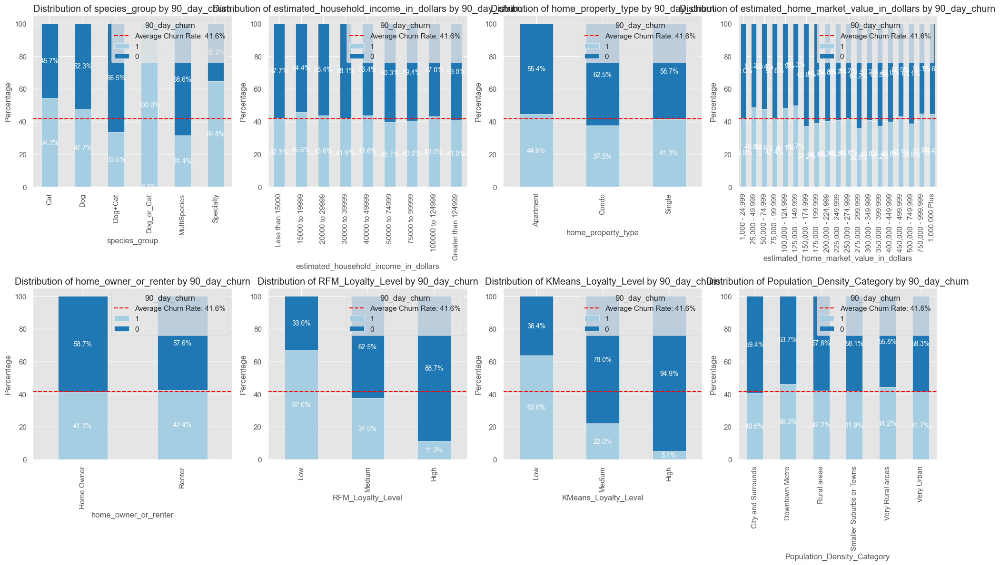

In [2137]:
# Create a grid with 4 rows and 2 columns
fig, axes = plt.subplots(2, 4, figsize=(20, 12))
axes = axes.flatten()

average_churn_rate = 41.65

# Plot the relationship between each categorical feature and 90_day_churn
for i, feature in enumerate(cat_col_train):
    # Calculate the normalized count for each category
    counts = df_train.groupby([feature, '90_day_churn']).size().unstack().fillna(0)
    
    # Reorder columns so that 1 is at the bottom and 0 is on top
    counts = counts[[1, 0]]
    
    # Calculate percentages
    counts_percent = counts.div(counts.sum(axis=1), axis=0) * 100
    
    # Plot the stacked bar chart
    counts_percent.plot(kind='bar', stacked=True, ax=axes[i], color=colors)
    
    # Add percentages on the bars
    for p in axes[i].patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy() 
        axes[i].text(x + width/2, y + height/2, f'{height:.1f}%', ha='center', va='center', color='white', fontsize=10)

    # Add the average churn rate line
    axes[i].axhline(y=average_churn_rate, color='red', linestyle='--', label=f'Average Churn Rate: {average_churn_rate:.1f}%')
    axes[i].legend(title='90_day_churn', loc='upper right')

    axes[i].set_title(f'Distribution of {feature} by 90_day_churn')
    axes[i].set_ylabel('Percentage')
    axes[i].set_xlabel(feature)
    axes[i].tick_params(axis='x', rotation=90)  # Rotate X-axis labels for better readability


    
# Adjust the layout to prevent overlap
plt.tight_layout()
plt.show()

<p style="color:black; font-weight:bold; font-size:20px;">The above correlation analysis of the categorical features with the target variable consistently indicates that the features estimated_household_income_in_dollars, home_property_type, estimated_home_market_value_in_dollars, and home_owner_or_renter have very limited predictive value for the target. Therefore, I plan to drop these features from the analysis.</p>

In [2138]:
df_train.drop(['estimated_household_income_in_dollars', 'home_property_type', 'Population_Density_Category','home_owner_or_renter'], axis=1, inplace=True)
df_train_high_corr.drop(['estimated_household_income_in_dollars', 'home_property_type', 'Population_Density_Category','home_owner_or_renter'], axis=1, inplace=True)

In [2139]:
# Convert categorical types to object types
df_train['estimated_home_market_value_in_dollars'] = df_train['estimated_home_market_value_in_dollars'].astype('object')
df_train['RFM_Loyalty_Level'] = df_train['RFM_Loyalty_Level'].astype('object')
df_train['KMeans_Loyalty_Level'] = df_train['KMeans_Loyalty_Level'].astype('object')

In [2140]:
#update the colums
cat_col_train = [col for col in df_train.columns if df_train[col].dtype == 'object']
num_col_train = [col for col in df_train.columns if col not in cat_col_train]

cat_col_train_high = [col for col in df_train_high_corr.columns if df_train_high_corr[col].dtype == 'object']
num_col_train_high = [col for col in df_train_high_corr.columns if col not in cat_col_train_high]
print('cat_col_train : {} \n\
num_col_train : {}'.format(len(cat_col_train), len(num_col_train)))

print('cat_col_train_high : {} \n\
num_col_train_high : {}'.format(len(cat_col_train_high), len(num_col_train_high)))

cat_col_train : 4 
num_col_train : 13
cat_col_train_high : 4 
num_col_train_high : 10


<p style="color:black; font-weight:bold; font-size:20px;">put all columns together, and observe using PHIK</p>

In [2141]:
col_phik = df_train.columns
col_phik_high = df_train_high_corr.columns

interval columns not set, guessing: ['total_margin', 'total_units', 'spt', 'median_time_between_visit', 'days_from_last_visit', 'days_from_first_visit', 'std_time_between_visit', 'profile_complete', 'loyalty_discounts', 'cpn_discount', 'promo_discount', 'RFM_Score', '90_day_churn']


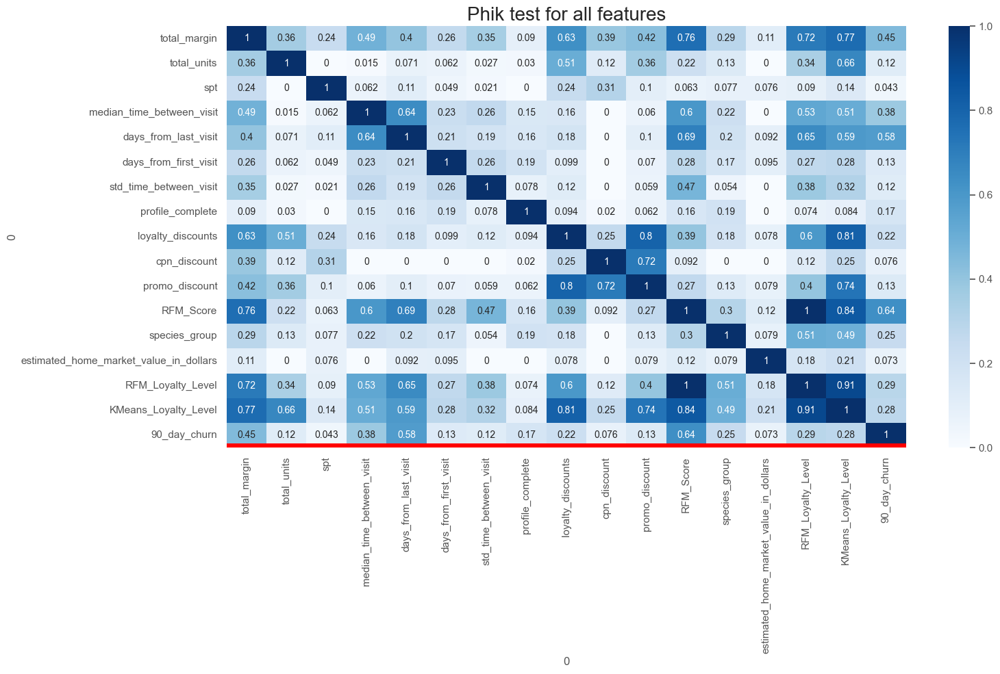

In [2142]:
import seaborn as sns
import matplotlib.pyplot as plt

highlight_row = '90_day_churn'

result = df_train[col_phik].phik_matrix()

row_index = result.index.get_loc(highlight_row)

fig = plt.figure(figsize=(16, 8))
ax = sns.heatmap(result, 
                 annot=True, 
                 cmap='Blues')

ax.axhline(y=row_index + 0.9, color='red', linewidth=5)

plt.title('Phik test for all features', fontsize=20)
plt.show()

interval columns not set, guessing: ['total_margin', 'total_units', 'median_time_between_visit', 'days_from_last_visit', 'profile_complete', 'visit_frequency', 'loyalty_discounts', 'promo_discount', 'RFM_Score', '90_day_churn']


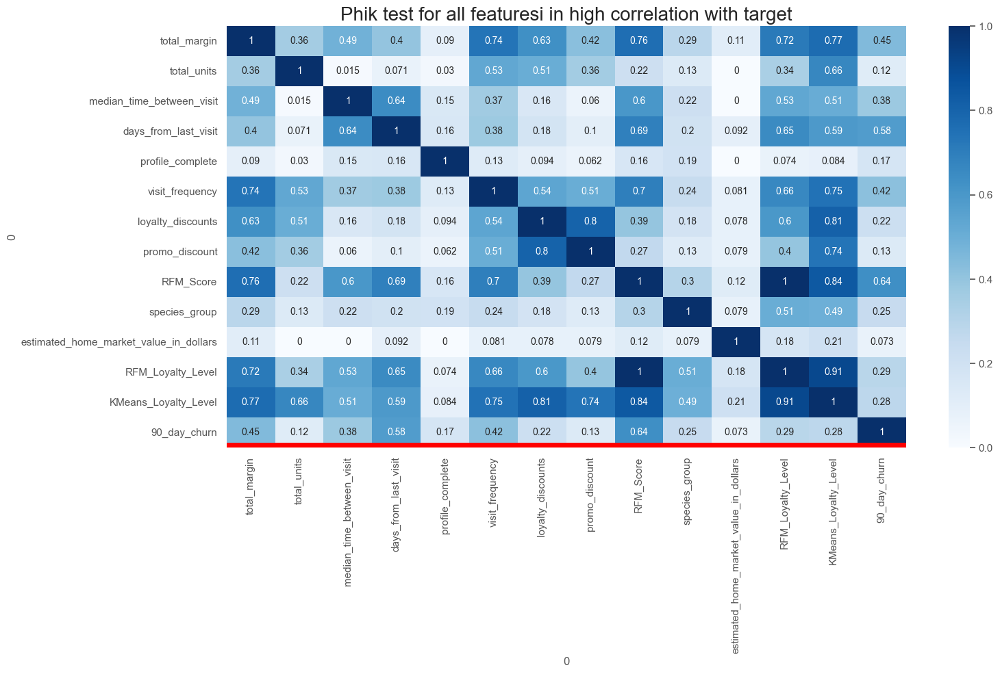

In [2143]:
result_high = df_train_high_corr[col_phik_high].phik_matrix()

row_index = result_high.index.get_loc(highlight_row)

fig = plt.figure(figsize=(16, 8))
ax = sns.heatmap(result_high, 
                 annot=True, 
                 cmap='Blues')

ax.axhline(y=row_index + 0.9, color='red', linewidth=5)

plt.title('Phik test for all featuresi in high correlation with target', fontsize=20)
plt.show()

### Feature selection using Recursive Feature Elimination with cross validation (RFECV)

**First，we need to transform the categorical features.**

In [2144]:
#update the colums
cat_col_train = [col for col in df_train.columns if df_train[col].dtype == 'object']
num_col_train = [col for col in df_train.columns if col not in cat_col_train]

cat_col_train_high = [col for col in df_train_high_corr.columns if df_train_high_corr[col].dtype == 'object']
num_col_train_high = [col for col in df_train_high_corr.columns if col not in cat_col_train_high]
print('cat_col_train : {} \n\
num_col_train : {}'.format(len(cat_col_train), len(num_col_train)))

print('cat_col_train_high : {} \n\
num_col_train_high : {}'.format(len(cat_col_train_high), len(num_col_train_high)))

cat_col_train : 4 
num_col_train : 13
cat_col_train_high : 4 
num_col_train_high : 10


In [2145]:
cat_col_train

['species_group',
 'estimated_home_market_value_in_dollars',
 'RFM_Loyalty_Level',
 'KMeans_Loyalty_Level']

In [2146]:
cat_col_train_high

['species_group',
 'estimated_home_market_value_in_dollars',
 'RFM_Loyalty_Level',
 'KMeans_Loyalty_Level']

In [2147]:
for col in df_train[cat_col_train].columns:
    print(f"{col}: ",df_train[col].unique())

species_group:  ['Dog' 'Dog+Cat' 'MultiSpecies' 'Specialty' 'Cat' 'Dog_or_Cat']
estimated_home_market_value_in_dollars:  ['125,000 - 149,999' '450,000 - 499,999' '275,000 - 299,999'
 '200,000 - 224,999' '1,000,000 Plus' '350,000 - 399,999'
 '150,000 - 174,999' '100,000 - 124,999' '250,000 - 274,999'
 '500,000 - 749,999' '300,000 - 349,999' '175,000 - 199,999'
 '25,000 - 49,999' '400,000 - 449,999' '750,000 - 999,999'
 '75,000 - 99,999' '1,000 - 24,999' '50,000 - 74,999' '225,000 - 249,999']
RFM_Loyalty_Level:  ['Low' 'Medium' 'High']
KMeans_Loyalty_Level:  ['Low' 'Medium' 'High']


<p style="color:black; font-weight:bold; font-size:20px;">Based on the categorical data values above, it appears that estimated_home_market_value_in_dollars, RFM_Loyalty_Level, and KMeans_Loyalty_Level exhibit some ordinal relationships. Therefore, I am considering using ordinal encoding to process these three features, while applying dummy encoding for the remaining species_group feature.</p>

In [2148]:
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder

In [2149]:
# 1. 'estimated_home_market_value_in_dollars'
market_value_order = ['1,000 - 24,999', '25,000 - 49,999', '50,000 - 74,999',
                      '75,000 - 99,999', '100,000 - 124,999','125,000 - 149,999', '150,000 - 174,999','175,000 - 199,999',
                      '200,000 - 224,999', '225,000 - 249,999', '250,000 - 274,999',
                      '275,000 - 299,999', '300,000 - 349,999', '350,000 - 399,999',
                      '400,000 - 449,999', '450,000 - 499,999', '500,000 - 749,999',
                      '750,000 - 999,999', '1,000,000 Plus']

# 2. 'RFM_Loyalty_Level'
loyalty_order = ['Low', 'Medium', 'High']

# 3. 'KMeans_Loyalty_Level'
kmeans_loyalty_order = ['Low', 'Medium', 'High']

# Create an OrdinalEncoder instance
encoder = OrdinalEncoder(categories=[market_value_order, loyalty_order, kmeans_loyalty_order])

# Specify the columns to encode
columns_to_encode = [
    'estimated_home_market_value_in_dollars',
    'RFM_Loyalty_Level',
    'KMeans_Loyalty_Level'
]

# Ensure the columns are treated as strings (important for the encoding to work properly)
for col in columns_to_encode:
    df_train[col] = df_train[col].astype(str)

# Apply the ordinal encoding to the specified columns
df_train[columns_to_encode] = encoder.fit_transform(df_train[columns_to_encode])

df_train_high_corr[columns_to_encode] = encoder.fit_transform(df_train_high_corr[columns_to_encode])


In [2150]:
df_train.head()

,total_margin,total_units,spt,median_time_between_visit,days_from_last_visit,days_from_first_visit,std_time_between_visit,profile_complete,loyalty_discounts,cpn_discount,promo_discount,RFM_Score,species_group,estimated_home_market_value_in_dollars,RFM_Loyalty_Level,KMeans_Loyalty_Level,90_day_churn
6053,18.720,3,25.9700,369,369,1045,0.00,0,0.00,0.0,0.00,3,Dog,5.0,0.0,0.0,1
3740,254.718,26,36.3800,7,72,234,27.12,1,10.00,0.0,10.00,10,Dog,15.0,1.0,1.0,0
3082,52.975,8,33.8933,3,101,371,186.68,0,6.75,0.0,6.75,5,Dog,11.0,0.0,0.0,1
5709,840.003,471,45.7641,9,6,2171,14.87,1,114.53,5.5,121.53,15,Dog+Cat,8.0,2.0,2.0,0
1392,365.288,514,41.7396,15,4,2175,11.91,1,53.03,3.0,57.83,15,Dog+Cat,18.0,2.0,1.0,0


In [2151]:
df_train_high_corr.head()

,total_margin,total_units,median_time_between_visit,days_from_last_visit,profile_complete,visit_frequency,loyalty_discounts,promo_discount,RFM_Score,species_group,estimated_home_market_value_in_dollars,RFM_Loyalty_Level,KMeans_Loyalty_Level,90_day_churn
6053,18.720,3,369,369,0,1,0.00,0.00,3,Dog,5.0,0.0,0.0,1
3740,254.718,26,7,72,1,9,10.00,10.00,10,Dog,15.0,1.0,1.0,0
3082,52.975,8,3,101,0,3,6.75,6.75,5,Dog,11.0,0.0,0.0,1
5709,840.003,471,9,6,1,38,114.53,121.53,15,Dog+Cat,8.0,2.0,2.0,0
1392,365.288,514,15,4,1,28,53.03,57.83,15,Dog+Cat,18.0,2.0,1.0,0


In [2152]:
df_train.isnull().sum().sum().all() == 0

True

In [2153]:
df_train_high_corr.isnull().sum().all() == 0

True

In [2154]:
df_train_dummy = pd.get_dummies(df_train, columns=['species_group'])
df_train_high_dummy = pd.get_dummies(df_train_high_corr, columns=['species_group'])

In [2155]:
df_train_dummy.head()

,total_margin,total_units,spt,median_time_between_visit,days_from_last_visit,days_from_first_visit,std_time_between_visit,profile_complete,loyalty_discounts,cpn_discount,promo_discount,RFM_Score,estimated_home_market_value_in_dollars,RFM_Loyalty_Level,KMeans_Loyalty_Level,90_day_churn,species_group_Cat,species_group_Dog,species_group_Dog+Cat,species_group_Dog_or_Cat,species_group_MultiSpecies,species_group_Specialty
6053,18.720,3,25.9700,369,369,1045,0.00,0,0.00,0.0,0.00,3,5.0,0.0,0.0,1,False,True,False,False,False,False
3740,254.718,26,36.3800,7,72,234,27.12,1,10.00,0.0,10.00,10,15.0,1.0,1.0,0,False,True,False,False,False,False
3082,52.975,8,33.8933,3,101,371,186.68,0,6.75,0.0,6.75,5,11.0,0.0,0.0,1,False,True,False,False,False,False
5709,840.003,471,45.7641,9,6,2171,14.87,1,114.53,5.5,121.53,15,8.0,2.0,2.0,0,False,False,True,False,False,False
1392,365.288,514,41.7396,15,4,2175,11.91,1,53.03,3.0,57.83,15,18.0,2.0,1.0,0,False,False,True,False,False,False


In [2156]:
df_train_high_dummy.head()

,total_margin,total_units,median_time_between_visit,days_from_last_visit,profile_complete,visit_frequency,loyalty_discounts,promo_discount,RFM_Score,estimated_home_market_value_in_dollars,RFM_Loyalty_Level,KMeans_Loyalty_Level,90_day_churn,species_group_Cat,species_group_Dog,species_group_Dog+Cat,species_group_Dog_or_Cat,species_group_MultiSpecies,species_group_Specialty
6053,18.720,3,369,369,0,1,0.00,0.00,3,5.0,0.0,0.0,1,False,True,False,False,False,False
3740,254.718,26,7,72,1,9,10.00,10.00,10,15.0,1.0,1.0,0,False,True,False,False,False,False
3082,52.975,8,3,101,0,3,6.75,6.75,5,11.0,0.0,0.0,1,False,True,False,False,False,False
5709,840.003,471,9,6,1,38,114.53,121.53,15,8.0,2.0,2.0,0,False,False,True,False,False,False
1392,365.288,514,15,4,1,28,53.03,57.83,15,18.0,2.0,1.0,0,False,False,True,False,False,False


In [2157]:
y = df_train_dummy['90_day_churn']
X = df_train_dummy.drop('90_day_churn', axis = 1)

y_high = df_train_high_dummy['90_day_churn']
X_high = df_train_high_dummy.drop('90_day_churn', axis = 1)

In [2158]:
# We need to normalize X first
from sklearn.preprocessing import StandardScaler
sd = StandardScaler()
X = pd.DataFrame(sd.fit_transform(X), 
                 columns=X.columns
                )
X_high = pd.DataFrame(sd.fit_transform(X_high), 
                 columns=X_high.columns
                )

**Use LogisticRegression as estimator to select best set of features for modeling**

In [2159]:
from sklearn.feature_selection import RFECV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

In [2160]:
import time
start = time.time()
lgcw = LogisticRegression(class_weight = 'balanced',
                          random_state = 2023
                         )

rfecv_cw = RFECV(estimator = lgcw,  step = 1, cv = 10)
rfecv_cw.fit(X, y)

end = time.time() 
print(f'This session took {(end - start) / 60} minutes.')

This session took 0.044981666405995685 minutes.


In [2161]:
print("Feature ranking: ", rfecv_cw.ranking_)

Feature ranking:  [1 1 1 1 1 1 1 1 3 7 2 1 6 1 1 5 4 9 1 8 1]


In [2162]:
start = time.time()

rfecv_cw_high = RFECV(estimator = lgcw,  step = 1, cv = 10)
rfecv_cw_high.fit(X_high, y_high)

end = time.time() 
print(f'This session took {(end - start) / 60} minutes.')

This session took 0.03810866673787435 minutes.


In [2163]:
print("Feature ranking: ", rfecv_cw_high.ranking_)

Feature ranking:  [ 3 13  8  1  4  1  9  7  1 12  6  2 14 10 15  5 16 11]


**List of selected features**

In [2164]:
mask_rfecw = rfecv_cw.get_support()
features = X.columns
best_features = features[mask_rfecw]
 
print("All features: ", X.shape[1])
print(features)

print("Selected best: ", best_features.shape[0])
print(features[mask_rfecw])

All features:  21
Index(['total_margin', 'total_units', 'spt', 'median_time_between_visit',
       'days_from_last_visit', 'days_from_first_visit',
       'std_time_between_visit', 'profile_complete', 'loyalty_discounts',
       'cpn_discount', 'promo_discount', 'RFM_Score',
       'estimated_home_market_value_in_dollars', 'RFM_Loyalty_Level',
       'KMeans_Loyalty_Level', 'species_group_Cat', 'species_group_Dog',
       'species_group_Dog+Cat', 'species_group_Dog_or_Cat',
       'species_group_MultiSpecies', 'species_group_Specialty'],
      dtype='object')
Selected best:  13
Index(['total_margin', 'total_units', 'spt', 'median_time_between_visit',
       'days_from_last_visit', 'days_from_first_visit',
       'std_time_between_visit', 'profile_complete', 'RFM_Score',
       'RFM_Loyalty_Level', 'KMeans_Loyalty_Level', 'species_group_Dog_or_Cat',
       'species_group_Specialty'],
      dtype='object')


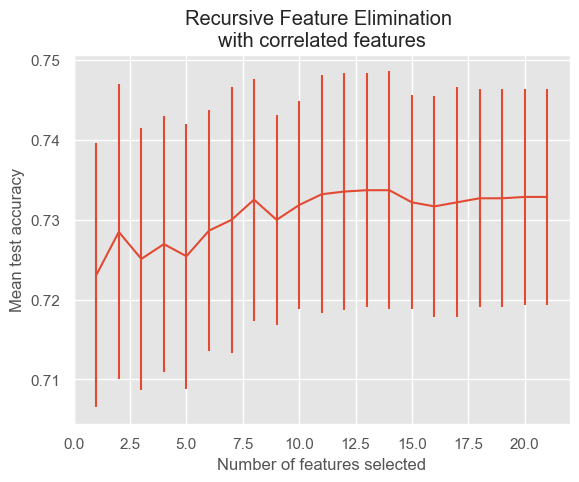

In [2165]:
# plot n_features and cross_validation score
n_scores = len(rfecv_cw.cv_results_["mean_test_score"])
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Mean test accuracy")

plt.errorbar(
    range(1, n_scores + 1),
    rfecv_cw.cv_results_["mean_test_score"],
    yerr = rfecv_cw.cv_results_["std_test_score"],
            )

plt.title("Recursive Feature Elimination \nwith correlated features")
plt.show()  

**Final list of numerical and categorical features selected for modeling**

<p style="color:black; font-weight:bold; font-size:20px;">Now we have four groups of features, one is the data containing almost all the features, the other is the features with low correlation with the target excluded, and the corresponding two groups of features screened by RFECV. I plan to model these four groups of features respectively and then compare their performance.</p>


In [2166]:
#update the colums
features_model = ['total_margin', 'total_units', 'spt', 'median_time_between_visit',
       'days_from_last_visit', 'days_from_first_visit',
       'std_time_between_visit', 'profile_complete', 'loyalty_discounts',
       'cpn_discount', 'promo_discount', 'RFM_Score',
       'estimated_home_market_value_in_dollars', 'RFM_Loyalty_Level',
       'KMeans_Loyalty_Level', 'species_group']

features_model_rfecv = ['total_margin', 'total_units', 'spt', 'median_time_between_visit',
       'days_from_last_visit', 'days_from_first_visit',
       'std_time_between_visit', 'profile_complete', 'RFM_Score',
       'RFM_Loyalty_Level', 'KMeans_Loyalty_Level', 'species_group']

features_model_high = ['total_margin', 'total_units', 'median_time_between_visit',
       'days_from_last_visit', 'profile_complete', 'visit_frequency',
       'loyalty_discounts', 'promo_discount', 'RFM_Score',
       'estimated_home_market_value_in_dollars', 'RFM_Loyalty_Level',
       'KMeans_Loyalty_Level', 'species_group']

# features_model_high_rfecv = ['total_txns', 'RFM_Score', 'days_from_last_visit']

## Summary of EDA

    In the EDA (Exploratory Data Analysis) section, we thoroughly examined the handling of missing values and discussed appropriate imputation methods to ensure data completeness and model effectiveness. For certain variables, we performed necessary transformations and derived new variables, such as the restructured Population_density variable, to enhance the analytical value of the data.

    I focused on analyzing the relationships between multiple variables, uncovering meaningful patterns. For example, we found significant associations between sales and profit with other key features such as pet composition, demographic information, and customer income. Specifically:

    Relationship Between Pet Composition and Sales/Profit:

    I observed that different pet compositions have varying impacts on sales and profit. For instance, households with multiple pets (e.g., multi-species or both cats and dogs) tend to exhibit higher sales and profits. This suggests that these customers may have higher spending power and loyalty.
    Relationship Between Demographic Information and Sales/Profit:

    Population density and regional segmentation also significantly influence sales and profit. We noticed that in certain high-density urban areas, customer purchasing behavior is more active, leading to higher sales and profits. Additionally, customers from specific regions may display higher purchase frequency and amounts due to factors such as geographic location and lifestyle.
    Relationship Between Customer Income and Sales/Profit:

    Analyzing customer income data revealed that higher-income customer groups tend to contribute more to sales and profit. These high-income customers not only have a higher purchase frequency but also spend more per transaction, indicating a higher Customer Lifetime Value (CLV).
    Moreover, we examined the relationships between these variables and the Target (customer churn) to identify factors that might influence customer churn. By analyzing the distribution of variables in relation to churn rates, we identified potential risk factors for churn. For example:

    Recency (the time since the customer’s last visit) strongly influences churn rates, with customers who have not visited recently being more likely to churn.
    Variables such as pet composition and customer income also show some correlation with churn, where certain pet types or income levels are associated with higher churn rates in specific scenarios.
    Through these analyses, we not only gained a better understanding of the relationships between variables but also uncovered potential links between these features and customer churn. This provides strong support for subsequent model building and optimization, and helps in formulating more targeted customer management and marketing strategies.
    
    I also selected the proper features for the final modeling step.

<h1 style="background-color:#16DCC9;font-family:monospace;font-size:250%;text-align:center">Churn Prediction Modelling</h1>

In [2305]:
# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd
from sklearn.model_selection import KFold,RandomizedSearchCV, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier,RandomForestClassifier
import xgboost as xgb
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
import warnings
warnings.filterwarnings('ignore')

# libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as mno
%matplotlib inline
plt.style.use('ggplot')

# to visualize all the columns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


In [2306]:
# Metrics
from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, roc_curve, roc_auc_score
from sklearn.metrics import auc, roc_curve, f1_score, accuracy_score, recall_score, precision_score

## A function for model evaluation

In [2307]:
# A function for model evaluation
def report_loss_cf(name, model, X_train, y_train, X_test, y_test, graph = 0):
    
    print('Model performance for: ', name)
    
    def calculate_loss(model, X, y):
        pred = model.predict(X)
        pred_proba = model.predict_proba(X)

        accuracy = accuracy_score(y, pred)
        precision = precision_score(y, pred)
        recall = recall_score(y, pred)
        f1 = f1_score(y, pred)
        auc = roc_auc_score(y, pred_proba[:,1])
        fpr, tpr, _ = roc_curve(y, pred_proba[:,1])
        return pred, accuracy, precision, recall, f1, auc, fpr, tpr
    
    y_train_pred, accuracy_train, precision_train, recall_train, f1_train, auc_train, fpr_train, tpr_train = calculate_loss(
        model, X_train, y_train)
    print(f'train set accuracy: {accuracy_train:.3f}')
    print(f'train set precision: {precision_train:.3f}')
    print(f'train set recall: {recall_train:.3f}')
    print(f'train set f1 score: {f1_train:.3f}')
    print(f'training set AUC score: {auc_train:.3f}')
    print()
    
    y_test_pred, accuracy_test, precision_test, recall_test, f1_test, auc_test, fpr_test, tpr_test = calculate_loss(
        model, X_test, y_test)
    print(f'test set accuracy: {accuracy_test:.3f}')
    print(f'test set precision: {precision_test:.3f}')
    print(f'test set recall: {recall_test:.3f}')
    print(f'test set f1 score: {f1_test:.3f}')
    print(f'test set AUC score: {auc_test:.3f}')

    if graph == 0:
        return 

    elif graph == 1:
        
        fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (7, 3))
        cm_train = confusion_matrix(y_train, y_train_pred)
        cm_test = confusion_matrix(y_test, y_test_pred)
        
        sns.heatmap(cm_train, annot = True, cmap = "Blues", fmt = 'g', ax = ax1)
        ax1.set_title('train set')
        ax1.set_xlabel('Predicted labl')
        ax1.set_ylabel('True label')
        ax1.xaxis.set_ticklabels(['0', '1'])
        ax1.yaxis.set_ticklabels(['0', '1'])
        
        sns.heatmap(cm_test, annot = True, cmap = "Blues", fmt = 'g', ax = ax2)
        ax2.set_title('test set')
        ax2.set_xlabel('Predicted labl')
        ax2.set_ylabel('True label')
        ax2.xaxis.set_ticklabels(['0', '1'])
        ax2.yaxis.set_ticklabels(['0', '1'])
        plt.tight_layout()
        plt.show()
        
    #elif graph == 2:   
        
        plt.figure(figsize = (5,4))
        plt.plot([0,1], [0,1], linestyle = '--', label = 'random')
        plt.plot(fpr_train, tpr_train,label = "Train_AUC=" + str(auc_train.round(3)))
        plt.plot(fpr_test,tpr_test,label = "Test_AUC=" + str(auc_test.round(3)))
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.legend(loc = 4)
        plt.tight_layout()
        plt.show()

## Pipeline for Data Processing

In [2308]:
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder 

In [2309]:
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder

file_path = 'Data Scientist Work Sample Exercise (Data).xlsx'
df = pd.read_excel(file_path)

df.columns = df.iloc[0]
df = df[1:]
df = df.reset_index(drop=True)
df.drop('90_day_sales', axis = 1, inplace = True)

exclude_cols = ['species_group', 'population_density', 'home_property_type', 'home_owner_or_renter', 'estimated_household_income_in_dollars','estimated_home_market_value_in_dollars']

# Convert all other columns to numeric types
for col in df.columns:
    if col not in exclude_cols:
        df[col] = pd.to_numeric(df[col], errors='coerce')


In [2310]:
df.head()

,total_sales,total_margin,total_units,total_txns,upt,spt,median_time_between_visit,days_from_last_visit,days_from_first_visit,std_time_between_visit,has_loyalty,profile_complete,species_group,visit_frequency,estimated_household_income_in_dollars,population_density,home_property_type,estimated_home_market_value_in_dollars,home_owner_or_renter,loyalty_discounts,cpn_discount,price_match_discounts,promo_discount,employee_discount,90_day_churn
0,356.74,174.832,59,11,5.3636,32.4309,69,2,829,73.40,1,0,MultiSpecies,8,50000 to 74999,Rural areas - HHs/sq mile 30 - 109,Apartment,"350,000 - 399,999",Home Owner,28.81,0.00,0.0,28.81,0.0,0
1,964.08,423.641,383,51,7.5098,18.9035,4,3,2190,26.30,1,0,Dog+Cat,47,Greater than 124999,"City and Surrounds - HHs/sq mile 935 - 1,327",Single,"150,000 - 174,999",Home Owner,24.55,11.05,0.0,37.64,0.0,0
2,311.67,202.542,21,7,3.0000,44.5243,8,128,452,110.81,1,1,Dog,7,Greater than 124999,"City and Surrounds - HHs/sq mile 3,159 - 4,430",Apartment,"125,000 - 149,999",Renter,7.12,0.00,0.0,7.12,0.0,1
3,50.45,25.973,5,1,5.0000,50.4500,251,251,251,0.00,1,1,Dog,1,40000 to 49999,Smaller Suburbs or Towns - HHs/sq mile 301 - 591,Single,"225,000 - 249,999",Home Owner,4.50,0.00,0.0,4.50,0.0,1
4,255.74,105.050,12,6,2.0000,42.6233,63,234,2122,4.04,1,0,Dog,6,75000 to 99999,Smaller Suburbs or Towns - HHs/sq mile 301 - 591,Condo,"125,000 - 149,999",Home Owner,5.00,20.00,0.0,35.76,0.0,1


In [2311]:
# First, split the dataset
from sklearn.model_selection import train_test_split

Target = '90_day_churn'
y = df[Target]
X = df[[col for col in df.columns if col != Target]]

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2, 
                                                    stratify=y, 
                                                    random_state=42)

In [2312]:
X_train.columns

Index(['total_sales', 'total_margin', 'total_units', 'total_txns', 'upt',
       'spt', 'median_time_between_visit', 'days_from_last_visit',
       'days_from_first_visit', 'std_time_between_visit', 'has_loyalty',
       'profile_complete', 'species_group', 'visit_frequency',
       'estimated_household_income_in_dollars', 'population_density',
       'home_property_type', 'estimated_home_market_value_in_dollars',
       'home_owner_or_renter', 'loyalty_discounts', 'cpn_discount',
       'price_match_discounts', 'promo_discount', 'employee_discount'],
      dtype='object', name=0)

<p style="color:black; font-weight:bold; font-size:20px;">Using the RFM (Recency, Frequency, Monetary) method and K-means clustering on the training data, new features such as 'RFM_Score', 'RFM_Loyalty_Level', and 'KMeans_Loyalty_Level' were created. These trained models were then applied to the test data to generate the corresponding features, ensuring consistency in feature structure across both the training and test datasets for accurate prediction, while also preventing data leakage.</p>

In [2313]:
# Generate RFM scores
from sklearn.cluster import KMeans

X_train['recency_score'] = pd.qcut(X_train['days_from_last_visit'], 5, labels=[5, 4, 3, 2, 1])
X_train['frequency_score'] = pd.qcut(X_train['total_txns'], 5, labels=[1, 2, 3, 4, 5])
X_train['monetary_score'] = pd.qcut(X_train['total_sales'], 5, labels=[1, 2, 3, 4, 5])
X_train['RFM_Score'] = X_train[['recency_score', 'frequency_score', 'monetary_score']].sum(axis=1).astype(int)

# Use KMeans to cluster RFM_Score
kmeans_rfm = KMeans(n_clusters=3, random_state=42)
X_train['RFM_cluster'] = kmeans_rfm.fit_predict(X_train[['RFM_Score']])

# Label clusters as High, Medium, Low based on RFM_cluster median RFM_Score
cluster_medians = X_train.groupby('RFM_cluster')['RFM_Score'].median().sort_values()
labels_mapping = {idx: label for idx, label in zip(cluster_medians.index, ["Low", "Medium", "High"])}
X_train['RFM_Loyalty_Level'] = X_train['RFM_cluster'].map(labels_mapping)

In [2314]:
# Generate RFM scores for the test set using the same divisions
X_test['recency_score'] = pd.qcut(X_test['days_from_last_visit'], 5, labels=[5, 4, 3, 2, 1], duplicates='drop')
X_test['frequency_score'] = pd.qcut(X_test['total_txns'], 5, labels=[1, 2, 3, 4, 5], duplicates='drop')
X_test['monetary_score'] = pd.qcut(X_test['total_sales'], 5, labels=[1, 2, 3, 4, 5], duplicates='drop')
X_test['RFM_Score'] = X_test[['recency_score', 'frequency_score', 'monetary_score']].sum(axis=1).astype(int)

# Predict using the KMeans model trained on the training set
X_test['RFM_cluster'] = kmeans_rfm.predict(X_test[['RFM_Score']])
X_test['RFM_Loyalty_Level'] = X_test['RFM_cluster'].map(labels_mapping)


In [2315]:
# Identify numeric variables
num_col_model = [col for col in X_train.columns if X_train[col].dtype in ['int64', 'float64']]

# Prepare numeric data
X_train_num = X_train[num_col_model]
X_test_num = X_test[num_col_model]


In [2316]:
# Use KMeans to cluster all numeric data in the training set
kmeans_final = KMeans(n_clusters=3, random_state=42)
X_train['Kmeans_cluster'] = kmeans_final.fit_predict(X_train_num)

# Apply the trained KMeans model to the numeric data of the test set
X_test['Kmeans_cluster'] = kmeans_final.predict(X_test_num)

# Calculate the median RFM_Score for each Kmeans_cluster and label them
final_cluster_medians = X_train.groupby('Kmeans_cluster')['RFM_Score'].median().sort_values()
final_labels_mapping = {idx: label for idx, label in zip(final_cluster_medians.index, ["Low", "Medium", "High"])}
X_train['KMeans_Loyalty_Level'] = X_train['Kmeans_cluster'].map(final_labels_mapping)
X_test['KMeans_Loyalty_Level'] = X_test['Kmeans_cluster'].map(final_labels_mapping)


In [2317]:
#RFM_cluster,RFM_cluster are highly correlated with RFM_Loyalty_Level, KMeans_Loyalty_Level,just drop them.
X_train.drop(['RFM_cluster', 'Kmeans_cluster'],axis = 1, inplace = True)
X_test.drop(['RFM_cluster', 'Kmeans_cluster'],axis = 1, inplace = True)

<p style="color:black; font-weight:bold; font-size:20px;">Next, the missing values in the estimated_home_market_value_in_dollars variable were handled by grouping the data by KMeans_Loyalty_Level. The median value for each category was calculated using the training set, and these medians were then used to fill the missing values in both the training and test sets.</p>

In [2318]:
# Calculate the mode for each KMeans_Loyalty_Level in the training set
modes = X_train.groupby('KMeans_Loyalty_Level')['estimated_home_market_value_in_dollars'].agg(lambda x: x.mode()[0] if not x.mode().empty else None)

# Define a function to fill missing values based on the KMeans_Loyalty_Level
def fill_missing_values(row, modes):
    if pd.isnull(row['estimated_home_market_value_in_dollars']):
        return modes[row['KMeans_Loyalty_Level']]
    else:
        return row['estimated_home_market_value_in_dollars']

# Apply the function to fill missing values in the training set
X_train['estimated_home_market_value_in_dollars'] = X_train.apply(
    lambda row: fill_missing_values(row, modes), axis=1)

# Apply the function to fill missing values in the test set
X_test['estimated_home_market_value_in_dollars'] = X_test.apply(
    lambda row: fill_missing_values(row, modes), axis=1)


In [2319]:
X_train.head()

,total_sales,total_margin,total_units,total_txns,upt,spt,median_time_between_visit,days_from_last_visit,days_from_first_visit,std_time_between_visit,has_loyalty,profile_complete,species_group,visit_frequency,estimated_household_income_in_dollars,population_density,home_property_type,estimated_home_market_value_in_dollars,home_owner_or_renter,loyalty_discounts,cpn_discount,price_match_discounts,promo_discount,employee_discount,recency_score,frequency_score,monetary_score,RFM_Score,RFM_Loyalty_Level,KMeans_Loyalty_Level
6053,25.97,18.720,3,1,3.0000,25.9700,369,369,1045,0.00,1,0,Dog,1,50000 to 74999,"City and Surrounds - HHs/sq mile 935 - 1,327",Single,"125,000 - 149,999",Home Owner,0.00,0.0,0.0,0.00,0.0,1,1,1,3,Low,Low
3740,363.80,254.718,26,10,2.6000,36.3800,7,72,234,27.12,1,1,Dog,9,30000 to 39999,Very Rural areas - HHs/sq mile less than 30,Single,"450,000 - 499,999",Home Owner,10.00,0.0,0.0,10.00,0.0,3,4,3,10,Medium,Low
3082,101.68,52.975,8,3,2.6667,33.8933,3,101,371,186.68,1,0,Dog,3,100000 to 124999,"City and Surrounds - HHs/sq mile 1,328 - 1,825",Single,"275,000 - 299,999",Renter,6.75,0.0,0.0,6.75,0.0,2,1,2,5,Low,Low
5709,1784.80,840.003,471,39,12.0769,45.7641,9,6,2171,14.87,1,1,Dog+Cat,38,100000 to 124999,Smaller Suburbs or Towns - HHs/sq mile 592 - 934,Apartment,"200,000 - 224,999",Renter,114.53,5.5,1.5,121.53,0.0,5,5,5,15,High,High
1392,1168.71,365.288,514,28,18.3571,41.7396,15,4,2175,11.91,1,1,Dog+Cat,28,Greater than 124999,"Downtown Metro - HHs/sq mile 4,431 - 8,300",Single,"1,000,000 Plus",Home Owner,53.03,3.0,0.0,57.83,0.0,5,5,5,15,High,Medium


In [2301]:
X_test.head()

,total_margin,total_units,spt,median_time_between_visit,days_from_last_visit,days_from_first_visit,std_time_between_visit,profile_complete,RFM_Score,RFM_Loyalty_Level,KMeans_Loyalty_Level,species_group
6528,134.060,9,57.7650,8,352,2036,70.15,0,6,Low,Medium,Dog
3424,301.605,41,91.2167,21,105,2163,104.69,1,9,Medium,Medium,Dog+Cat
5829,414.127,48,46.0324,14,26,2098,38.44,1,13,High,Medium,Dog
4979,156.858,14,55.1583,47,216,2163,16.94,1,7,Low,Medium,Dog
3719,63.941,7,87.4300,70,70,70,0.00,1,4,Low,Low,Specialty


In [2302]:
#double check missing values
print(X_train.isnull().sum().all() == 0)
print(X_test.isnull().sum().all() == 0)

True
True


In [2303]:
# prepare final features for modeing
features_model = ['total_margin', 'total_units', 'spt', 'median_time_between_visit',
       'days_from_last_visit', 'days_from_first_visit',
       'std_time_between_visit', 'profile_complete', 'loyalty_discounts',
       'cpn_discount', 'promo_discount', 'RFM_Score',
       'estimated_home_market_value_in_dollars', 'RFM_Loyalty_Level',
       'KMeans_Loyalty_Level', 'species_group']

features_model_rfecv = ['total_margin', 'total_units', 'spt', 'median_time_between_visit',
       'days_from_last_visit', 'days_from_first_visit',
       'std_time_between_visit', 'profile_complete', 'RFM_Score',
       'RFM_Loyalty_Level', 'KMeans_Loyalty_Level', 'species_group']

features_model_high = ['total_margin', 'total_units', 'median_time_between_visit',
       'days_from_last_visit', 'profile_complete', 'visit_frequency',
       'loyalty_discounts', 'promo_discount', 'RFM_Score',
       'estimated_home_market_value_in_dollars', 'RFM_Loyalty_Level',
       'KMeans_Loyalty_Level', 'species_group']

In [2304]:
X_train.columns

Index(['total_margin', 'total_units', 'spt', 'median_time_between_visit',
       'days_from_last_visit', 'days_from_first_visit',
       'std_time_between_visit', 'profile_complete', 'RFM_Score',
       'RFM_Loyalty_Level', 'KMeans_Loyalty_Level', 'species_group'],
      dtype='object', name=0)

In [2252]:
# prepare final features with for modeing

X_train_all = X_train[features_model]
X_test_all = X_test[features_model]

X_train_high = X_train[features_model_high]
X_test_high = X_test[features_model_high]

X_train_rfecv = X_train[features_model_rfecv]
X_test_rfecv = X_test[features_model_rfecv]

In [2253]:
cat_col_model_new = ['species_group',
 'estimated_home_market_value_in_dollars',
 'RFM_Loyalty_Level',
 'KMeans_Loyalty_Level']

In [2254]:
#create transfomers

from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OrdinalEncoder, OneHotEncoder
import time

# Define market value, loyalty, and kmeans loyalty order
market_value_order = [
    '1,000 - 24,999', '25,000 - 49,999', '50,000 - 74,999', '75,000 - 99,999', '100,000 - 124,999', 
    '125,000 - 149,999', '150,000 - 174,999', '175,000 - 199,999', '200,000 - 224,999', 
    '225,000 - 249,999', '250,000 - 274,999', '275,000 - 299,999', '300,000 - 349,999', 
    '350,000 - 399,999', '400,000 - 449,999', '450,000 - 499,999', '500,000 - 749,999', 
    '750,000 - 999,999', '1,000,000 Plus'
]
loyalty_order = ['Low', 'Medium', 'High']
kmeans_loyalty_order = ['Low', 'Medium', 'High']

ordinal_categories = [market_value_order, loyalty_order, kmeans_loyalty_order]
ordinal_categories_new = [loyalty_order, kmeans_loyalty_order]
# Define the column transformer
preprocessor_all = ColumnTransformer(
    transformers=[
        ('ord', OrdinalEncoder(categories=ordinal_categories), 
         ['estimated_home_market_value_in_dollars', 'RFM_Loyalty_Level', 'KMeans_Loyalty_Level']),
        ('onehot', OneHotEncoder(handle_unknown='ignore'), ['species_group']),
        ('num', StandardScaler(), [col for col in features_model if col not in cat_col_model_new])
    ]
)

preprocessor_high = ColumnTransformer(
    transformers=[
        ('ord', OrdinalEncoder(categories=ordinal_categories), 
         ['estimated_home_market_value_in_dollars', 'RFM_Loyalty_Level', 'KMeans_Loyalty_Level']),
        ('onehot', OneHotEncoder(handle_unknown='ignore'), ['species_group']),
        ('num', StandardScaler(), [col for col in features_model_high if col not in cat_col_model_new])
    ]
)

preprocessor_rfecv = ColumnTransformer(
    transformers=[
        ('ord', OrdinalEncoder(categories=ordinal_categories_new), 
         ['RFM_Loyalty_Level', 'KMeans_Loyalty_Level']),
        ('onehot', OneHotEncoder(handle_unknown='ignore'), ['species_group']),
        ('num', StandardScaler(), [col for col in features_model_rfecv if col not in cat_col_model_new])
    ]
)

<p style="color:black; font-weight:bold; font-size:20px;">Perform the modeling using Logistic Regression, Random Forest, XGBoost for each dataset (X_train_all, X_test_all, X_train_high, X_test_high, X_train_rfecv, X_test_rfecv)</p>

In [2255]:
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder, StandardScaler

In [2256]:
# Calculate the ratio of negative to positive samples
negative_count = (y_train == 0).sum()
positive_count = (y_train == 1).sum()

ratio_of_neg_to_pos = negative_count / positive_count

# Create pipelines for each model with 'all' features
pipeline_lr_all = ImbPipeline(steps=[
    ('preprocessor', preprocessor_all),
    ('classifier', LogisticRegression(max_iter=1000,class_weight='balanced',random_state=42))
])


step_rf_all = ImbPipeline([
    ("pre", preprocessor_all),
    ("Ensemble", RandomForestClassifier(class_weight='balanced', random_state=42))
])
# Define the parameter grid
params_rf = {
    'Ensemble__n_estimators': np.arange(20,110,10),
    'Ensemble__max_depth': np.arange(2,12,2),
    'Ensemble__min_samples_split': [2,4,6,8,10,20,40,60],
    'Ensemble__min_samples_leaf': [1,5,10,20],
    'Ensemble__max_features': ['sqrt', 'log2'],
}

# Create the RandomizedSearchCV object
pipeline_rf_all = RandomizedSearchCV(step_rf_all,
                               params_rf,
                               n_iter=100,
                               cv=5,
                               n_jobs=-1,
                               scoring='roc_auc')


step_xgb_all = ImbPipeline(steps=[
    ('preprocessor', preprocessor_all),
    ('classifier', XGBClassifier(scale_pos_weight=ratio_of_neg_to_pos, random_state=42))
])

params_xgb = {
              'classifier__n_estimators': [100, 200, 500],
                'classifier__max_depth': [3, 5, 7],
                'classifier__learning_rate': [0.01, 0.1, 0.2],
                'classifier__subsample': [0.6, 0.8, 1.0],
                'classifier__colsample_bytree': [0.6, 0.8, 1.0],
                'classifier__gamma': [0, 0.1, 0.2],
                'classifier__min_child_weight': [1, 5, 10]
}

# Create the RandomizedSearchCV object
pipeline_xgb_all = RandomizedSearchCV(step_xgb_all,
                               params_xgb,
                               n_iter=100,
                               cv=5,
                               n_jobs=-1,
                               scoring='roc_auc')

In [2257]:
# Fit the models on the 'all' feature set
model_lr_all = pipeline_lr_all.fit(X_train_all, y_train)

In [2258]:
model_rf_all = pipeline_rf_all.fit(X_train_all, y_train)

In [2259]:
model_xgb_all = pipeline_xgb_all.fit(X_train_all, y_train)

In [2260]:
# Create pipelines for each model with 'high' features

pipeline_lr_high = ImbPipeline(steps=[
    ('preprocessor', preprocessor_high),
    ('classifier', LogisticRegression(max_iter=1000,class_weight='balanced',random_state=42))
])


step_rf_high = ImbPipeline([
    ("pre", preprocessor_high),
    ("Ensemble", RandomForestClassifier(class_weight='balanced', random_state=42))
])

# Create the RandomizedSearchCV object
pipeline_rf_high = RandomizedSearchCV(step_rf_high,
                               params_rf,
                               n_iter=100,
                               cv=5,
                               n_jobs=-1,
                               scoring='roc_auc')


step_xgb_high = ImbPipeline(steps=[
    ('preprocessor', preprocessor_high),
    ('classifier', XGBClassifier(scale_pos_weight=ratio_of_neg_to_pos, random_state=42))
])
# Create the RandomizedSearchCV object
pipeline_xgb_high = RandomizedSearchCV(step_xgb_high,
                               params_xgb,
                               n_iter=100,
                               cv=5,
                               n_jobs=-1,
                               scoring='roc_auc')

In [2261]:
# Fit the models on the 'high' feature set
model_lr_high = pipeline_lr_high.fit(X_train_high, y_train)

In [2262]:
model_rf_high = pipeline_rf_high.fit(X_train_high, y_train)

In [2263]:
model_xgb_high = pipeline_xgb_high.fit(X_train_high, y_train)

In [2264]:
# Create pipelines for each model with 'rfecv' features
pipeline_lr_rfecv = ImbPipeline(steps=[
    ('preprocessor', preprocessor_rfecv),
    ('classifier', LogisticRegression(max_iter=1000,class_weight='balanced',random_state=42))
])


step_rf_rfecv = ImbPipeline([
    ("pre", preprocessor_rfecv),
    ("Ensemble", RandomForestClassifier(class_weight='balanced', random_state=42))
])

# Create the RandomizedSearchCV object
pipeline_rf_rfecv = RandomizedSearchCV(step_rf_rfecv,
                               params_rf,
                               n_iter=100,
                               cv=5,
                               n_jobs=-1,
                               scoring='roc_auc')


step_xgb_rfecv = ImbPipeline(steps=[
    ('preprocessor', preprocessor_rfecv),
    ('classifier', XGBClassifier(scale_pos_weight=ratio_of_neg_to_pos, random_state=42))
])
# Create the RandomizedSearchCV object
pipeline_xgb_rfecv = RandomizedSearchCV(step_xgb_rfecv,
                               params_xgb,
                               n_iter=100,
                               cv=5,
                               n_jobs=-1,
                               scoring='roc_auc')

In [2265]:
# Fit the models on the 'rfecv' feature set
model_lr_rfecv = pipeline_lr_rfecv.fit(X_train_rfecv, y_train)

In [2266]:
model_rf_rfecv = pipeline_rf_rfecv.fit(X_train_rfecv, y_train)

In [2267]:
model_xgb_rfecv = pipeline_xgb_rfecv.fit(X_train_rfecv, y_train)

In [2268]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import pandas as pd

# List of models and their names
models = [
    ('Logistic Regression (All Features)', model_lr_all),
    ('Random Forest (All Features)', model_rf_all),
    ('XGBoost (All Features)', model_xgb_all),
    ('Logistic Regression (High Features)', model_lr_high),
    ('Random Forest (High Features)', model_rf_high),
    ('XGBoost (High Features)', model_xgb_high),
    ('Logistic Regression (RFECV Features)', model_lr_rfecv),
    ('Random Forest (RFECV Features)', model_rf_rfecv),
    ('XGBoost (RFECV Features)', model_xgb_rfecv)
]

# Initialize a list to store the results
results = []

# Function to evaluate and store results for each model
def evaluate_model(model, X_train, y_train, X_test, y_test, model_name):
    # Training set predictions
    y_train_pred = model.predict(X_train)
    y_train_proba = model.predict_proba(X_train)[:, 1] if hasattr(model, "predict_proba") else None
    
    # Test set predictions
    y_test_pred = model.predict(X_test)
    y_test_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None
    
    # Calculate metrics for training set
    train_accuracy = accuracy_score(y_train, y_train_pred)
    train_precision = precision_score(y_train, y_train_pred)
    train_recall = recall_score(y_train, y_train_pred)
    train_f1 = f1_score(y_train, y_train_pred)
    train_auc = roc_auc_score(y_train, y_train_proba) if y_train_proba is not None else None
    
    # Calculate metrics for test set
    test_accuracy = accuracy_score(y_test, y_test_pred)
    test_precision = precision_score(y_test, y_test_pred)
    test_recall = recall_score(y_test, y_test_pred)
    test_f1 = f1_score(y_test, y_test_pred)
    test_auc = roc_auc_score(y_test, y_test_proba) if y_test_proba is not None else None
    
    # Append the results
    results.append({
        'Model': model_name,
        'Train Accuracy': train_accuracy,
        'Train Precision': train_precision,
        'Train Recall': train_recall,
        'Train F1 Score': train_f1,
        'Train AUC': train_auc,
        'Test Accuracy': test_accuracy,
        'Test Precision': test_precision,
        'Test Recall': test_recall,
        'Test F1 Score': test_f1,
        'Test AUC': test_auc
    })

for model_name, model in models:
    if 'all' in model_name.lower():
        X_train, X_test = X_train_all, X_test_all
    elif 'high' in model_name.lower():
        X_train, X_test = X_train_high, X_test_high
    else:
        X_train, X_test = X_train_rfecv, X_test_rfecv
    
    evaluate_model(model, X_train, y_train, X_test, y_test, model_name)

# Convert results to a DataFrame for better visualization
results_df = pd.DataFrame(results)
results_df = results_df.set_index('Model')


In [2269]:
# Display the DataFrame
results_df.sort_values(by='Test AUC', ascending=False)


,Train Accuracy,Train Precision,Train Recall,Train F1 Score,Train AUC,Test Accuracy,Test Precision,Test Recall,Test F1 Score,Test AUC
Model,,,,,,,,,,
XGBoost (RFECV Features),0.745019,0.662254,0.791160,0.720990,0.825234,0.740041,0.658038,0.782820,0.715026,0.815181
XGBoost (All Features),0.745525,0.661285,0.797242,0.722927,0.831824,0.737340,0.653639,0.786062,0.713760,0.814149
Random Forest (RFECV Features),0.744343,0.661465,0.790754,0.720355,0.828474,0.731938,0.649457,0.774716,0.706578,0.812277
Logistic Regression (All Features),0.736407,0.664965,0.739659,0.700326,0.805355,0.732613,0.660844,0.735818,0.696319,0.811873
Logistic Regression (RFECV Features),0.736069,0.664481,0.739659,0.700058,0.805269,0.731938,0.659884,0.735818,0.695785,0.811845
Random Forest (All Features),0.755657,0.675387,0.795620,0.730590,0.847452,0.735314,0.656904,0.763371,0.706147,0.811707
Random Forest (High Features),0.761229,0.681005,0.802514,0.736783,0.852680,0.734639,0.654696,0.768233,0.706935,0.809272
XGBoost (High Features),0.732016,0.645193,0.791971,0.711087,0.812732,0.726536,0.639108,0.789303,0.706309,0.808565
Logistic Regression (High Features),0.729483,0.658707,0.727088,0.691210,0.802510,0.729912,0.659794,0.726094,0.691358,0.807974


<p style="color:black; font-weight:bold; font-size:20px;">Insights:</p>

<p style="color:black; font-weight:bold; font-size:20px;">Based on the results, we observed that the performance differences across the various models—Logistic Regression, Random Forest, and XGBoost—were minimal. Given this, prioritizing simplicity and interpretability is a logical choice.</p>

**Why Choose Logistic Regression?**

**Comparable Performance:**

Despite the power of ensemble methods, Logistic Regression achieved similar results, making it unnecessary to opt for the more complex models.
Simplicity and Speed:

Logistic Regression is easier to implement, faster to train, and requires fewer computational resources. This simplicity is beneficial, especially when deploying the model or when computational resources are limited.
Interpretability:

Logistic Regression allows for straightforward interpretation of coefficients, directly showing the impact of each feature on the target variable. This transparency is crucial for communicating insights to non-technical stakeholders and for making decisions in contexts where interpretability is essential.

**Selecting the 'High' Feature Set:**

**Correlation with Target:**

The 'high' feature set was selected based on features that are strongly correlated with the target variable. This focus helps in building a model that is both effective and avoids overfitting by excluding irrelevant features.
Practicality:

These features are not only statistically significant but also practically relevant, ensuring the model’s applicability in real-world scenarios.

**Conclusion:**
Given the minimal performance difference and the advantages of simplicity, efficiency, and interpretability, the Logistic Regression model built on the highly correlated 'high' feature set (model_lr_high) is the best choice. This approach balances strong predictive power with practical deployment and ease of understanding, making it the most suitable solution for the task.

## Evaluate the perfoemance of selected model

### Plot the perfoemance of selected model:

Model performance for:  Logistic Regression
train set accuracy: 0.729
train set precision: 0.659
train set recall: 0.727
train set f1 score: 0.691
training set AUC score: 0.803

test set accuracy: 0.730
test set precision: 0.660
test set recall: 0.726
test set f1 score: 0.691
test set AUC score: 0.808


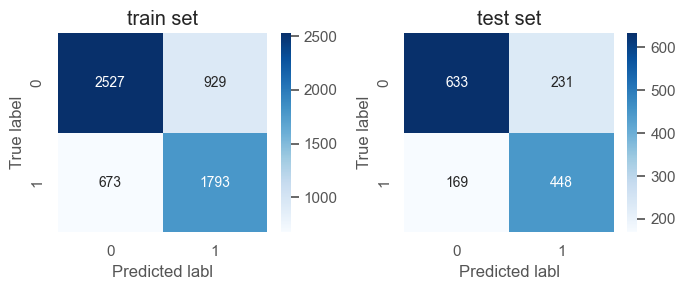

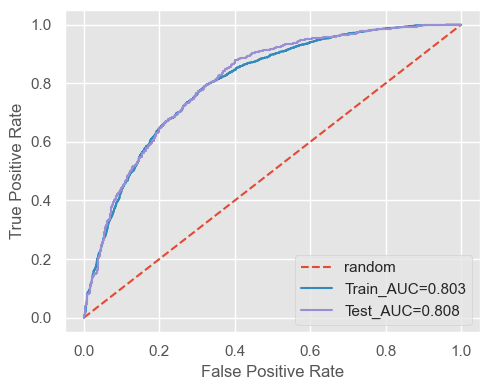

In [2270]:
report_loss_cf('Logistic Regression', model_lr_high, X_train_high, y_train, X_test_high, y_test, graph = 1)

<p style="color:black; font-weight:bold; font-size:20px;">The model's performance on both the train and test data is consistent, indicating that overfitting has been well-controlled and that the model exhibits strong generalization ability.</p>

### plot the feature importance from this logistic regression model**

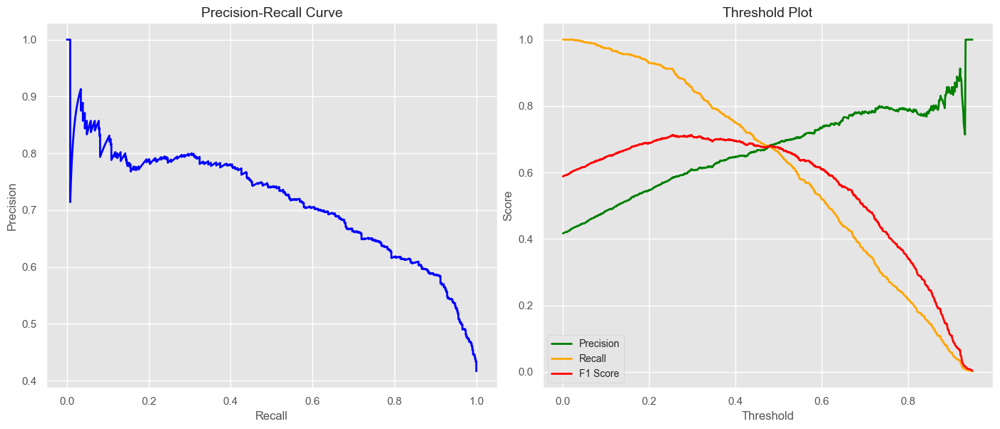

In [2323]:
from sklearn.metrics import precision_recall_curve

# Get predicted probabilities for the positive class
y_proba = model_lr_high.predict_proba(X_test_high)[:, 1]

# Compute precision and recall for different probability thresholds
precision, recall, thresholds = precision_recall_curve(y_test, y_proba)

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Plot precision-recall curve
ax1.plot(recall, precision, color='blue', linewidth=2)
ax1.set_xlabel('Recall', fontsize=12)
ax1.set_ylabel('Precision', fontsize=12)
ax1.set_title('Precision-Recall Curve', fontsize=14)
ax1.grid(True)

# Plot threshold plot
f1_score = 2 * (precision * recall) / (precision + recall)
ax2.plot(thresholds, precision[:-1], label='Precision', color='green', linewidth=2)
ax2.plot(thresholds, recall[:-1], label='Recall', color='orange', linewidth=2)
ax2.plot(thresholds, f1_score[:-1], label='F1 Score', color='red', linewidth=2)
ax2.set_xlabel('Threshold', fontsize=12)
ax2.set_ylabel('Score', fontsize=12)
ax2.set_title('Threshold Plot', fontsize=14)
ax2.legend(loc='best', fontsize=10)
ax2.grid(True)

# Adjust layout
plt.tight_layout()
plt.show()


<p style="color:black; font-weight:bold; font-size:20px;">Insights：</p>


    The Precision-Recall curve shows that when Recall is high, Precision tends to decrease significantly. This indicates that if we focus more on capturing as many potential churned customers as possible, we will likely sacrifice some Precision. The threshold plot suggests that the model can balance Precision and Recall by selecting an appropriate threshold. F1 Score can help identify an optimal threshold where Precision and Recall are balanced.

**Which Metric to Choose?**

    From the graph, it is observed that F1 Score peaks around a threshold of 0.4-0.5. This suggests that within this threshold range, the model achieves the best balance between Precision and Recall.

    In the context of PetStore’s churn prediction case, the choice of metric and threshold should be guided by business objectives. Here are some considerations:
    
    Impact of Customer Churn on the Business:

    Recall is more important: If the cost of losing a customer is very high, the company may prioritize identifying as many potential churned customers as possible, even if it means some false positives. In this scenario, Recall is more crucial because the company would prefer to spend more to retain as many customers as possible.
    Precision is more important: If the company has limited resources for customer retention (e.g., offering discounts or special offers), it is more effective to ensure these resources are primarily used on customers who are truly at risk of churning. In this case, Precision is more important, as the company wants to ensure that most of the customers identified as at risk are indeed likely to churn.
    
    Business Strategy:

    If the company leans towards actively retaining customers even at the cost of some false positives, then a higher Recall should be prioritized.
    If the company focuses on efficient resource utilization and the cost of false positives is high, then Precision should be prioritized.
    
    Recommended Strategies:

    Recommendation 1: High Recall (if churn costs are high): Use a lower threshold (e.g., 0.3-0.4) to capture more at-risk customers. While this may lead to some false positives (i.e., customers identified as at risk who actually wouldn’t churn), this approach ensures that the company retains as many potentially churning customers as possible.
    Recommendation 2: Balanced F1 Score: If the goal is to balance customer churn identification and resource efficiency, then choosing the threshold where F1 Score is highest (e.g., 0.4-0.5) might be most appropriate, as it strikes a balance between Precision and Recall.

**Optimal Choice:**

    Ultimately, the choice of metric and threshold should also consider the customer group’s CLV (Customer Lifetime Value) and ROI (Return on Investment). If the analysis shows that the cost of losing high CLV customers is very high (e.g., the company has invested significantly in acquiring and maintaining these customers, and they generate substantial long-term revenue), then a lower threshold should be used to maximize Recall, ensuring that all at-risk high CLV customers are identified and retained. Conversely, if the customers have low CLV, and their churn has minimal impact on the company’s overall revenue, a higher threshold can be chosen to increase Precision, reducing unnecessary retention efforts for low-value customers.

### Explain feature importance with SHAP

<p style="color:black; font-weight:bold; font-size:20px;">A function to explain the feature importance</p>

In [2272]:
import shap
import matplotlib.pyplot as plt

def plot_shap_values(model, X_train, X_test, preprocessor_name='preprocessor', classifier_name='classifier', plot_size=(8, 4), font_size=6):
    
    # Extract the trained classifier from the pipeline
    classifier_model = model.named_steps[classifier_name]
    
    # Extract the preprocessor from the pipeline and transform the data
    preprocessor = model.named_steps[preprocessor_name]
    X_train_transformed = preprocessor.transform(X_train)
    X_test_transformed = preprocessor.transform(X_test)
    
    # Use SHAP LinearExplainer for the classifier model
    explainer = shap.LinearExplainer(classifier_model, X_train_transformed)
    
    # Compute SHAP values for the test set
    shap_values = explainer.shap_values(X_test_transformed)
    
    # Get the correct feature names
    feature_names = preprocessor.get_feature_names_out(X_train.columns)
    
    # Update font size for plots
    plt.rcParams.update({'font.size': font_size})
    
    # SHAP summary plot with correct feature names
    shap.summary_plot(shap_values, X_test_transformed, feature_names=feature_names, plot_size=plot_size)
    
    # SHAP feature importance bar plot
    shap.summary_plot(shap_values, X_test_transformed, feature_names=feature_names, plot_type="bar", plot_size=plot_size)
    
    # Calculate mean absolute SHAP values as feature importance
    shap_importance = np.abs(shap_values).mean(axis=0)
    
    # Create a DataFrame for feature importance
    importance_df = pd.DataFrame({
        'feature': feature_names,
        'importance': shap_importance
    })
    
    # Sort the DataFrame by importance
    importance_df.sort_values(by='importance', ascending=False, inplace=True)
    
    # Return the DataFrame
    return importance_df

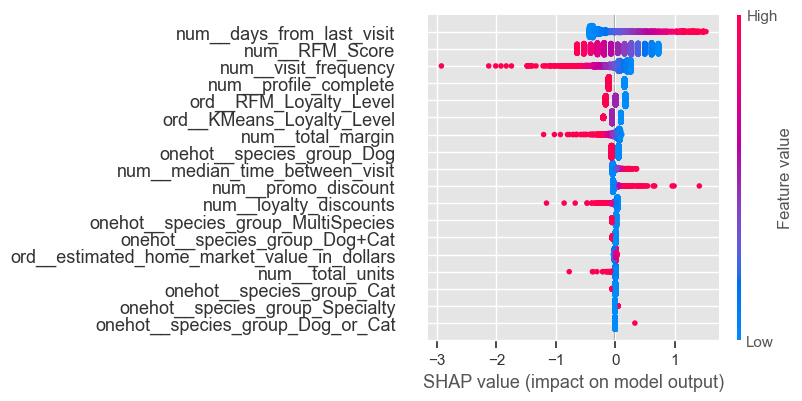

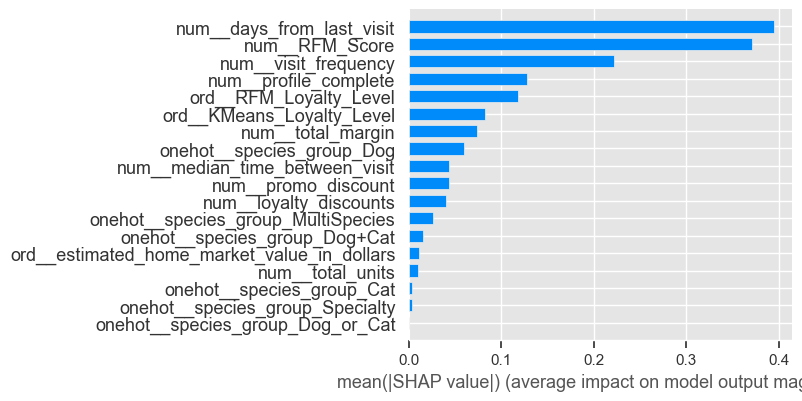

In [2273]:
importance_lr_high = plot_shap_values(model_lr_high, X_train_high, X_test_high, preprocessor_name='preprocessor', classifier_name='classifier')

<p style="color:black; font-weight:bold; font-size:20px;">Next, we will model each category based on the KMeans classification and compare the feature importance across different categories.</p>

In [2274]:
unique_levels = X_train_high['KMeans_Loyalty_Level'].unique()
print(unique_levels)

['Low' 'High' 'Medium']


In [2344]:
# Split the data into three groups based on KMeans_Loyalty_Level
X_train_low_group = X_train_high[X_train_high['KMeans_Loyalty_Level'] == 'Low']
y_train_low_group = y_train[X_train_high['KMeans_Loyalty_Level'] == 'Low']

X_train_medium_group = X_train_high[X_train_high['KMeans_Loyalty_Level'] == 'Medium']
y_train_medium_group = y_train[X_train_high['KMeans_Loyalty_Level'] == 'Medium']

X_train_high_group = X_train_high[X_train_high['KMeans_Loyalty_Level'] == 'High']
y_train_high_group = y_train[X_train_high['KMeans_Loyalty_Level'] == 'High']

X_test_low_group = X_test_high[X_test_high['KMeans_Loyalty_Level'] == 'Low']
y_test_low_group = y_test[X_test_high['KMeans_Loyalty_Level'] == 'Low']

X_test_medium_group = X_test_high[X_test_high['KMeans_Loyalty_Level'] == 'Medium']
y_test_medium_group = y_test[X_test_high['KMeans_Loyalty_Level'] == 'Medium']

X_test_high_group = X_test_high[X_test_high['KMeans_Loyalty_Level'] == 'High']
y_test_high_group = y_test[X_test_high['KMeans_Loyalty_Level'] == 'High']

In [2276]:
# Create the RandomizedSearchCV object
pipeline_lr_high = ImbPipeline(steps=[
    ('preprocessor', preprocessor_high),
    ('classifier', LogisticRegression(max_iter=1000,class_weight='balanced',random_state=42))
])

In [2277]:
model_group_high = pipeline_lr_high.fit(X_train_high_group,y_train_high_group)

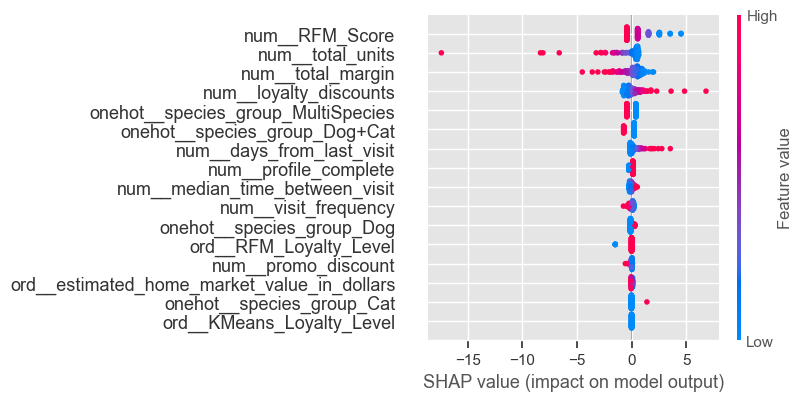

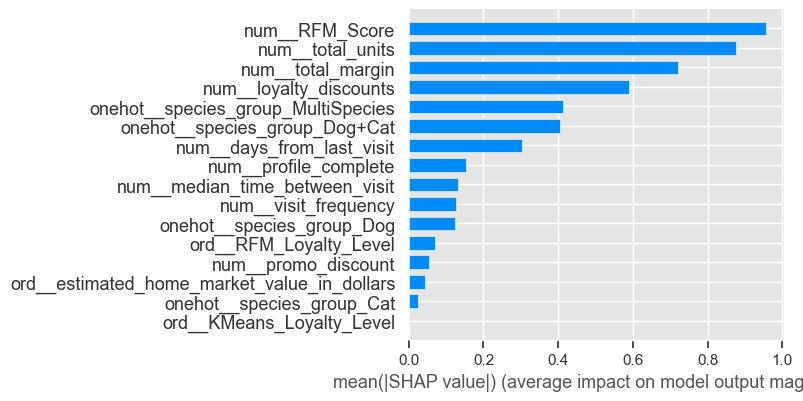

In [2278]:
importance_group_high = plot_shap_values(model_group_high, X_train_high_group, X_test_high_group, preprocessor_name='preprocessor', classifier_name='classifier')

In [2279]:
model_group_medium = pipeline_lr_high.fit(X_train_medium_group,y_train_medium_group)

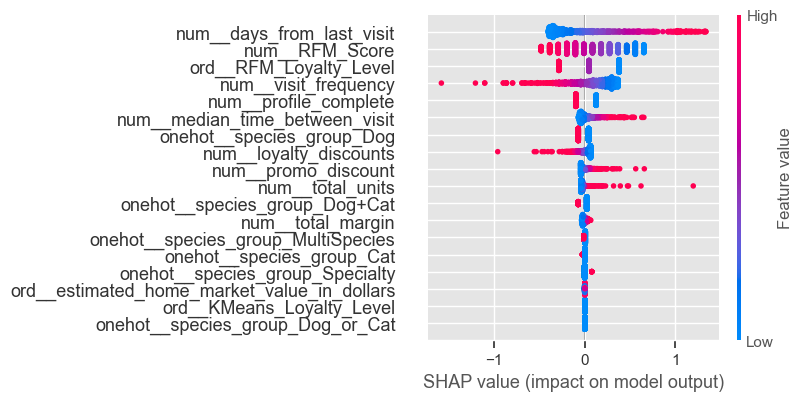

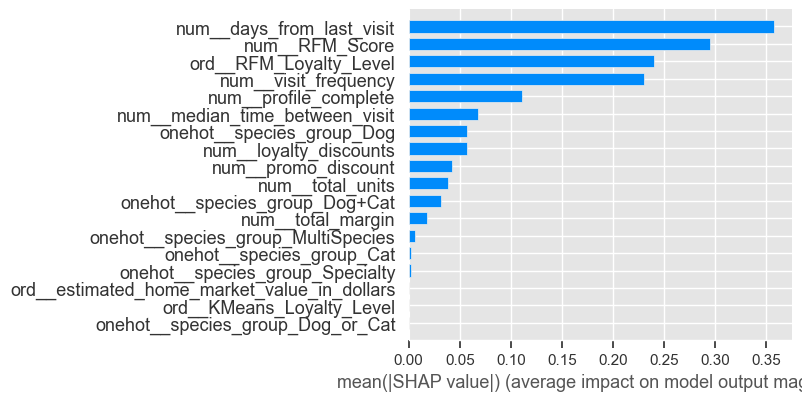

In [2280]:
importance_group_medium = plot_shap_values(model_group_medium , X_train_medium_group, X_test_medium_group, preprocessor_name='preprocessor', classifier_name='classifier')

In [2281]:
model_group_low = pipeline_lr_high.fit(X_train_low_group,y_train_low_group)

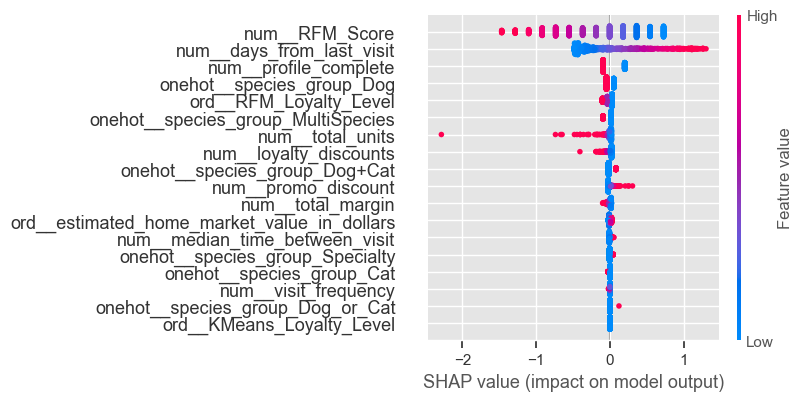

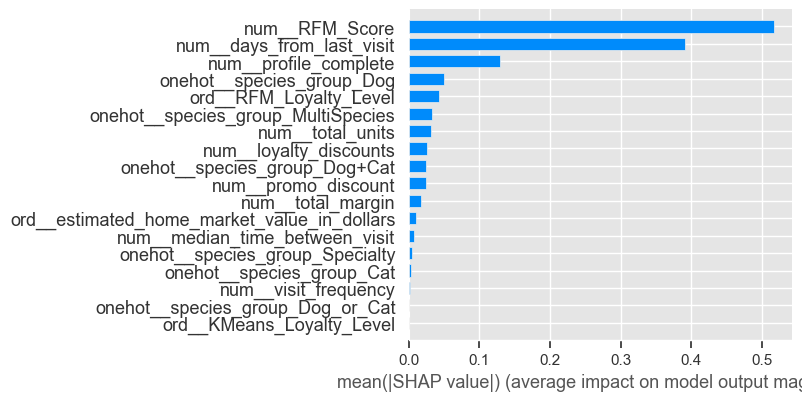

In [2282]:
importance_group_low = plot_shap_values(model_group_low , X_train_low_group, X_test_low_group, preprocessor_name='preprocessor', classifier_name='classifier')

In [2283]:
# Step 1: Sort each DataFrame by the 'importance' column in descending order
importance_lr_high = importance_lr_high.sort_values(by='importance', ascending=False).reset_index(drop=True)
importance_group_low = importance_group_low.sort_values(by='importance', ascending=False).reset_index(drop=True)
importance_group_medium = importance_group_medium.sort_values(by='importance', ascending=False).reset_index(drop=True)
importance_group_high = importance_group_high.sort_values(by='importance', ascending=False).reset_index(drop=True)

# Step 2: Rename the columns
importance_lr_high.columns = ['feature_lr_high', 'importance_lr_high']
importance_group_low.columns = ['feature_group_low', 'importance_group_low']
importance_group_medium.columns = ['feature_group_medium', 'importance_group_medium']
importance_group_high.columns = ['feature_group_high', 'importance_group_high']

# Step 3: Merge the DataFrames side by side
combined_importance = pd.concat([importance_lr_high, importance_group_low, importance_group_medium, importance_group_high], axis=1)

In [2284]:
# Display the result
combined_importance

,feature_lr_high,importance_lr_high,feature_group_low,importance_group_low,feature_group_medium,importance_group_medium,feature_group_high,importance_group_high
0,num__days_from_last_visit,0.394742,num__RFM_Score,0.516886,num__days_from_last_visit,0.357291,num__RFM_Score,0.956449
1,num__RFM_Score,0.370716,num__days_from_last_visit,0.390981,num__RFM_Score,0.295025,num__total_units,0.874798
2,num__visit_frequency,0.222315,num__profile_complete,0.129478,ord__RFM_Loyalty_Level,0.240237,num__total_margin,0.721792
3,num__profile_complete,0.128024,onehot__species_group_Dog,0.049831,num__visit_frequency,0.230609,num__loyalty_discounts,0.588265
4,ord__RFM_Loyalty_Level,0.118669,ord__RFM_Loyalty_Level,0.043130,num__profile_complete,0.111307,onehot__species_group_MultiSpecies,0.412142
5,ord__KMeans_Loyalty_Level,0.082086,onehot__species_group_MultiSpecies,0.033103,num__median_time_between_visit,0.067432,onehot__species_group_Dog+Cat,0.404886
6,num__total_margin,0.074095,num__total_units,0.031155,onehot__species_group_Dog,0.057221,num__days_from_last_visit,0.303020
7,onehot__species_group_Dog,0.059546,num__loyalty_discounts,0.025637,num__loyalty_discounts,0.056657,num__profile_complete,0.152523
8,num__median_time_between_visit,0.043947,onehot__species_group_Dog+Cat,0.024850,num__promo_discount,0.042225,num__median_time_between_visit,0.130980
9,num__promo_discount,0.043895,num__promo_discount,0.024210,num__total_units,0.038696,num__visit_frequency,0.126904


In [2285]:
print(combined_importance)

                                feature_lr_high  importance_lr_high   
0                     num__days_from_last_visit            0.394742  \
1                                num__RFM_Score            0.370716   
2                          num__visit_frequency            0.222315   
3                         num__profile_complete            0.128024   
4                        ord__RFM_Loyalty_Level            0.118669   
5                     ord__KMeans_Loyalty_Level            0.082086   
6                             num__total_margin            0.074095   
7                     onehot__species_group_Dog            0.059546   
8                num__median_time_between_visit            0.043947   
9                           num__promo_discount            0.043895   
10                       num__loyalty_discounts            0.039930   
11           onehot__species_group_MultiSpecies            0.026421   
12                onehot__species_group_Dog+Cat            0.015733   
13  or

<p style="color:black; font-weight:bold; font-size:20px;">Insights</p>


**Overall Overview:**

    The feature importance rankings across different loyalty levels (Low, Medium, High) provide a clear perspective on the key drivers of customer loyalty and churn. The analysis reveals that the "RFM Score" consistently dominates as the most critical predictor across all segments. However, its influence is more pronounced in the High loyalty group, where it accounts for nearly all the predictive power. Other features like "Days from Last Visit," "Total Margin," "Total Units," and "Profile Completion" also emerge as significant, but their importance varies notably across different loyalty levels.

**Key Features and Their Importance:**

**RFM Score:**

    Most Important Across All Levels: The RFM Score remains the top feature in predicting customer loyalty for all groups, particularly in the High loyalty segment. This indicates that customers with higher recency, frequency, and monetary value are consistently more loyal.

**Days from Last Visit (Recency):**

    Critical for Low and Medium Loyalty: This feature is highly important in the Low and Medium groups, highlighting that more recent visits are associated with lower churn rates. However, it is less critical for the High loyalty group, where other factors like total spend come into play.
    
**Total Margin and Total Units:**

    Highly Influential in High Loyalty Group: In the High loyalty group, "Total Margin" and "Total Units" are significantly important, indicating that customers who generate more revenue and purchase more units are more likely to remain loyal. This suggests that the company’s most profitable customers are also its most loyal.

**Profile Completion:**

    Moderately Important Across All Groups: The importance of profile completion is consistent across all segments, implying that customers who complete their profiles are more engaged and tend to be more loyal.

**Loyalty Discounts:**

    More Important for High Loyalty Group: Loyalty discounts play a crucial role in retaining High loyalty customers, emphasizing the effectiveness of targeted retention programs for this group.

**Species Group (Dog, MultiSpecies, etc.):**

    Varied Impact Across Segments: The species group of the pet has a varying level of importance across different segments. Notably, owning multiple species (MultiSpecies) becomes increasingly important in the High loyalty group but is less relevant in the Low and Medium groups.

**Detailed Insights and Observations:**

**High Loyalty Group:**

    RFM Score Dominance: In the High loyalty group, the RFM score has an overwhelming impact, which suggests that customers with high recency, frequency, and monetary value metrics are almost guaranteed to be highly loyal. This implies that maintaining frequent contact and encouraging regular purchases are key strategies for this segment.

    Revenue-Driven Loyalty: The high importance of "Total Margin" and "Total Units" in this group suggests that the company’s most loyal customers are also those who contribute significantly to revenue. These customers likely perceive a high value in the products and services offered, leading to repeat purchases and greater loyalty.
    
    Species Diversity (MultiSpecies): The high importance of the "MultiSpecies" feature in this group might indicate that customers with multiple pets have more complex needs, making them more reliant on the company's products and services. This presents an opportunity for the company to create specialized bundles or offers targeting multi-pet households.

**Medium Loyalty Group:**

    Balanced Importance of Recency and Frequency: In the Medium loyalty group, while the RFM score remains important, "Days from Last Visit" and "Visit Frequency" are also highly ranked. This suggests that for these customers, regular engagement and reminders are crucial to maintaining their loyalty. It might indicate that these customers are at a tipping point, where without consistent engagement, they could easily churn.
    
    Importance of RFM Loyalty Level: The "RFM Loyalty Level" feature is notably more important in this group than in the High loyalty group, indicating that segmentation strategies that emphasize recent purchase behavior might be particularly effective for these customers.

**Low Loyalty Group:**

    Critical Role of Recency: In the Low loyalty group, "Days from Last Visit" is nearly as important as the RFM score, emphasizing that recent engagement is crucial for these customers. They are likely to churn if not re-engaged promptly.
    
    Lower Impact of Revenue: Interestingly, revenue-related features like "Total Margin" and "Total Units" are less important in this group, which could indicate that these customers are less motivated by monetary value or have lower overall spend. This suggests that retention strategies for this group might need to focus more on engagement rather than discounts or offers.

**Species Group Insights:**

    MultiSpecies Ownership in High Loyalty: The significant role of MultiSpecies ownership in the High loyalty group suggests that these customers have a greater need for variety in products, possibly due to managing multiple pets with different needs. The company could capitalize on this by offering cross-species product bundles or specialized multi-pet care advice.
    
    Dog Ownership in Low and Medium Groups: Dog ownership is a more significant predictor of loyalty in the Low and Medium groups, implying that these customers could be particularly loyal to brands that cater specifically to dogs. This could be leveraged in targeted marketing campaigns.

<p style="color:black; font-weight:bold; font-size:20px;">Strategic Recommendations:</p>


**1. Strengthening Data-Driven Customer Segmentation and Retention Management:**

    By utilizing RFM (Recency, Frequency, Monetary) analysis and KMeans clustering, we can identify different behavioral patterns and preferences within customer groups. This segmentation goes beyond categorizing customers into high, medium, and low loyalty levels; it allows us to delve deeper into the nuances within each group, enabling the creation of more personalized marketing strategies that enhance customer engagement and satisfaction.

**1. Strategies for New Customers:**

    Increase Engagement and Facilitate Early Classification: For new customers, the company should actively take steps to enhance their engagement from the first purchase. This can be achieved through the following methods:

    Encouraging Profile Completion: Detailed customer profiles enable the system to more accurately analyze customer preferences and behavior patterns, providing robust data to support future marketing strategies. After a new customer registers or makes their first purchase, offering small discounts or special offers can incentivize them to complete their profiles.

    Joining Loyalty Programs: When a new customer makes their first purchase, invite them to join the company’s loyalty program. Offering points or exclusive member benefits can encourage them to engage more with the brand. Previous analysis shows that loyalty discounts are a significant factor in attracting high-quality customers.

    Participating in Promotional Activities: Engage new customers by offering exclusive promotional activities. This not only increases their purchase frequency but also helps the system identify their consumption preferences.

    Utilize Data for Early Classification: As new customers continue to make purchases, the system can analyze their purchasing behavior and preferences to classify them more accurately. For example, by analyzing the types of products they buy, their purchase frequency, and spending amounts, customers can be categorized into specific loyalty levels or interest groups. Early classification helps the company implement targeted marketing strategies early in the customer lifecycle, thereby enhancing long-term customer value.

**2. Strategies for Existing Customers:**

    Continuously Enhance Engagement and Optimize Classification Accuracy: For existing customers, the company should continuously improve their engagement to ensure the accuracy and timeliness of classification. Specific actions include:

    Regularly Updating Customer Profiles: Invite existing customers to update their profiles periodically, providing new information about their interests and preferences. This can be incentivized through reward points or exclusive offers for updated profiles. Keeping profiles updated ensures that marketing strategies remain aligned with the customers' current needs.

    Monitoring Changes in Consumption Behavior: Continuously monitor the consumption behavior of existing customers to identify any changes in their patterns. For instance, if a customer’s purchase frequency suddenly drops, the system can flag these customers as potential churn risks and prompt retention measures.

    Implementing Personalized Marketing Strategies Based on Behavioral Data: Tailor marketing strategies based on customer behavioral data (e.g., RFM scores and KMeans classifications). For high-level customers, offer higher-tier rewards and exclusive experiences; for medium-level customers, increase interaction frequency to gradually boost their loyalty; and for low-loyalty customers, use incentives (such as one-time large discounts) to try to re-engage them, while taking ROI and CLV analysis into account.

**3. Optimize Timing and Channels for Customer Interaction:**

    Maximize Customer Response Rates: By analyzing customer interaction history and purchasing habits, determine the optimal times and channels for communication. For example, by analyzing the key feature "days_since_last_visit," you can identify when to reach out to customers via email, SMS, or app notifications to maximize response rates.

**4. Develop Cross-Category Packages and Value-Added Services:**

    Focus on High-Loyalty Customers: Particularly for high-loyalty, multi-pet households, develop cross-pet category packages and value-added services. This could include bundled discounts, annual membership services, personalized pet care plans, and more, to further solidify their loyalty.

**5. Focus on and Cultivate High-Potential Customers:**

    Enhance the Value of Medium-Loyalty Customers: While high-loyalty customers currently contribute the most revenue, medium-loyalty customers also show significant potential. The company can design special enhancement programs for these customers, increasing interactions and offering personalized services to convert them into high-loyalty customers.

**6. Preventive Measures for At-Risk Customers:**

    Intervene Early to Reduce Churn: Use predictive models to identify customers at risk of churning and take preventive measures before churn occurs. This can be done by offering exclusive discounts, sending sample products, or inviting them to participate in special events to re-engage these customers.

## Summary of Modeling
    In the modeling phase, I developed an end-to-end pipeline that efficiently handles the entire process, starting from data ingestion to model selection, begining by reloading the data and performing data cleaning and manipulation tasks, ensuring that the data is prepared according to the requirements identified during the exploratory data analysis (EDA) phase.


    Data Cleaning and Manipulation:

    The pipeline systematically addresses missing values, outliers, and any inconsistencies in the data. Specific transformations and manipulations are applied based on the insights gained during the EDA phase, such as normalizing variables or encoding categorical features.
    For instance, variables such as Population_density and income levels were restructured and optimized for better integration into the models.

    Feature Selection:

    Features were selected based on their relevance as determined in the earlier stages. The feature combinations were chosen considering their predictive power, as observed during the EDA, particularly focusing on those that showed strong relationships with the target variable (customer churn).

    Modeling Based on RFM and KMeans Classifications:

    Separate modeling tracks based on RFM (Recency, Frequency, Monetary) analysis and KMeans clustering, allowing for a comparative study of different customer segments. Various models, including decision trees, random forests, and logistic regression, were developed and evaluated on their performance metrics.

    Model Evaluation and Selection:

    After developing multiple models, their performance was  evaluated using metrics such as accuracy, precision, recall, F1 score, and AUC-ROC.The focus was not only on the predictive accuracy but also on the simplicity and interpretability of the models. After careful consideration, logistic regression was chosen as the final model due to its balance between performance and interpretability. The logistic regression model provided a straightforward and explainable approach, making it easier to communicate insights to stakeholders and implement in a business context.

    Model Metrics and SHAP Analysis:

    To further understand the model's decision-making process, SHAP (SHapley Additive exPlanations) was employed to interpret the importance of different features within the model. This analysis provided a clear ranking of feature importance across different feature combinations, highlighting which variables were most influential in predicting customer churn. For example, features like days_from_last_visit and total_margin were consistently ranked highly, confirming their relevance in the model.

<h1 style="background-color:#16DCC9;font-family:monospace;font-size:250%;text-align:center">Further discussion</h1>

<p style="color:black; font-weight:bold; font-size:20px;">In the next steps of the discussion, I’d like to cover the following topics:</p>

<p style="color:black; font-weight:bold; font-size:20px;">1.What is the Benchmark? How to Measure the Business Value of the Solution:</p>

    Establishing a benchmark is crucial for evaluating the success of the churn prediction model. This could involve comparing the model's performance against existing models, industry standards, or historical data. The business value can be measured by assessing the reduction in churn rates, increased customer retention, and the overall impact on revenue. Metrics such as ROI, customer lifetime value (CLV), and churn rate reduction can be used to quantify the solution's effectiveness.

<p style="color:black; font-weight:bold; font-size:20px;">2.Can we collect more data?</p>
    
    I would like to discuss potential additional data and features we could explore. For instance, if the company's website or app includes a customer rating system, we could incorporate these ratings and customer reviews into our analysis. Key aspects to consider include the customer's average rating, the frequency of their participation in ratings compared to their total purchases, the proportion of highest and lowest ratings given, and sentiment analysis of their reviews using NLP. These factors are important for predicting customer churn, as low participation in ratings and reviews may indicate low engagement and loyalty, increasing the likelihood of churn. Conversely, frequent and positive ratings typically suggest high engagement and satisfaction, which could correlate with a lower likelihood of churn.

<p style="color:black; font-weight:bold; font-size:20px;">3. Profit Maximization in Metric Selection and Threshold Optimization:</p>

    When selecting metrics and determining the optimal threshold for the model, profit maximization should be considered. In many cases, the threshold that optimizes a specific metric (e.g., accuracy or F1 score) may not align with the threshold that maximizes profit. For example, a lower threshold might capture more potential churners, leading to a higher intervention cost, while a higher threshold might miss some churners but save costs. Therefore, it’s important to balance the trade-off between the chosen metric's optimization and the overall profit maximization.

    In the context of predicting customer churn for a pet store, relying solely on the optimal threshold of a specific evaluation metric may not always lead to profit maximization. To truly maximize profits, it's essential to consider both Return on Investment (ROI) and Customer Lifetime Value (CLV) in a comprehensive manner.

    (1)Profit Maximization Approach
    When evaluating the model's predictions, we typically consider the following four outcomes:

    TP (True Positive): The model correctly predicts a customer will churn, and the customer actually does churn.
    FP (False Positive): The model predicts a customer will churn, but the customer does not churn.
    FN (False Negative): The model predicts a customer will not churn, but the customer does churn.
    TN (True Negative): The model correctly predicts a customer will not churn, and the customer indeed does not churn.
    
    Simply relying on the optimal threshold of a single metric (such as Precision or Recall) might not maximize the store's overall profits. For instance, a high Recall might lead to many False Positives (FPs), meaning resources are wasted on customers who were not going to churn, thus increasing marketing costs. On the other hand, a high Precision might lead to many False Negatives (FNs), missing the opportunity to retain high-value customers. Therefore, it's crucial to design a profit maximization formula that accounts for both ROI and CLV.

    (2)Profit Maximization Formula
    We can calculate the Net Profit generated by the model’s predictions using the following formula:

$$
\text{Net Profit} = \text{TP} \times \text{CLV}_{\text{churn}} - (\text{TP} + \text{FP}) \times \text{Retention Cost} - (\text{FN} \times \text{CLV}_{\text{churn}})
$$

    Using the formula above, businesses can calculate the potential net profit at different prediction thresholds. By adjusting the threshold, the business can find a balance between prediction accuracy and retention costs, thereby maximizing profits.

    Lower thresholds: Might lead to a high number of FPs, resulting in unnecessary retention costs and reduced net profit.
    Higher thresholds: Might lead to a high number of FNs, missing the chance to retain valuable customers and losing potential future revenue.
    Ultimately, the business should choose the threshold that maximizes net profit by ensuring a reasonable retention success rate while minimizing unnecessary retention costs and maximizing the return from retained customers.

    This approach helps the pet store not only accurately identify and retain high-value customers but also effectively control costs, thereby maximizing overall profitability.

<p style="color:black; font-weight:bold; font-size:20px;">4. How to understand 90_day_sales</p>

    90_day_sales: This field reflects the total amount purchased by the customer during the 90-day observation period. Once a customer is predicted to retain, this field can serve as a valuable target variable for predicting future purchasing behavior. Such information helps in making more precise sales forecasts and managing inventory.

    Overall, using 90_day_churn as the target variable assists in developing models aimed at identifying customers at high risk of churn, while 90_day_sales is suitable for tasks related to sales forecasting and customer value assessment. This distinction enables the company to accurately predict sales trends and manage inventory, while also customizing strategies and models for different business needs, thus enhancing revenue potential while maintaining current customers.
